<h1 style="font-size:40px;"><center>Exercise II:<br> Model selection with MLPs
</center></h1>


# Short summary
In this exercise you will: 

* train MLPs and for both classification and regression problems and perform model selection to optimize validation performance

There are 10 questions in this exercise. These 10 questions can be found in five different cells below (see section "The Different Cells"). All of the exercises deal with training and evaluation of the multi-layer perceptron (MLP) network. You are going to work with different datasets, binary and multiple classification problems and a regression problem. For questions 1-6, code is available that you can run directly or only need to make small modifications to. For questions 7-10 we only provide parts of the code and you should add the rest. However, it is typically just a matter of paste and copy from the previous code cells (in a proper way).

You should write the report of the exercise within this notebook. The details of how to do that can be found below in section "Writing the report". Finally before you start:

**Deadline for submitting the report: December 10, 13:00 (2021)**

## The data
There are several datasets in this exercise. 

### syn2
The *syn2* dataset represents a binary classification problem. The input data is 2D which allows for an easy visual inspection of the different classes and the decision boundary implemented by the network. The dataset is generated "on the fly" each time. Data are generated from various normal distributions. Since they are generated using random numbers it means that each time you generate the data it will be slightly different from next time. You can control this by having a fixed *seed* to the random number generator. The cell "PlotData" will plot the *syn2* dataset.

Note: This is the same dataset as in exercise 1.

### regr2
There is also a synthetic regression problem, called *regr2*. It has 6 inputs (independent variables) and one output variable (dependent variable). It is generated according to the following formula:  

$\qquad d = 2x_1 + x_2x_3^2 + e^{x_4} + 5x_5x_6 + 3\sin(2\pi x_6) + \alpha\epsilon$  
    
where $\epsilon$ is added normally distributed noise and $\alpha$ is a parameter controlling the size of the added noise. Variables $x_1,...,x_4$ are normally distrubuted with zero mean and unit variance, whereas $x_5, x_6$ are uniformly distributed ($[0,1]$). The target value $d$ has a non-linear dependence on ***x***.

### Spiral data
This is the "famous" spiral dataset that consists of two 2-D spirals, one for each class. The perfect classification boundary is also a spiral. The cell "PlotData" will plot this dataset.

### Japanese vowels dataset
*This data set is taken from the UCI Machine Learning Repository https://archive.ics.uci.edu/ml/datasets/Japanese+Vowels* In short, nine male speakers uttered two Japanese vowels /ae/ successively. For each utterance, a discrete times series was produced where each time point consists of 12 (LPC cepstrum) coefficients. The length of each time series was between 7-29. 
Here we treat each point of the time series as a feature (12 inputs). In total we have 9961
data points which then has been divided into 4274 for training, 2275 for validation and 3412 for test. The original data files are provided as *ae.train* and *ae.test*. The task is now based on a single sample value of one of the speakers, determine which speaker it was. This is, in summary, a 9-class classification problem with 12 input values for each case.

### Bioconcentration dataset
*This data set is taken from the UCI Machine Learning Repository https://archive.ics.uci.edu/ml/datasets/QSAR+Bioconcentration+classes+dataset* In short, this is a dataset of manually-curated bioconcentration factors (BCF) for 779 chemicals used to determine the mechanisms of bioconcentration, i.e. to predict whether a chemical: (1) is mainly stored within lipid tissues, (2) has additional storage sites (e.g. proteins), or (3) is metabolized/eliminated. Data were randomly split into a training set of 584 compounds (75%) and a test set of 195 compounds (25%), preserving the proportion between the classes. The independent variables consist of 9 molecular descriptors. This is, in summary, a 3-class classification problem with 9 input values for each case.

## The questions
There are 10 questions, where the first 3 questions are dealing with 2D binary classification problems. Here you will be able to see the boundary implemented by the different MLPs that you train. Questions 4-6 deals with training a regression network for the *regr2* dataset. Question 7-8 deals with Japanese vowels classification problem, here your task is to come up with a model that optimizes the validation result. Question 9 is for the Bioconcentration dataset, and again you should come up with a good model. Finally, the last question is to find a model that can solve the spiral problem.

## The different 'Cells'
This notebook contains several cells with python code, together with the markdown cells (like this one) with only text. Each of the cells with python code has a "header" markdown cell with information about the code. The table below provides a short overview of the code cells. 

| #  |  CellName | CellType | Comment |
| :--- | :-------- | :-------- | :------- |
| 1 | Init | Needed | Sets up the environment|
| 2 | MLP | Needed | Defines the MLP model |
| 3 | Data | Needed | Defines the functions to generate the artificial datasets |
| 4 | PlotData | Information | Plots the 2D classification datasets |
| 5 | Statistics | Needed | Defines the functions that calculates various performance measures |
| 6 | Boundary | Needed | Function that can show 2D classification boundaries | 
| 7 | Confusion | Needed | Functions that plots the confusion matrix | 
| 8 | Ex1 | Exercise | For question 1-3 |
| 9 | Ex2 | Exercise | For question 4-6 |
| 10 | Ex3 | Exercise | For question 7-8 |
| 11 | Ex4 | Exercise | For question 9 |
| 12 | Ex5 | Exercise | For question 10 |

In order for you to start with the exercise you need to run all cells with the celltype "Needed". The very first time you start with this exercise we suggest that you enter each of the needed cells, read the cell instruction and run the cell. It is important that you do this in the correct order, starting from the top and work you way down the cells. Later when you have started to work with the notebook it may be easier to use the command "Run All" or "Run all above" found in the "Cell" dropdown menu.

## Writing the report
First the report should be written within this notebook. We have prepared the last cell in this notebook for you where you should write the report. The report should contain 4 parts:

* Name:
* Introduction: A **few** sentences where you give a small introduction of what you have done in the lab.
* Answers to questions: For each of the questions provide an answer. It can be short answers or a longer ones depending on the nature of the questions, but try to be effective in your writing.
* Conclusion: Summarize your findings in a few sentences.

It is important that you write the report in this last cell and **not** after each question! 

## Last but not least
Have fun!

---

# Cells

## Setup

### CellName: Init (#1)
### CellType: Needed
### Cell instruction: Initializing the libraries

In the cell below, we import all the libraries that are needed for this exercises. 

Run the cell by entering into the cell and press "CTRL Enter".

In [1]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import backend as K
from tensorflow.keras import metrics, regularizers, optimizers
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.models import Model
from tqdm.keras import TqdmCallback

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import random as rn
import scipy as sp
import pandas as pd
import time

from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import confusion_matrix, log_loss, classification_report, f1_score
from sklearn.decomposition import PCA
from sklearn.utils import class_weight

from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek, SMOTEENN


### CellName: MLP (#2)
### CellType: Needed
### Cell instruction: Defining the MLP model

This cell defines the MLP model. There are a number of parameters that is needed to 
define a model. Here is a list of them: 


* inp_dim: the input dimension (integer)

* n_nod: size of the network, eg [5] for a one hidden layer with 5 nodes and [5,3] for a two layer network with 5 and 3 hidden nodes each.

* drop_nod: Dropout parameter for each hidden layer. You can specipty a single number that will be used for all hidden layers. If you want different dropout parameters for each hidden layer, then specify as a list. Example, for a two hidden layer network drop_nod = [0.5, 0.75] means drop hidden nodes with probability 0.5 and 0.75 for the first and the second hidden layer, respectively. Note that we do not use dropout on the input nodes! Also, a value of 0 means no dropout (i.e. zero probability of removing a node).

* act_fun: the activation function. Most common are
    * 'linear'
    * 'relu'
    * 'tanh'
    * 'sigmoid'
        
* out_act_fun: the activation function for the output nodes. Most common are
    * 'linear'
    * 'sigmoid'
    * 'softmax'
    
* opt_method: The error minimization method. Common choices
    * 'SGD'
    * 'Adam'
    * 'Nadam'
    * 'RMSprop'
    
* cost_fun: The error function used during training. There are three common ones
    * 'mean_squared_error'
    * 'binary_crossentropy'
    * 'categorical_crossentropy'

* lr_rate: The learning rate. 

* metric: The metric to use besides the loss. Common values
    * accuracy
    * mse

* lambd: L2 regularization parameter

* num_out: The number of output nodes

Run the cell by entering into the cell and press "CTRL Enter".

In [2]:
def mlp(inp_dim,
            n_nod,
            drop_nod,
            act_fun = 'relu',
            out_act_fun = 'sigmoid',
            opt_method = 'Adam',
            cost_fun = 'binary_crossentropy',
            lr_rate = 0.01, 
            metric = 'accuracy',
            lambd = 0.0, 
            num_out = None):
    
    lays = [inp_dim] + n_nod
    
    main_input = Input(shape=(inp_dim,), dtype='float32', name='main_input')
    
    X = main_input
    for i, nod in enumerate(n_nod):
        X = Dense(nod, 
                  activation = act_fun,
                  kernel_regularizer=regularizers.l2(lambd))(X)
        if type(drop_nod) is list: 
            X = Dropout(drop_nod[i])(X)
        else: 
            X = Dropout(drop_nod)(X)
        
    output = Dense(num_out, activation = out_act_fun )(X)
    
    method = getattr(optimizers, opt_method)
    
    model =  Model(inputs=[main_input], outputs=[output])
    # model.compile(optimizer = method(lr = lr_rate),
    model.compile(optimizer = method(learning_rate = lr_rate),
                  loss = cost_fun,
                  metrics=[metric])       
    
    return model



### CellName: Data (#3)
### CellType: Needed
### Cell instruction: Defining synthetic data sets

This cell defines the different synthetic data sets. It also provides functions for reading the Vowles dataset, the Bioconcentration dataset and the Spiral data. The last function is used for standardization of the data. 

Run the cell by entering into the cell and press "CTRL Enter".

In [3]:
def syn2(N):
    
    global seed
     
    x = np.empty(shape=(N,2), dtype = np.float32)  
    d = np.empty(shape=(N,), dtype = np.float32) 
    N1 = int(N/2)

    # Positive samples
    x[:N1,:] = 0.8 + np.random.normal(loc=.0, scale=1., size=(N1,2))

    # Negative samples 
    x[N1:,:] = -.8 + np.random.normal(loc=.0, scale=1., size=(N-N1,2))
    
    # Target
    d[:N1] = np.ones(shape=(N1,))
    d[N1:] = np.zeros(shape=(N-N1,))

    return x,d


def regr2(N, v=0):

    global seed

    x = np.empty(shape=(N,6), dtype = np.float32)  
    
    uni = lambda n : np.random.uniform(0,1,n)
    norm = lambda n : np.random.normal(0,1,n)
    noise =  lambda  n : np.random.normal(0,1,n)
    
    
    for i in range(4):
        x[:,i] = norm(N)
    for j in [4,5]:
        x[:,j] = uni(N)
    
    d =   2*x[:,0] + x[:,1]* x[:,2]**2 + np.exp(x[:,3]) + \
            5*x[:,4]*x[:,5]  + 3*np.sin(2*np.pi*x[:,5])
    std_signal = np.std(d)
    d = d + v * std_signal * noise(N)
        
    return x, d

def twospirals(n_points, turns = 3, noise=0.5):
    """
     Returns the two spirals dataset.
    """
    n = (np.random.rand(n_points,1)*0.95+0.05) * turns * (2*np.pi)
    d1x = -np.cos(n)*n + np.random.rand(n_points,1) * noise
    d1y = np.sin(n)*n + np.random.rand(n_points,1) * noise
    return (np.vstack((np.hstack((d1x,d1y)), np.hstack((-d1x,-d1y)))), 
            np.hstack((np.zeros(n_points),np.ones(n_points))))

def vowels():
    
    def pre_proc(file_name):
        block = []
        x = []
    
        with open(file_name) as file:
            for line in file:    
                if line.strip():
                    numbers = [float(n) for n in line.split()]
                    block.append(numbers)
                else:
                    x.append(block)
                    block = []
                
        ################################
        x = [np.asarray(ar) for ar in x]    
        return x

    x_trn = pre_proc('ae.train')
    x_tst = pre_proc('ae.test')

    
    ############## LABELS###########
    chunk1 = list(range(30,270, 30))
    d_trn = []
    person = 0

    for i, block in enumerate(x_trn):
        if i in chunk1:
            person += 1
        d_trn.extend([person]*block.shape[0])
        
    chunk2 = [31,35,88,44,29,24,40,50,29]
    chunk2 = np.cumsum(chunk2)
    d_tst = []
    person = 0
    for i, block in enumerate(x_tst):
        if i in chunk2:
            person += 1
        d_tst.extend([person]*block.shape[0])

    x_trn = np.vstack(x_trn)
    x_tst = np.vstack(x_tst)
    
    ## Split into train, validation and test
    num_classes = 9
    d_trn = keras.utils.to_categorical(d_trn, num_classes)
    d_tst = keras.utils.to_categorical(d_tst, num_classes)

    from sklearn.model_selection import train_test_split
    x_tst, x_val, d_tst, d_val = train_test_split(x_tst, d_tst, test_size=0.4, random_state=41)

    return x_trn, d_trn, x_val, d_val, x_tst, d_tst

def bcf():

    bcf_trn = pd.read_csv("Grisoni_trn.csv", delimiter='\t')
    bcf_tst = pd.read_csv("Grisoni_tst.csv", delimiter='\t')

    x_trn = bcf_trn.iloc[:,3:12].values.astype(np.float32)
    d_trn = bcf_trn.iloc[:,12].values.astype(np.float32) - 1.0
    d_trn = keras.utils.to_categorical(d_trn, 3)

    x_tst = bcf_tst.iloc[:,3:12].values.astype(np.float32)
    d_tst = bcf_tst.iloc[:,12].values.astype(np.float32) - 1.0
    d_tst = keras.utils.to_categorical(d_tst, 3)
    
    return x_trn, d_trn, x_tst, d_tst

def standard(x):
    return np.mean(x, axis=0) , np.std(x, axis=0)
    

### CellName: PlotData (#4)
### CellType: Information
### Cell instruction: Plotting the data

Here we just generate 100 cases for syn2 and the spiral dataset and plot them. 

Run the cell by entering into the cell and press "CTRL Enter". 

**Note!** This cell is not needed for the actual exercises, it is just to visualize the four different 2D synthetic classification data sets.

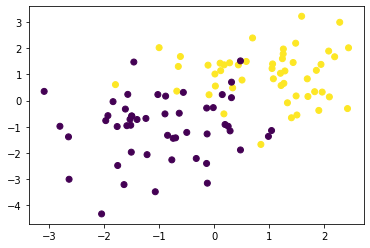

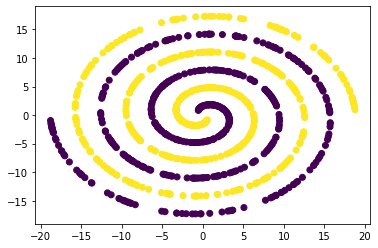

In [4]:
# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

x,d = syn2(100)
plt.figure(2)
plt.scatter(x[:,0],x[:,1], c=d)

x,d = twospirals(500, 3, 0)
plt.figure(4)
plt.scatter(x[:,0],x[:,1], c=d)


### CellName: Statistics (#5)
### CellType: Needed
### Cell instruction: Present result for both classification and regression problems

This cell defines two functions that we are going to call using a trained model to calculate both error and performance measures. 

Run the cell by entering into the cell and press "CTRL Enter".

In [5]:
def stats_class(x = None, y = None, label = 'Training', modl = None):
    """
    input :  
             x = input
             y = output
             label = "Provided text string"
             modl = the model
             
    output : 
             sensitivity = fraction of correctly classified positive cases
             specificity = fraction of correctly classified negative cases
             accuracy = fraction of correctly classified cases
             loss = typically the cross-entropy error
    """
    
    def binary(y1):
        y1[y1>.5] = 1.
        y1[y1<= .5] = 0.        
        return y1

    y_pr = modl.predict(x, batch_size = x.shape[0], verbose=0).reshape(y.shape)
                
    nof_p, tp, nof_n, tn = [np.count_nonzero(k) for k in [y==1, y_pr[y==1.] > 0.5, y==0, y_pr[y==0.]<= 0.5]]
    
    sens = tp / nof_p
    spec = tn / nof_n
    acc = (tp + tn) / (len(y))
    loss = modl.evaluate(x, y , batch_size =  x.shape[0], verbose=0)
                
    A = ['Accuracy', 'Sensitivity', 'Specificity', 'Loss']
    B = [acc, sens, spec, loss[0]]
    
    print('\n','#'*10,'STATISTICS for {} Data'.format(label), '#'*10, '\n')
    for i in range(len(A)):
        print('{:15} {:.4f}'.format(A[i], B[i]))

    return print('\n','#'*50)

def stats_reg(d = None, d_pred = None, label = 'Training', estimat = None):
    
    A = ['MSE', 'CorrCoeff']
    
    pcorr = np.corrcoef(d, d_pred)[1,0]
    
    if label.lower() in ['training', 'trn', 'train']:
        mse = estimat.history['loss'][-1]
    else:
        mse = estimat.history['val_loss'][-1] 

    B = [mse, pcorr]
    
    print('\n','#'*10,'STATISTICS for {} Data'.format(label), '#'*10, '\n')
    for i in range(len(A)):
        print('{:15} {:.10f}'.format(A[i], B[i]))

    return print('\n','#'*50)


### CellName: Confusion (#6)
### CellType: Needed
### Cell Instruction: Plot the confusion matrix

This cell defines the functions need to plot a confusion matrix. A confusion matrix is a summary of the predictions made by a classifier. Each column of the matrix represents the instances of the predicted class while each row represents the instances of the actual class. The function 'plot_confusion_matrix' does the actual plotting, while the 'make_cm_plot' is the one that should be called from the user. See example of usage in the exercises. 

Run the cell by entering into the cell and press "CTRL Enter".

In [6]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    #plt.ylim([-0.5, cm.shape[0]-0.5])

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()
    
def make_cm_plot(model,
            inp,
            trg,
            num_classes,
            label='Test data'):
    
    print('\n','#'*10,'Result for {}'.format(label), '#'*10, '\n')

    y = model.predict(inp, verbose=0 )
    print('log_loss:   ', '{:.4f}'.format(log_loss(trg, y, eps=1e-15)))

    d_class = trg.argmax(axis=1)
    y_class = y.argmax(axis=1)
    print('accuracy:   ', '{:.4f}'.format((y_class==d_class).mean()), '\n')

    class_names = ['class {}'.format(i+1) for i in range(num_classes)]
    print(classification_report(d_class, y_class, target_names=class_names))

    confuTst = confusion_matrix(d_class, y_class)
    plot_confusion_matrix(cm           = confuTst, 
                          normalize    = False,
                          target_names = class_names,
                          title        = "Confusion Matrix")

    

### CellName: Boundary (#7)
### CellType: Needed
### Cell Instruction: Decision boundary

This cell defines the function to plot the decision boundary for a 2D input binary MLP classifier. 

Run the cell by entering into the cell and press "CTRL Enter".

In [7]:
def decision_b(X, Y1, model ):
    
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    # grid stepsize
    h = 0.025

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    Z[Z>.5] = 1
    Z[Z<= .5] = 0

    Y_pr = model.predict(X, batch_size = X.shape[0], verbose=0).reshape(Y1.shape)
  
    Y = np.copy(Y1)
    Y_pr[Y_pr>.5] = 1
    Y_pr[Y_pr<= .5] = 0
    Y[(Y!=Y_pr) & (Y==0)] = 2
    Y[(Y!=Y_pr) & (Y==1)] = 3
    
    
    plt.figure()
    #plt.contourf(xx, yy, Z, cmap=plt.cm.PRGn, alpha = .9) 
    plt.contour(xx, yy, Z, cmap=plt.cm.Paired)
    
    
    plt.scatter(X[:, 0][Y==1], X[:, 1][Y==1], marker='+', c='k')
    plt.scatter(X[:, 0][Y==0], X[:, 1][Y==0], marker='o', c='k')
       
    plt.scatter(X[:, 0][Y==3], X[:, 1][Y==3], marker = '+', c='r')   
    plt.scatter(X[:, 0][Y==2], X[:, 1][Y==2], marker = 'o', c='r')
    
    
    plt.ylabel('x2')
    plt.xlabel('x1')
    plt.show()


### Custom Callbacks

In [8]:
from IPython.display import clear_output

class PlotLearning(keras.callbacks.Callback):
    """
    Callback to plot the learning curves of the model during training.
    """

    def __init__(self, update_freq=1, clear_print=True):
        self.update_freq = update_freq
        self.clear_print = clear_print

    def on_train_begin(self, logs={}):
        self.metrics = {}
        for metric in logs:
            self.metrics[metric] = []
            

    def on_epoch_end(self, epoch, logs={}):
        # Storing metrics
        for metric in logs:
            if metric in self.metrics:
                self.metrics[metric].append(logs.get(metric))
            else:
                self.metrics[metric] = [logs.get(metric)]
        
        if epoch%self.update_freq==0:
            # Plotting
            metrics = [x for x in logs if 'val' not in x]
            
            f, axs = plt.subplots(1, len(metrics), figsize=(15,5))
            if self.clear_print: clear_output(wait=True)

            for i, metric in enumerate(metrics):
                axs[i].plot(range(1, epoch + 2), 
                            self.metrics[metric], 
                            label=metric)
                if logs['val_' + metric]:
                    axs[i].plot(range(1, epoch + 2), 
                                self.metrics['val_' + metric], 
                                label='val_' + metric)
                    
                axs[i].legend()
                axs[i].grid()

            plt.tight_layout()
            plt.show()

import time
class LoadingBarCallback(keras.callbacks.Callback):
    """
    Callback to plot the learning curves of the model during training.
    """

    def __init__(self, update_freq=1, nbro_epochs=None):
        self.update_freq=update_freq
        self.nbro_epochs = nbro_epochs

    def on_train_begin(self, logs={}):
        self.start = time.process_time()
        # print('|{:-^50}|\n|'.format('Training'), end="")
            

    def on_epoch_end(self, epoch, logs={}):
        if ((100*epoch)/self.nbro_epochs)%(2*self.update_freq)==1:
            print('#'*self.update_freq, end="")

    def on_train_end(self, logs={}):
        stop = time.process_time()
        print("| " + str(stop-self.start) + " s")
        # print("|{:-^50}|".format("DONE"))

### 
---
End of "Needed" and "Information" cells. Below are the cells for the actual exercise.

---

## Exercises

### CellName: Ex1 (#8)
### CellType: Exercise
### Cell instruction: Instruction for question 1-3

The cell below should be used for questions 1-3. For question 1 you can run the cell as it is (i.e. CTRL-Return). For the other questions you need to modify the cell in order to change hyper parameters etc. 

From now on we will talk about *performance*! It can be performance of a trained model on the training dataset or the performance on the validation dataset. What do we mean by performance?  For classification problems we will provide 4 different measurements as returned by a call to the *stats_class* function. They are:
* Sensitivity = fraction of correctly classified "1" cases
* Specificity = fraction of correctly classified "0" cases
* Accuracy = fraction of correctly classified cases
* loss = cross-entropy error (so low loss means good performance!)

For the questions in this exercise, accuracy is an appropriate performance measure.

### Question 1
Here you are going to train a classifier for the *syn2* dataset. You are also going to use a validation dataset as an estimate of the *true* performance. Since we generate these datasets we can allow for a relatively large validation dataset in order to get a more accurate estimation of *true* performance. The default value in the cell is to generate 1000 validation data points. 

Now, use *syn2*(100 training data points) and train a *linear* MLP to separate the two classes, i.e. use a single hidden node. **What is the performance you get on the validation dataset?** 

**Note:** Use a fixed random seed for this exercise since you will compare with runs in the next questions.

**Hint:** Remember for the first computer exercise that you should average over a few trained models.

### Question 2
You are now going to train this model to a high training accuracy! By increasing the number of hidden nodes we should be able to get better and better training performance. **(a) How many hidden nodes do you need to reach an accuracy >95% on your training dataset?** **(b) What is the performance on the validation data set?**

**Hint:** Remember from the first computer exercise that overtraining often means finding good local minimum of the loss function, which may require some tuning of the hyper parameters that controls the training. This means that you may have to change the learning rate, batch size and the number of epochs. Since the *Adam* method is usually better than the vanilla *stochastic gradient descent*, it is therefore used in the cells below as the default minimizer. 

### Question 3
However, we are almost always interested in optimal validation performance. You should now find the number of hidden nodes that optimize the validation performance. **(a) What is the optimal number of hidden nodes for the syn2 dataset in order to maximize your validation performance?** **(b) Try to give an explanation for the number you obtained?**


In [9]:
%%time
# seed = 0 means random, seed > 0 means fixed
seed = 3
np.random.seed(seed) if seed else None

# Generate training data
x_trn, d_trn = syn2(100)
x_val, d_val = syn2(1000)

# Standardization of inputs
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std

# Define the network, cost function and minimization method
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [1],                      # architecture
         'drop_nod': 0.0,                   # dropout specification
         'act_fun': 'tanh',                 # activation functions for the hidden layer
         'out_act_fun': 'sigmoid',          # output activation function
         'opt_method': 'Adam',              # minimization method
         'cost_fun': 'binary_crossentropy', # error function
         'lr_rate': 0.05 ,                  # learningrate
         'num_out' : 1 }                    # if binary --> 1 |  regression--> num inputs | multi-class--> num of classes

# Get the model
model_ex1 = mlp(**INPUT)

# Print a summary of the model
model_ex1.summary()

# Train the model
estimator_ex1 = model_ex1.fit(x_trn, d_trn,
                      epochs = 500,      
                      validation_data=(x_val, d_val),
                      batch_size=25,
                      verbose = 0)

print('DONE')

# # Call the stats function to print out statistics for classification problems
    # stats_class(x_trn, d_trn, 'Training', model_ex1)
    # stats_class(x_val, d_val, 'Validation', model_ex1)

    # # Training history
    # plt.figure()
    # plt.ylabel('Loss / Accuracy')
    # plt.xlabel('Epoch')
    # for k in estimator_ex1.history.keys():
    #     plt.plot(estimator_ex1.history[k], label = k) 
    # plt.legend(loc='best')
    # plt.show()

    # # Show the decision boundary for the training dataset
    # decision_b(x_trn, d_trn, model_ex1)

    # # If you uncomment this one you will see how the decsion boundary is with respect to the validation data
    # decision_b(x_val, d_val, model_ex1)


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense (Dense)               (None, 1)                 3         
                                                                 
 dropout (Dropout)           (None, 1)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 2         
                                                                 
Total params: 5
Trainable params: 5
Non-trainable params: 0
_________________________________________________________________



 ########## STATISTICS for Training Data ########## 

Accuracy        0.8400
Sensitivity     0.8600
Specificity     0.8200
Loss            0.3280

 ##################################################

 ########## STATISTICS for Validation Data ########## 

Accuracy        0.8710
Sensitivity     0.9060
Specificity     0.8360
Loss            0.2972

 ##################################################


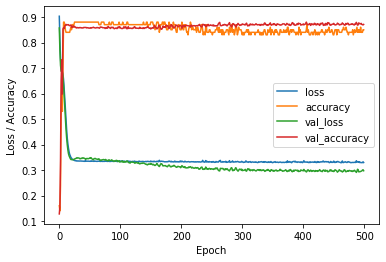

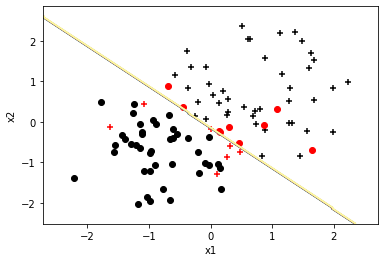

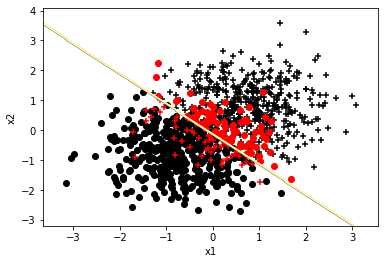

In [18]:

# Call the stats function to print out statistics for classification problems
stats_class(x_trn, d_trn, 'Training', model_ex1)
stats_class(x_val, d_val, 'Validation', model_ex1)

# Training history
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('Epoch')
for k in estimator_ex1.history.keys():
    plt.plot(estimator_ex1.history[k], label = k) 
plt.legend(loc='best')
plt.show()

# Show the decision boundary for the training dataset
decision_b(x_trn, d_trn, model_ex1)

# If you uncomment this one you will see how the decsion boundary is with respect to the validation data
decision_b(x_val, d_val, model_ex1)


### CellName: Ex2 (#9)
### CellType: Exercise
### Cell instruction: Instruction for question 4-6

Now we are going to look at a regression problem. The data as described above (regr2) consists of 6 inputs (features) and one output (target) value. As for the previous exercise a new data set is generated each time you call the *regr2* function. To get exactly the same data set between different calls, use a fixed seed. For this problem we can control the amount of noise added to the target value. We are going to use a relatively small training dataset (250) and a larger validation dataset (1000) to get a more robust estimation of the generalization performance, and 0.4 units of noise. For regression problems we also need new performance measures. The *stats_reg* function will give you two such measures:
* MSE = mean squared error (low error mean good performance)
* CorrCoeff = Pearson correlation coefficient for the scatter plot between predicted and true values.

The cell below can be used as an template for all questions regarding this regression problem.

#### Extra question
The extra questions is provided if you have extra time. **These question are not required for the course and does not influence any grading.** 

Repeat Q4-Q6 using two hidden layers.


In [19]:
%%time
# seed = 0 means random, seed > 0 means fixed
seed = 9
np.random.seed(seed) if seed else None

# Generate training and validation data
x_trn, d_trn = regr2(250, 0.4)
x_val, d_val = regr2(1000, 0.4)

# Standardization of both inputs and targets
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std

mu, std = standard(d_trn)
d_trn = (d_trn - mu) / std
d_val = (d_val - mu) / std

Wall time: 1.99 ms


### Question 4
*Model selection based on the number of hidden nodes (in a single hidden layer).* Find the number of hidden nodes that gives best validation performance. **How many hidden nodes do you find that gives best validation performance?** Make a note of the best validation MSE (or correlation coefficient) you get.

**Hint:** A good strategy is to start with a "small" model and increase the number of hidden nodes and monitor the validation result.  

In [22]:

# Define the network, cost function and minimization method
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [10],                  
         'drop_nod': 0.0,                
         'act_fun': 'tanh',             
         'out_act_fun': 'linear',      
         'opt_method': 'Adam',         
         'cost_fun': 'mse',           
         'lr_rate': 0.025,            
         'metric': 'mse',              
         'lambd' : 0.0,             
         'num_out' : 1 }    

# Get the model
model_ex2 = mlp(**INPUT)

# Print a summary of the model
model_ex2.summary()


#     keras.callbacks.ModelCheckpoint(
    #         filepath="model_ex2_.keras",
    #         save_best_only=True,
    #         monitor="val_loss")
    # ]

    # class CustomCallback(keras.callbacks.Callback):
    #     def on_epoch_end(self, epoch, logs=None):
    #         if epoch == 0:
    #             return
    #         if epoch % 100 == 1:
    #             print('hej')


# Train the model
estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                      epochs = 500,                     
                      validation_data=(x_val,d_val),
                      batch_size=50,                    
                      verbose = 0)


    # # Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
    # pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
    # pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
    # stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
    # stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

    # # Scatter plots of predicted and true values
    # plt.figure()
    # plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
    # plt.legend()
    # plt.figure()
    # plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
    # plt.legend()
    # plt.show()


    # # Training history
    # plt.figure()
    # plt.ylabel('Loss')
    # plt.xlabel('Epoch')
    # for k in ['loss', 'val_loss']:
    #     plt.plot(estimator_ex2.history[k], label = k) 
    # plt.legend(loc='best')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_4 (Dense)             (None, 10)                70        
                                                                 
 dropout_2 (Dropout)         (None, 10)                0         
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 81
Trainable params: 81
Non-trainable params: 0
_________________________________________________________________



 ########## STATISTICS for Training Data ########## 

MSE             0.1142249629
CorrCoeff       0.9462359251

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5765765905
CorrCoeff       0.6909300316

 ##################################################


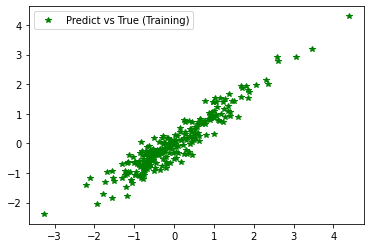

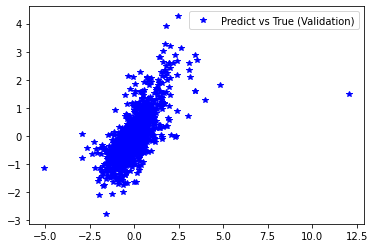

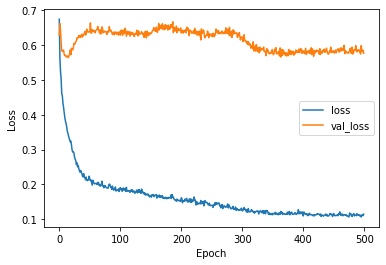

In [23]:

# Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

# Scatter plots of predicted and true values
plt.figure()
plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
plt.legend()
plt.figure()
plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
plt.legend()
plt.show()


# Training history
plt.figure()
plt.ylabel('Loss')
plt.xlabel('Epoch')
for k in ['loss', 'val_loss']:
    plt.plot(estimator_ex2.history[k], label = k) 
plt.legend(loc='best')

### Question 5
*Model selection based on L2 (weight decay).* Instead of using the number of hidden nodes to control the complexity we can use a regularization term added to the error function. You are going to control the complexity by adding a *L2* regularizer (see the "INPUT" dictionary in the cell). For the L2 regularization to make sense we need a start model that is capable being overtrained. The suggestion is to use at least twice as many hidden nodes for this question compared to what you found in Q4. You should modify the *L2* value until you find optimal validation performance. **(a) Present your optimal model (L2 value and number of hidden nodes) and the validation performance.** **(b) Do you obtain a better result compared to Q4?**


In [24]:

# Define the network, cost function and minimization method
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [15],                  
         'drop_nod': 0.0,                
         'act_fun': 'tanh',             
         'out_act_fun': 'linear',      
         'opt_method': 'Adam',         
         'cost_fun': 'mse',           
         'lr_rate': 0.025,            
         'metric': 'mse',              
         'lambd' : 0.01,             
         'num_out' : 1 }    

# Get the model
model_ex2 = mlp(**INPUT)

# Print a summary of the model
model_ex2.summary()


callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="q5_model.keras",
        save_best_only=True,
        monitor="val_loss")
]

# Train the model
estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                      epochs = 500,                     
                      validation_data=(x_val,d_val),
                      batch_size=50,
                      callbacks = callbacks,                    
                      verbose = 0)




Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_6 (Dense)             (None, 15)                105       
                                                                 
 dropout_3 (Dropout)         (None, 15)                0         
                                                                 
 dense_7 (Dense)             (None, 1)                 16        
                                                                 
Total params: 121
Trainable params: 121
Non-trainable params: 0
_________________________________________________________________



 ########## STATISTICS for Training Data ########## 

MSE             0.2230516672
CorrCoeff       0.9321636988

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.3956722617
CorrCoeff       0.8276116617

 ##################################################


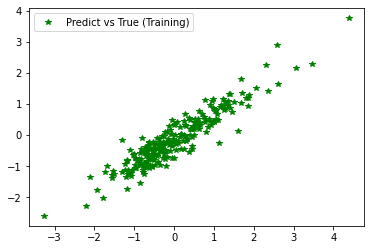

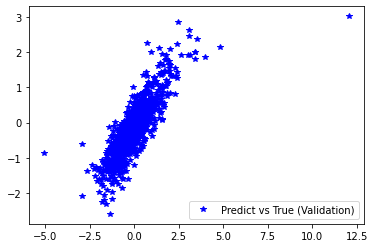

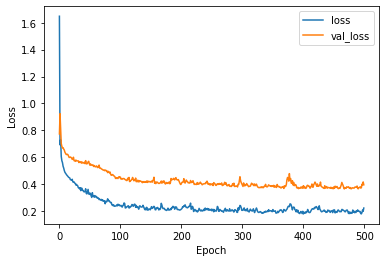

In [25]:

# Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

# Scatter plots of predic.
# ted and true values
plt.figure()
plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
plt.legend()
plt.figure()
plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
plt.legend()
plt.show()


# Training history
plt.figure()
plt.ylabel('Loss')
plt.xlabel('Epoch')
for k in ['loss', 'val_loss']:
    plt.plot(estimator_ex2.history[k], label = k) 
plt.legend(loc='best')

### Question 6
*Model selection based on dropout.* Instead of using the *L2* regularizer we can use dropout. In short, repeat Q5, but use the *dropout* parameter instead. **(a) Present your optimal model (dropout value and number of hidden nodes) and the validation performance.** **(b) Do you obtain a better result compared to Q4/Q5?** 

**Hint:** Using dropout may require even more hidden nodes to start with! 


##### New

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 6)]               0         
                                                                 
 dense_24 (Dense)            (None, 8)                 56        
                                                                 
 dropout_12 (Dropout)        (None, 8)                 0         
                                                                 
 dense_25 (Dense)            (None, 1)                 9         
                                                                 
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________


100%|██████████| 500/500 [00:32<00:00, 15.36epoch/s, loss=0.392, mse=0.392, val_loss=0.583, val_mse=0.583]



 ########## STATISTICS for Training Data ########## 

MSE             0.3915282190
CorrCoeff       0.8398650101

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5827288628
CorrCoeff       0.6561598008

 ##################################################


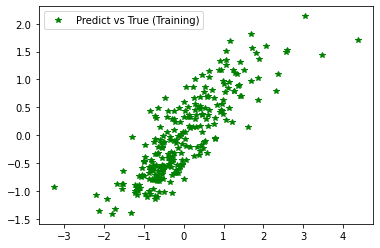

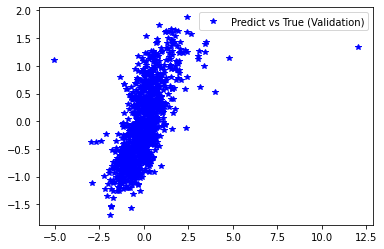

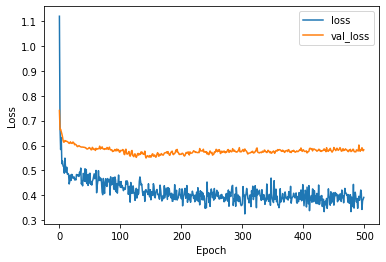

In [22]:
# Define the network, cost function and minimization method
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [8],                  
         'drop_nod': 0.2,                
         'act_fun': 'tanh',             
         'out_act_fun': 'linear',      
         'opt_method': 'Adam',         
         'cost_fun': 'mse',           
         'lr_rate': 0.025,            
         'metric': 'mse',              
         'lambd' : 0.0,             
         'num_out' : 1 }    

# Get the model
model_ex2 = mlp(**INPUT)

# Print a summary of the model
model_ex2.summary()

# Train the model
estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                      epochs = 500,                     
                      validation_data=(x_val,d_val),
                      batch_size=50,
                      callbacks=[TqdmCallback(verbose=1)],
                      verbose = 0)



# Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

# Scatter plots of predic.
# ted and true values
plt.figure()
plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
plt.legend()
plt.figure()
plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
plt.legend()
plt.show()


# Training history
plt.figure()
plt.ylabel('Loss')
plt.xlabel('Epoch')
for k in ['loss', 'val_loss']:
    plt.plot(estimator_ex2.history[k], label = k) 
plt.legend(loc='best')

##### Base

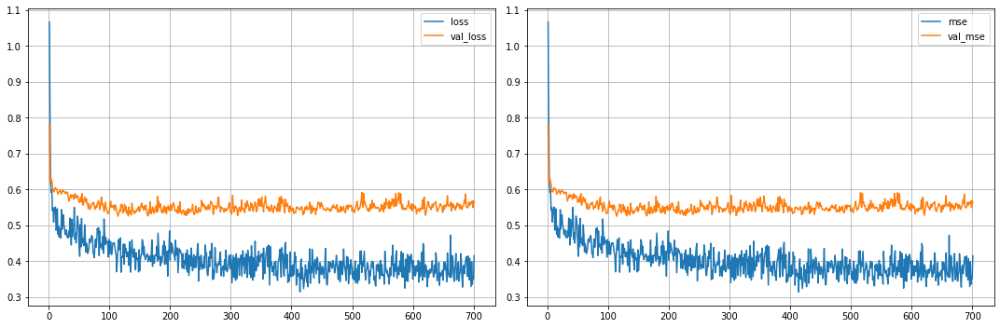

4/4 [==============================] - 1s 228ms/step - loss: 0.4143 - mse: 0.4143 - val_loss: 0.5629 - val_mse: 0.5629
Epoch 702/2000
4/4 [==============================] - 0s 44ms/step - loss: 0.3812 - mse: 0.3812 - val_loss: 0.5735 - val_mse: 0.5735
Epoch 703/2000
4/4 [==============================] - 0s 44ms/step - loss: 0.3855 - mse: 0.3855 - val_loss: 0.5795 - val_mse: 0.5795
Epoch 704/2000
4/4 [==============================] - 0s 40ms/step - loss: 0.3531 - mse: 0.3531 - val_loss: 0.5673 - val_mse: 0.5673
Epoch 705/2000
4/4 [==============================] - 0s 46ms/step - loss: 0.3607 - mse: 0.3607 - val_loss: 0.5668 - val_mse: 0.5668
Epoch 706/2000
4/4 [==============================] - 0s 45ms/step - loss: 0.3429 - mse: 0.3429 - val_loss: 0.5687 - val_mse: 0.5687
Epoch 707/2000
4/4 [==============================] - 0s 38ms/step - loss: 0.3576 - mse: 0.3576 - val_loss: 0.5515 - val_mse: 0.5515
Epoch 708/2000
4/4 [==============================] - 0s 41ms/step - loss: 0.3515 -

KeyboardInterrupt: 

In [135]:

# Define the network, cost function and minimization method
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [50],                  
         'drop_nod': 0.5,                
         'act_fun': 'tanh',             
         'out_act_fun': 'linear',      
         'opt_method': 'Adam',         
         'cost_fun': 'mse',           
         'lr_rate': 0.025,            
         'metric': 'mse',              
         'lambd' : 0.0,             
         'num_out' : 1 }
             
# Get the model
model_ex2 = mlp(**INPUT)

# Print a summary of the model
model_ex2.summary()

# callbacks = [
#     keras.callbacks.ModelCheckpoint(
#         filepath="q6_model.keras",
#         save_best_only=True,
#         monitor="val_mse")
# ]
    
# Train the model
estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                      epochs = 2000,                     
                      validation_data=(x_val,d_val),
                      batch_size=64,
                    #   callbacks=[TqdmCallback(verbose=1)],                    
                      # callbacks=[TqdmCallback(verbose=1),PlotLearning(update_freq=10)],                    
                      callbacks=[PlotLearning(update_freq=100)],                    
                      verbose = 1)




 ########## STATISTICS for Training Data ########## 

MSE             0.2686966062
CorrCoeff       0.9279280542

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.6335136294
CorrCoeff       0.6288953474

 ##################################################


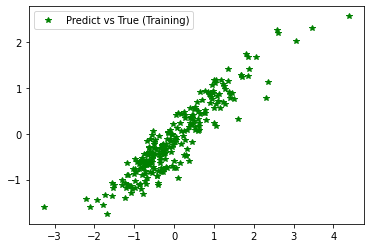

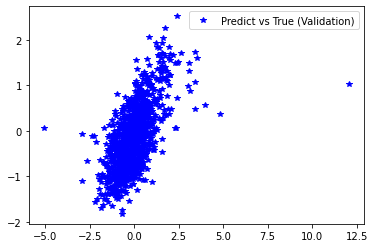

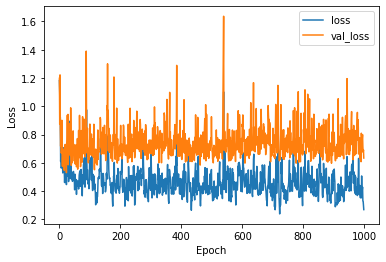

In [94]:
# model_ex2 = keras.models.load_model("q6_model.keras")
# Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

# Scatter plots of predicted and true values
plt.figure()
plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
plt.legend()
plt.figure()
plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
plt.legend()
plt.show()


# Training history
plt.figure()
plt.ylabel('Loss')
plt.xlabel('Epoch')
for k in ['loss', 'val_loss']:
    plt.plot(estimator_ex2.history[k], label = k) 
plt.legend(loc='best')

#### Loops

##### Loopediloop


----------------------------------------------------------------------
-----------------------Nodes: 15   Dropout: 0.1-----------------------
----------------------------------------------------------------------

 ########## STATISTICS for Training Data ########## 

MSE             0.2378156930
CorrCoeff       0.9248204043

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5251716971
CorrCoeff       0.7006668438

 ##################################################


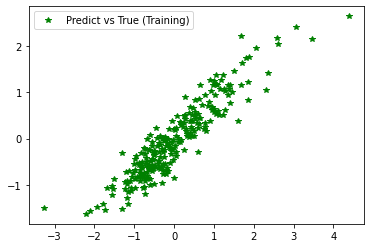

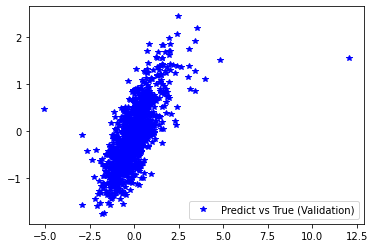


----------------------------------------------------------------------
----------------------Nodes: 15   Dropout: 0.15-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.2818017006
CorrCoeff       0.9111329489

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5550766587
CorrCoeff       0.6777300126

 ##################################################


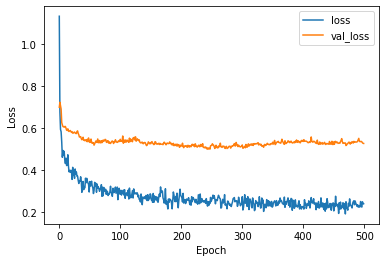

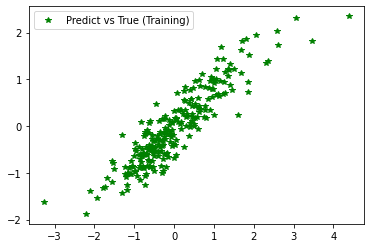

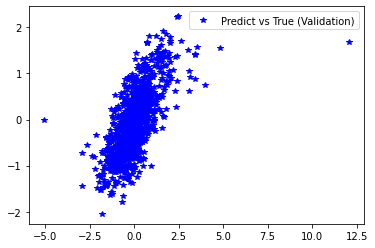


----------------------------------------------------------------------
-----------------------Nodes: 15   Dropout: 0.2-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.3330362141
CorrCoeff       0.9081541457

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5777312517
CorrCoeff       0.6618652622

 ##################################################


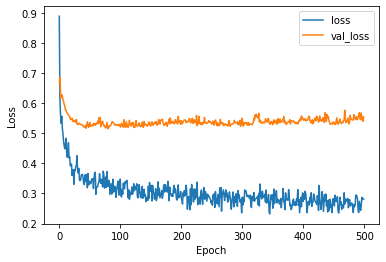

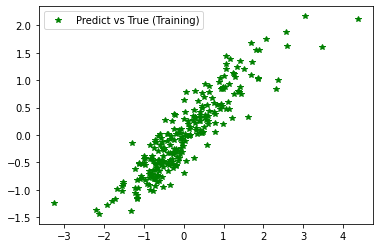

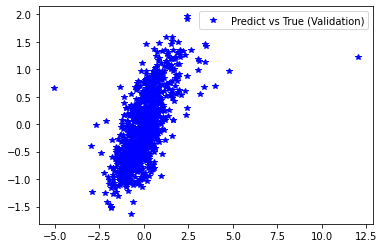


----------------------------------------------------------------------
----------------------Nodes: 15   Dropout: 0.25-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.2935034633
CorrCoeff       0.8761271517

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5750743747
CorrCoeff       0.6617979337

 ##################################################


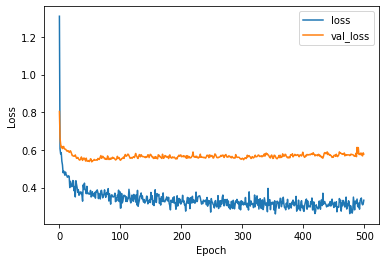

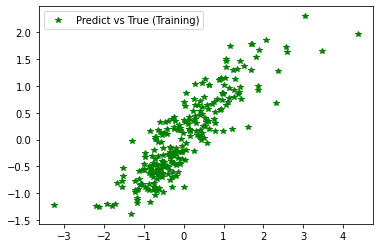

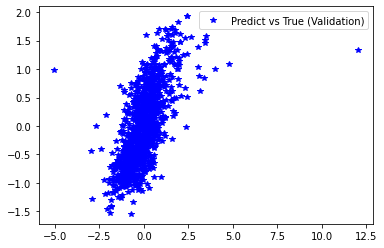


----------------------------------------------------------------------
-----------------------Nodes: 15   Dropout: 0.3-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
  4%|▍         | 20/500 [05:05<2:02:01, 15.25s/epoch, loss=0.4, mse=0.4, val_loss=0.552, val_mse=0.552]












  3%|▎         | 16/500 [04:46<2:24:33, 17.92s/epoch, loss=0.395, mse=0.395, val_loss=0.587, val_mse=0.587]
100%|██████████| 5.00/5.00 [04:42<00:00, 56.5s/batch, loss=0.388, mse=0.388]
  0%|          | 0/500 [04:37<?, ?epoch/s]



 ########## STATISTICS for Training Data ########## 

MSE             0.3790256381
CorrCoeff       0.8593066290

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5819304585
CorrCoeff       0.6636328125

 ##################################################


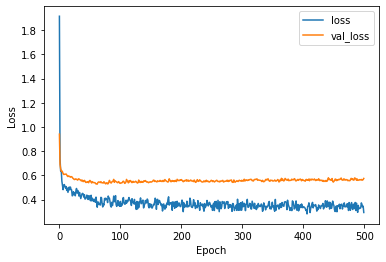

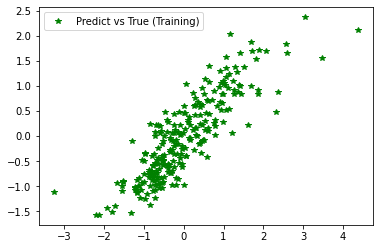

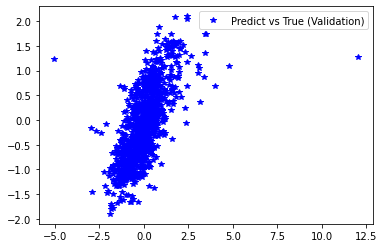


----------------------------------------------------------------------
----------------------Nodes: 15   Dropout: 0.35-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.3844251931
CorrCoeff       0.8507390616

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5795137882
CorrCoeff       0.6583297130

 ##################################################


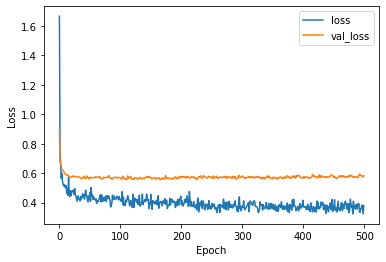

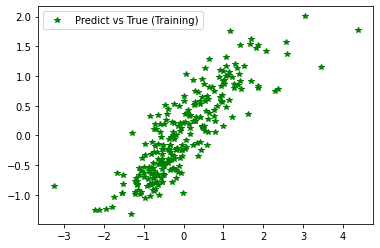

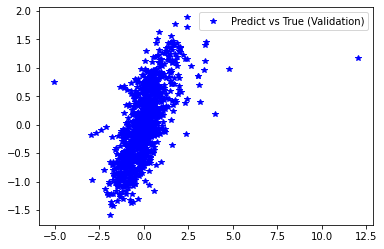


----------------------------------------------------------------------
-----------------------Nodes: 15   Dropout: 0.4-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.4185166061
CorrCoeff       0.8312856208

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5894865990
CorrCoeff       0.6547485180

 ##################################################


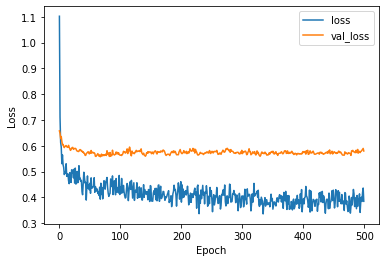

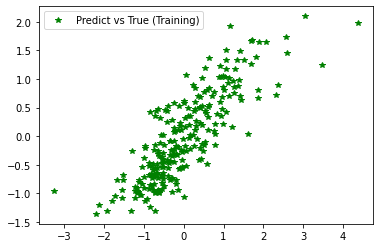

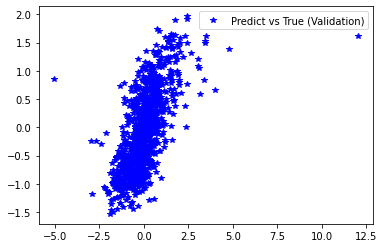


----------------------------------------------------------------------
----------------------Nodes: 15   Dropout: 0.45-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.4451491237
CorrCoeff       0.8289374612

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.6053631306
CorrCoeff       0.6439810916

 ##################################################


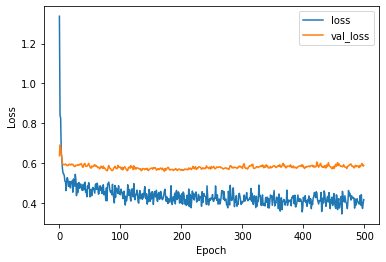

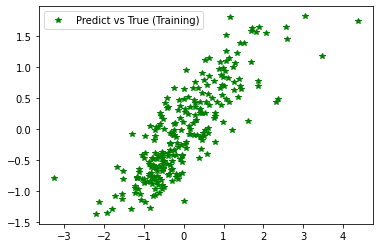

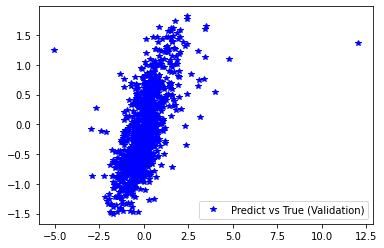


----------------------------------------------------------------------
-----------------------Nodes: 15   Dropout: 0.5-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



 ########## STATISTICS for Training Data ########## 

MSE             0.4882080853
CorrCoeff       0.7924117035

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5908453465
CorrCoeff       0.6534178688

 ##################################################


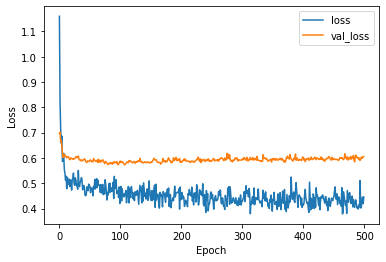

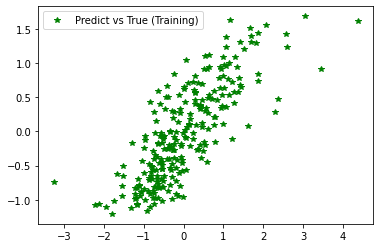

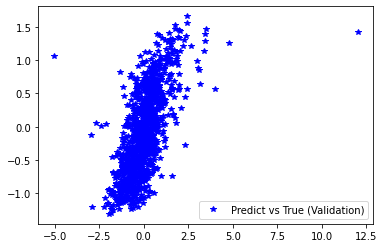


----------------------------------------------------------------------
-----------------------Nodes: 20   Dropout: 0.1-----------------------
----------------------------------------------------------------------


C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


KeyboardInterrupt: 

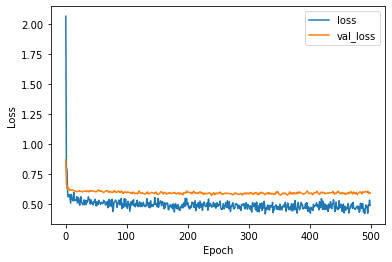

In [59]:
for no_nodes in [15, 20, 25, 30]:
    for drop in [0.1, 0.15, 0.20, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:

        print("\n" + 70*"-" + 
        "\n{:-^70}\n".format('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop)) + 
        "-"*70)

        # Define the network, cost function and minimization method
        INPUT = {'inp_dim': x_trn.shape[1],         
                #  'n_nod': [25],                  
                'n_nod': [no_nodes],                  
                #  'drop_nod': 0.1,                
                'drop_nod': drop,                
                'act_fun': 'tanh',             
                'out_act_fun': 'linear',      
                'opt_method': 'Adam',         
                'cost_fun': 'mse',           
                'lr_rate': 0.025,            
                'metric': 'mse',              
                'lambd' : 0.0,             
                'num_out' : 1 }
                    
        # Get the model
        model_ex2 = mlp(**INPUT)

        # Print a summary of the model
        # model_ex2.summary()

        # callbacks = [
        #     keras.callbacks.ModelCheckpoint(
        #         filepath="q6_model.keras",
        #         save_best_only=True,
        #         monitor="val_mse")
        # ]
            
        # Train the model
        estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                            epochs = 500,                     
                            validation_data=(x_val,d_val),
                            batch_size=50,
                            # callbacks=[TqdmCallback(verbose=1)],                    
                            verbose = 0)



        # model_ex2 = keras.models.load_model("q5_model.keras")
        # Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
        pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
        pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
        stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
        stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

        # Scatter plots of predicted and true values
        plt.figure()
        plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
        plt.legend()
        plt.figure()
        plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
        plt.legend()
        plt.show()


        # Training history
        plt.figure()
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        for k in ['loss', 'val_loss']:
            plt.plot(estimator_ex2.history[k], label = k) 
        plt.legend(loc='best')

##### Loop 2


----------------------------------------------------------------------
-----------------------Nodes: 20   Dropout: 0.1-----------------------
----------------------------------------------------------------------

 ########## STATISTICS for Training Data ########## 

MSE             0.2115818411
CorrCoeff       0.9443814122

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5779018998
CorrCoeff       0.6698189985

 ##################################################

----------------------------------------------------------------------
----------------------Nodes: 20   Dropout: 0.15-----------------------
----------------------------------------------------------------------

 ########## STATISTICS for Training Data ########## 

MSE             0.2614607811
CorrCoeff       0.9241960981

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE            

C:\Users\nilsb\AppData\Local\Temp/ipykernel_6972/61126961.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()



 ########## STATISTICS for Training Data ########## 

MSE             0.2709365785
CorrCoeff       0.9249195783

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5186086893
CorrCoeff       0.7024682519

 ##################################################

----------------------------------------------------------------------
-----------------------Nodes: 30   Dropout: 0.3-----------------------
----------------------------------------------------------------------

 ########## STATISTICS for Training Data ########## 

MSE             0.3305069804
CorrCoeff       0.9016714224

 ##################################################

 ########## STATISTICS for Validation Data ########## 

MSE             0.5372664332
CorrCoeff       0.6911359981

 ##################################################

----------------------------------------------------------------------
----------------------Nodes: 30   Dropout: 0.3

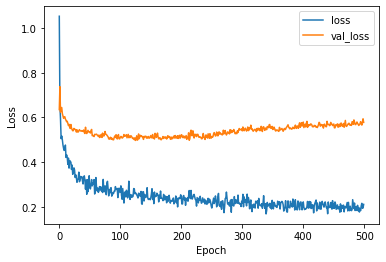

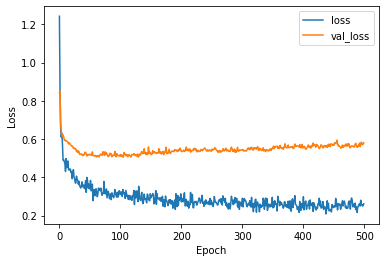

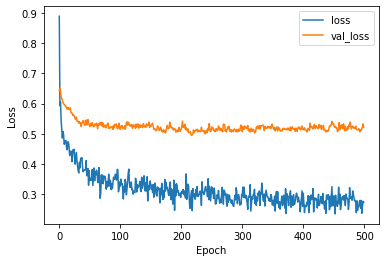

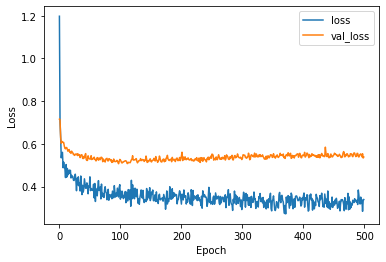

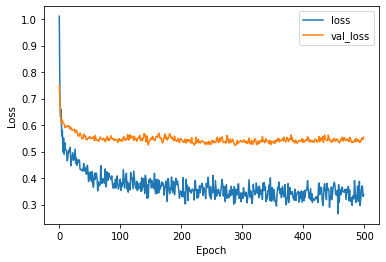

...

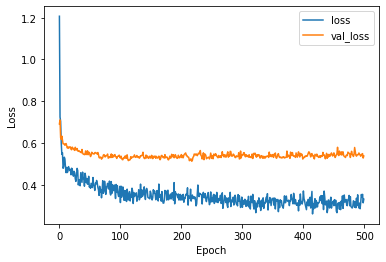

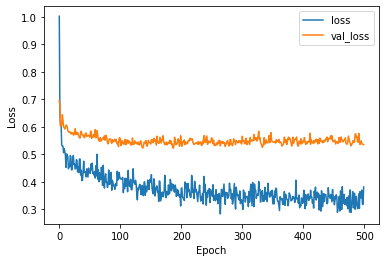

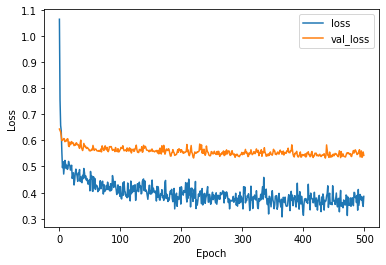

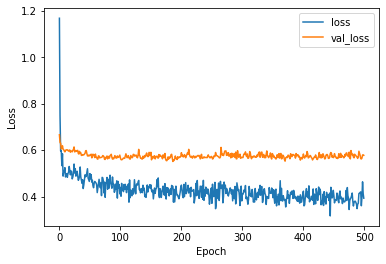

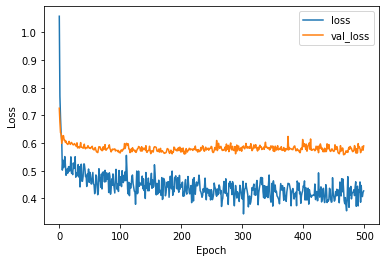

In [62]:
for no_nodes in [20, 25, 30]:
    for drop in [0.1, 0.15, 0.20, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:

        print("\n" + 70*"-" + 
        "\n{:-^70}\n".format('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop)) + 
        "-"*70)

        # Define the network, cost function and minimization method
        INPUT = {'inp_dim': x_trn.shape[1],         
                #  'n_nod': [25],                  
                'n_nod': [no_nodes],                  
                #  'drop_nod': 0.1,                
                'drop_nod': drop,                
                'act_fun': 'tanh',             
                'out_act_fun': 'linear',      
                'opt_method': 'Adam',         
                'cost_fun': 'mse',           
                'lr_rate': 0.025,            
                'metric': 'mse',              
                'lambd' : 0.0,             
                'num_out' : 1 }
                    
        # Get the model
        model_ex2 = mlp(**INPUT)

        # Print a summary of the model
        # model_ex2.summary()

        # callbacks = [
        #     keras.callbacks.ModelCheckpoint(
        #         filepath="q6_model.keras",
        #         save_best_only=True,
        #         monitor="val_mse")
        # ]
            
        # Train the model
        estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                            epochs = 500,                     
                            validation_data=(x_val,d_val),
                            batch_size=50,
                            # callbacks=[TqdmCallback(verbose=1)],                    
                            callbacks=[],                    
                            verbose = 0)



        # model_ex2 = keras.models.load_model("q5_model.keras")
        # Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
        pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
        pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
        stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
        stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

        # Scatter plots of predicted and true values
        # plt.figure()
        # plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
        # plt.legend()
        # plt.figure()
        # plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
        # plt.legend()
        # plt.show()


        # Training history
        plt.figure()
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        for k in ['loss', 'val_loss']:
            plt.plot(estimator_ex2.history[k], label = k) 
        plt.legend(loc='best')

##### Loop 3


-----------------------Nodes: 50   Dropout: 0.2-----------------------


 ########## STATISTICS for Validation Data ########## 

MSE             0.4765149355
CorrCoeff       0.7316070317

 ##################################################


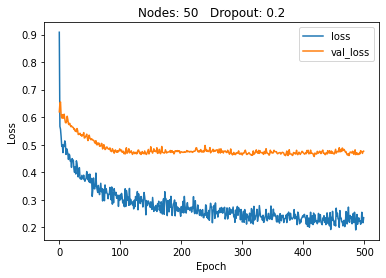


-----------------------Nodes: 50   Dropout: 0.2-----------------------


 ########## STATISTICS for Validation Data ########## 

MSE             0.4895805120
CorrCoeff       0.7249200892

 ##################################################


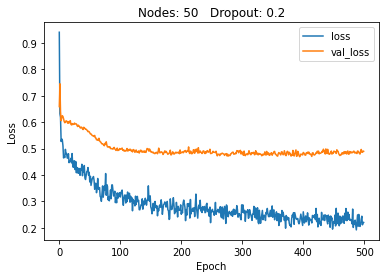


-----------------------Nodes: 50   Dropout: 0.2-----------------------


 ########## STATISTICS for Validation Data ########## 

MSE             0.4854275286
CorrCoeff       0.7268299717

 ##################################################


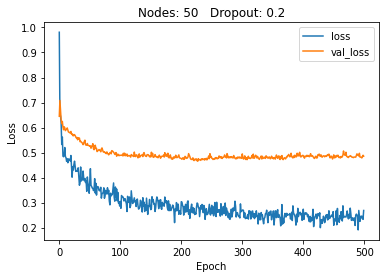


-----------------------Nodes: 50   Dropout: 0.2-----------------------


 ########## STATISTICS for Validation Data ########## 

MSE             0.4852751791
CorrCoeff       0.7250515195

 ##################################################


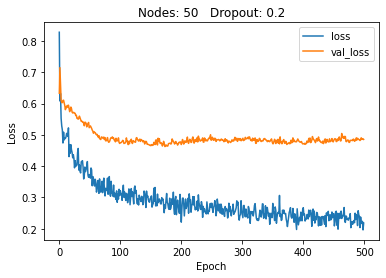


-----------------------Nodes: 50   Dropout: 0.2-----------------------



  8%|▊         | 38/500 [02:47<33:58,  4.41s/epoch, loss=0.366, mse=0.366, val_loss=0.55, val_mse=0.55]










  4%|▍         | 22/500 [02:43<59:04,  7.42s/epoch, loss=0.393, mse=0.393, val_loss=0.578, val_mse=0.578]

  4%|▎         | 18/500 [02:30<1:07:22,  8.39s/epoch, loss=0.444, mse=0.444, val_loss=0.56, val_mse=0.56]






 ########## STATISTICS for Validation Data ########## 

MSE             0.5016086698
CorrCoeff       0.7153971324

 ##################################################


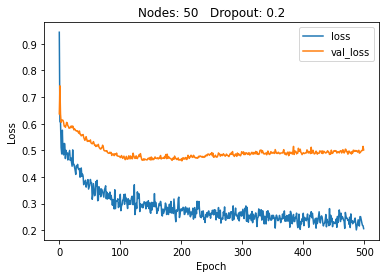

In [179]:
no_nodes = 50
for drop in [0.2]:#, 0.15, 0.2, 0.25]:
    for i in range(5):

        # print("\n" + 70*"-" + 
        # "\n{:-^70}\n".format('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop)) + 
        # "-"*70)

        print("\n{:-^70}\n".format('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop)))

        # Define the network, cost function and minimization method
        INPUT = {'inp_dim': x_trn.shape[1],         
                #  'n_nod': [30],                  
                'n_nod': [no_nodes],                  
                #  'drop_nod': 0.1,                
                'drop_nod': drop,                
                'act_fun': 'tanh',             
                'out_act_fun': 'linear',      
                'opt_method': 'Adam',         
                'cost_fun': 'mse',           
                'lr_rate': 0.01,            
                'metric': 'mse',              
                'lambd' : 0.0,             
                'num_out' : 1 }
                    
        # Get the model
        model_ex2 = mlp(**INPUT)

        # Print a summary of the model
        # model_ex2.summary()
            
        # Train the model
        estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                            epochs = 500,                     
                            validation_data=(x_val,d_val),
                            batch_size=50,
                            # callbacks=[TqdmCallback(verbose=1)],
                            # callbacks=[],                    
                            verbose = 0)



        # model_ex2 = keras.models.load_model("q5_model.keras")
        # Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
        # pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
        pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
        # stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
        stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

    # Scatter plots of predicted and true values
        # plt.figure()
        # plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
        # plt.legend()
        # plt.figure()
        # plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
        # plt.legend()
        # plt.show()


        # Training history
        plt.figure()
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        for k in ['loss', 'val_loss']:
            plt.plot(estimator_ex2.history[k], label = k) 
        plt.legend(loc='best')
        plt.title('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop))
        plt.show()

In [168]:
no_nodes = 30
for drop in [0.1]:#, 0.15, 0.2, 0.25]:
    for i in range(5):

        # print("\n" + 70*"-" + 
        # "\n{:-^70}\n".format('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop)) + 
        # "-"*70)

        print("\n{:-^70}\n".format('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop)))

        # Define the network, cost function and minimization method
        INPUT = {'inp_dim': x_trn.shape[1],         
                #  'n_nod': [30],                  
                'n_nod': [no_nodes],                  
                #  'drop_nod': 0.1,                
                'drop_nod': drop,                
                'act_fun': 'tanh',             
                'out_act_fun': 'linear',      
                'opt_method': 'Adam',         
                'cost_fun': 'mse',           
                'lr_rate': 0.025,            
                'metric': 'mse',              
                'lambd' : 0.0,             
                'num_out' : 1 }
                    
        # Get the model
        model_ex2 = mlp(**INPUT)

        # Print a summary of the model
        # model_ex2.summary()
            
        # Train the model
        estimator_ex2 = model_ex2.fit(x_trn, d_trn,
                            epochs = 500,                     
                            validation_data=(x_val,d_val),
                            batch_size=50,
                            callbacks=[TqdmCallback(verbose=1)],
                            # callbacks=[],                    
                            verbose = 0)



        # model_ex2 = keras.models.load_model("q5_model.keras")
        # Call the stat_reg to get MSE and correlation coefficiant for the scatter plot
        # pred_trn = model_ex2.predict(x_trn).reshape(d_trn.shape)
        pred_val = model_ex2.predict(x_val).reshape(d_val.shape)
        # stats_reg(d_trn, pred_trn, 'Training', estimator_ex2)
        stats_reg(d_val, pred_val, 'Validation', estimator_ex2)

    # Scatter plots of predicted and true values
        # plt.figure()
        # plt.plot(d_trn, pred_trn, 'g*', label='Predict vs True (Training)')
        # plt.legend()
        # plt.figure()
        # plt.plot(d_val, pred_val, 'b*', label='Predict vs True (Validation)')
        # plt.legend()
        # plt.show()


        # Training history
        plt.figure()
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        for k in ['loss', 'val_loss']:
            plt.plot(estimator_ex2.history[k], label = k) 
        plt.legend(loc='best')
        plt.title('Nodes: ' + str(no_nodes) + "   Dropout: " + str(drop))
        plt.show()


-----------------------Nodes: 30   Dropout: 0.1-----------------------



  1%|          | 26/5000 [1:14:34<237:46:47, 172.10s/epoch, loss=0.457, accuracy=0.91, val_loss=0.462, val_accuracy=0.925]




KeyboardInterrupt: 

### CellName: Ex3 (#10)
### CellType: Exercise
### Cell instruction: Instruction for question 7-8

For this exercise you are given a classification problem with a fixed training-, validation- and test dataset. The data is the Japanse vowels dataset described in the first cell. Your task is to do model selection, coming up with your optimal MLP architecture together with the hyperparameters you used. We provide less code here, normalization of the input data and the definition of the MLP is missing. You need to provide that on your own.

#### Question 7
**Present an MLP with associated hyperparameters that maximizes the validation performance and give the test performance you obtained.**

**Hint 1:** 
Remember to normalize input data.

**Hint 2:** 
This problem is a 9-class classification problem, meaning that you should use a specific output activation function (*out_act_fun*) and a specific loss/error function (*cost_fun*).

#### Question 8
The typical goal is to have a high accuracy (i.e. the fraction of correctly classified cases). During training we typically monitor possible overtraining by looking at the *loss* of the validation data, since this is the error used during training. One can however have a situation where the loss increases for the validation data but the accuracy stays constant (**why?**). **Given this situation, what would be your criteria to select the best model?** 


#### New

In [165]:
%%time

# Load the data
x_trn, d_trn, x_val, d_val, x_tst, d_tst = vowels()

# # YOUR CODE FOR NORMALIZATION
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

num_classes = 9

# YOUR CODE THAT DEFINES THE MLP
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [200],                  
         'drop_nod': 0.5,                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.005,            
         'metric': 'accuracy',              
         'lambd' : 0.05,             
         'num_out' : num_classes }    

# Get the model
model_vowels = mlp(**INPUT)

# Print a summary of the model
model_vowels.summary()

# Train the model
estimator_vowels = model_vowels.fit(x_trn, d_trn,
                      epochs = 1000,     
                      validation_data=(x_val,d_val),
                      batch_size=512,   
                      callbacks=[TqdmCallback(verbose=1)],       
                      verbose = 0)




Model: "model_87"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 12)]              0         
                                                                 
 dense_184 (Dense)           (None, 200)               2600      
                                                                 
 dropout_96 (Dropout)        (None, 200)               0         
                                                                 
 dense_185 (Dense)           (None, 9)                 1809      
                                                                 
Total params: 4,409
Trainable params: 4,409
Non-trainable params: 0
_________________________________________________________________


100%|██████████| 1000/1000 [01:00<00:00, 16.66epoch/s, loss=0.226, accuracy=0.954, val_loss=0.286, val_accuracy=0.937]

Wall time: 1min


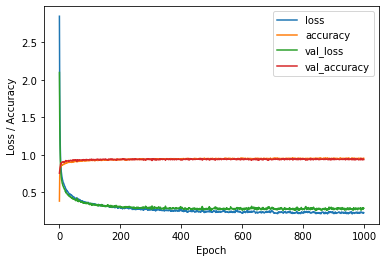


 ########## Result for Training data ########## 

log_loss:    0.0634
accuracy:    0.9843 

              precision    recall  f1-score   support

     class 1       0.98      0.99      0.98       542
     class 2       0.98      0.98      0.98       465
     class 3       0.99      0.98      0.98       424
     class 4       0.99      0.99      0.99       606
     class 5       0.99      0.99      0.99       397
     class 6       1.00      1.00      1.00       523
     class 7       1.00      0.99      1.00       506
     class 8       0.94      0.95      0.95       377
     class 9       0.99      0.97      0.98       434

    accuracy                           0.98      4274
   macro avg       0.98      0.98      0.98      4274
weighted avg       0.98      0.98      0.98      4274



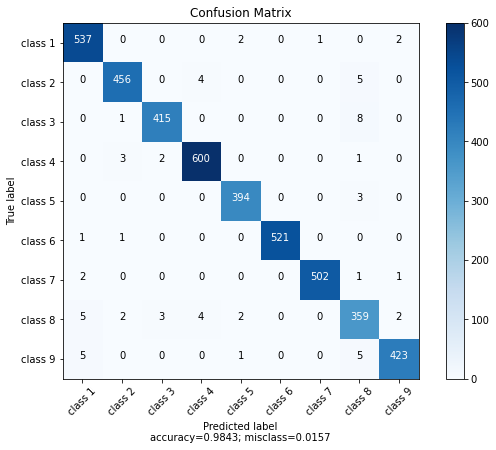


 ########## Result for Validation data ########## 

log_loss:    0.1947
accuracy:    0.9367 

              precision    recall  f1-score   support

     class 1       0.95      0.99      0.97       214
     class 2       0.84      0.89      0.86       203
     class 3       0.96      0.94      0.95       467
     class 4       0.98      0.90      0.94       365
     class 5       0.97      0.95      0.96       158
     class 6       0.98      1.00      0.99       169
     class 7       0.99      0.98      0.98       281
     class 8       0.86      0.89      0.88       264
     class 9       0.86      0.92      0.89       154

    accuracy                           0.94      2275
   macro avg       0.93      0.94      0.94      2275
weighted avg       0.94      0.94      0.94      2275



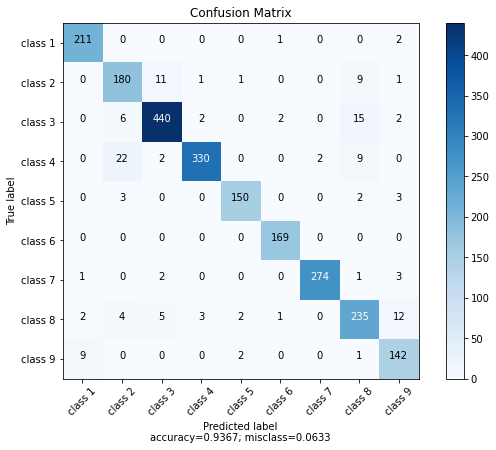


 ########## Result for Test data ########## 

log_loss:    0.1862
accuracy:    0.9417 

              precision    recall  f1-score   support

     class 1       0.94      0.99      0.96       340
     class 2       0.89      0.89      0.89       323
     class 3       0.96      0.95      0.95       723
     class 4       0.97      0.92      0.95       502
     class 5       0.95      0.99      0.97       227
     class 6       0.98      1.00      0.99       271
     class 7       0.99      0.98      0.99       383
     class 8       0.86      0.89      0.87       370
     class 9       0.90      0.90      0.90       273

    accuracy                           0.94      3412
   macro avg       0.94      0.94      0.94      3412
weighted avg       0.94      0.94      0.94      3412



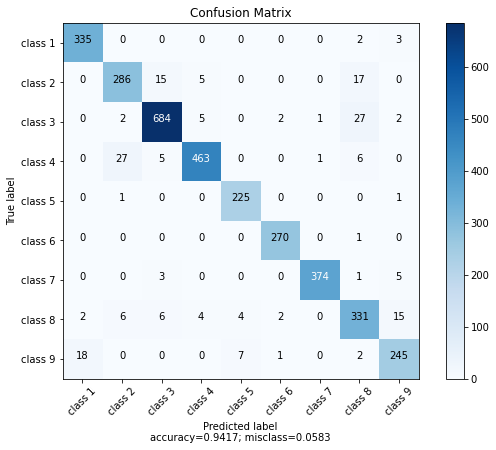

In [166]:

# Plot the learning curves
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('Epoch')
for k in estimator_vowels.history.keys():
    plt.plot(estimator_vowels.history[k], label = k) 
plt.legend()
plt.show()

# plot the confusion matrix
make_cm_plot(model_vowels, x_trn, d_trn, num_classes, 'Training data')
make_cm_plot(model_vowels, x_val, d_val, num_classes, 'Validation data')
make_cm_plot(model_vowels, x_tst, d_tst, num_classes, 'Test data')

In [ ]:
%%time

# Load the data
x_trn, d_trn, x_val, d_val, x_tst, d_tst = vowels()

# # YOUR CODE FOR NORMALIZATION
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

num_classes = 9

# YOUR CODE THAT DEFINES THE MLP
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [200, 200],                  
         'drop_nod': 0.5,                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.005,            
         'metric': 'accuracy',              
         'lambd' : 0.05,             
         'num_out' : num_classes }    

# Get the model
model_vowels = mlp(**INPUT)

# Print a summary of the model
model_vowels.summary()

# Train the model
estimator_vowels = model_vowels.fit(x_trn, d_trn,
                      epochs = 5000,     
                      validation_data=(x_val,d_val),
                      batch_size=512,   
                      callbacks=[TqdmCallback(verbose=1)],       
                      verbose = 0)




Model: "model_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 12)]              0         
                                                                 
 dense_173 (Dense)           (None, 200)               2600      
                                                                 
 dropout_90 (Dropout)        (None, 200)               0         
                                                                 
 dense_174 (Dense)           (None, 200)               40200     
                                                                 
 dropout_91 (Dropout)        (None, 200)               0         
                                                                 
 dense_175 (Dense)           (None, 9)                 1809      
                                                                 
Total params: 44,609
Trainable params: 44,609
Non-trainabl

100%|██████████| 5000/5000 [05:56<00:00, 14.01epoch/s, loss=0.493, accuracy=0.905, val_loss=0.4, val_accuracy=0.937]  

Wall time: 5min 56s


#### Old

In [136]:
%%time

# Load the data
x_trn, d_trn, x_val, d_val, x_tst, d_tst = vowels()

# # YOUR CODE FOR NORMALIZATION
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

num_classes = 9

# YOUR CODE THAT DEFINES THE MLP
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [15],                  
         'drop_nod': [0],                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.025,            
         'metric': 'accuracy',              
         'lambd' : 0.01,             
         'num_out' : num_classes }    

# Get the model
model_vowels = mlp(**INPUT)

# Print a summary of the model
model_vowels.summary()

# Train the model
estimator_vowels = model_vowels.fit(x_trn, d_trn,
                      epochs = 500,     
                      validation_data=(x_val,d_val),
                      batch_size=100,   
                      callbacks=[TqdmCallback(verbose=1)],        
                      verbose = 0)




Model: "model_124"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 12)]              0         
                                                                 
 dense_248 (Dense)           (None, 15)                195       
                                                                 
 dropout_124 (Dropout)       (None, 15)                0         
                                                                 
 dense_249 (Dense)           (None, 9)                 144       
                                                                 
Total params: 339
Trainable params: 339
Non-trainable params: 0
_________________________________________________________________


100%|██████████| 500/500 [03:44<00:00,  2.23epoch/s, loss=0.181, accuracy=0.959, val_loss=0.427, val_accuracy=0.911]

Wall time: 3min 45s


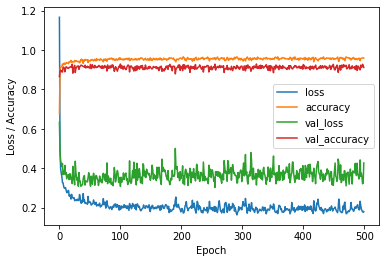


 ########## Result for Training data ########## 

log_loss:    0.1510
accuracy:    0.9448 

              precision    recall  f1-score   support

     class 1       0.95      0.98      0.96       542
     class 2       0.93      0.94      0.93       465
     class 3       0.93      0.98      0.96       424
     class 4       0.97      0.95      0.96       606
     class 5       0.95      0.87      0.90       397
     class 6       0.96      0.99      0.98       523
     class 7       0.99      0.96      0.98       506
     class 8       0.90      0.84      0.87       377
     class 9       0.91      0.95      0.93       434

    accuracy                           0.94      4274
   macro avg       0.94      0.94      0.94      4274
weighted avg       0.94      0.94      0.94      4274



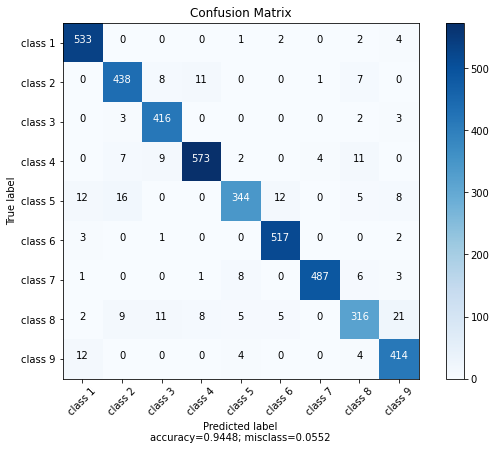


 ########## Result for Validation data ########## 

log_loss:    0.3588
accuracy:    0.9112 

              precision    recall  f1-score   support

     class 1       0.96      0.94      0.95       214
     class 2       0.83      0.86      0.85       203
     class 3       0.93      0.94      0.94       467
     class 4       0.97      0.93      0.95       365
     class 5       0.83      0.87      0.85       158
     class 6       0.92      0.97      0.95       169
     class 7       0.97      0.91      0.94       281
     class 8       0.87      0.84      0.86       264
     class 9       0.80      0.88      0.84       154

    accuracy                           0.91      2275
   macro avg       0.90      0.91      0.90      2275
weighted avg       0.91      0.91      0.91      2275



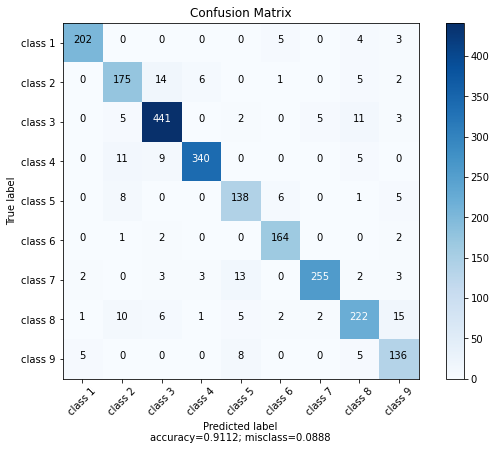


 ########## Result for Test data ########## 

log_loss:    0.3710
accuracy:    0.9080 

              precision    recall  f1-score   support

     class 1       0.96      0.94      0.95       340
     class 2       0.84      0.87      0.85       323
     class 3       0.92      0.93      0.93       723
     class 4       0.97      0.92      0.95       502
     class 5       0.87      0.81      0.84       227
     class 6       0.88      0.99      0.94       271
     class 7       0.98      0.93      0.96       383
     class 8       0.82      0.82      0.82       370
     class 9       0.87      0.90      0.88       273

    accuracy                           0.91      3412
   macro avg       0.90      0.90      0.90      3412
weighted avg       0.91      0.91      0.91      3412



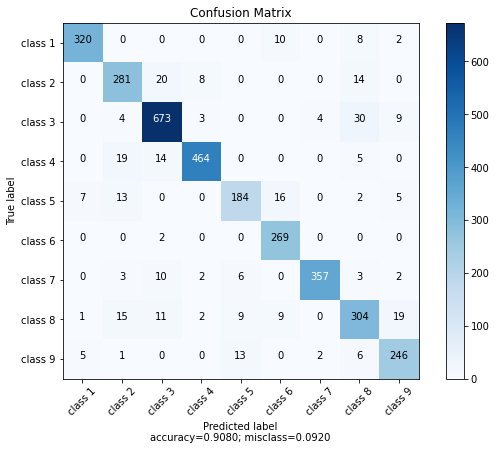

In [137]:

# Plot the learning curves
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('Epoch')
for k in estimator_vowels.history.keys():
    plt.plot(estimator_vowels.history[k], label = k) 
plt.legend()
plt.show()

# plot the confusion matrix
make_cm_plot(model_vowels, x_trn, d_trn, num_classes, 'Training data')
make_cm_plot(model_vowels, x_val, d_val, num_classes, 'Validation data')
make_cm_plot(model_vowels, x_tst, d_tst, num_classes, 'Test data')

#### KFold and other goodies
GÖR KLART RESTEN AV LABBEN FÖRST!!!

In [245]:
%%time

# Load the data
x_trn, d_trn, x_val, d_val, x_tst, d_tst = vowels()

# # YOUR CODE FOR NORMALIZATION
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

num_classes = 9


# YOUR CODE THAT DEFINES THE MLP
INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [40, 15],                  
         'drop_nod': [0.1, 0.25],                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.1,            
         'metric': 'accuracy',              
         'lambd' : 0.01,             
         'num_out' : num_classes }    

# Merge inputs and targets
inputs = np.concatenate((x_trn, x_val), axis=0)
targets = np.concatenate((d_trn, d_val), axis=0)

# Score containers for folds
acc_per_fold = []
loss_per_fold = []

# Fold parameters
batch_size = 50
nbr_epochs = 50
verbosity = 0
nbr_folds = 5

kfold = KFold(n_splits=nbr_folds, shuffle=True)
# K-fold Cross Validation model evaluation
fold_n = 1
for train, test in kfold.split(inputs, targets):

  k_model = mlp(**INPUT)

  # Fit data to model
  history = k_model.fit(inputs[train], targets[train],
              batch_size=batch_size,
              epochs=nbr_epochs,
              callbacks=[TqdmCallback(verbose=1)], 
              verbose=verbosity)

  # Generate generalization metrics
  scores = k_model.evaluate(inputs[test], targets[test], verbose=0)
  print(f'Score for fold {fold_n}: {k_model.metrics_names[0]} of {scores[0]}; {k_model.metrics_names[1]} of {scores[1]*100}%')
  acc_per_fold.append(scores[1] * 100)
  loss_per_fold.append(scores[0])

  # Increase fold number
  fold_n = fold_n + 1


# == Provide average scores ==
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
  print('------------------------------------------------------------------------')
  print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - Accuracy: {acc_per_fold[i]}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)} (+- {np.std(acc_per_fold)})')
print(f'> Loss: {np.mean(loss_per_fold)}')
print('------------------------------------------------------------------------')




# Get the model
model_vowels = mlp(**INPUT)

# Print a summary of the model
model_vowels.summary()

# Train the model
estimator_vowels = model_vowels.fit(x_trn, d_trn,
                      epochs = 500,     
                      validation_data=(x_val,d_val),
                      batch_size=100,   
                    #   callbacks=[TqdmCallback(verbose=1)],        
                      verbose = 0)




SyntaxError: invalid syntax (<unknown>, line 15)

In [241]:
x_trn.shape[1]

12

### CellName: Ex4 (#11)
### CellType: Exercise
### Cell instruction: Instruction for question 9

For this exercise you are given a classification problem with a fixed training and test dataset. The data is the Bioconcentraion dataset described in the first cell. Your task is to do model selection, coming up with your optimal MLP architecture together with the hyperparameters you used. We do not provide any python code for this question, only the small part that reads the data (next code cell).

#### Question 9
**(a) Present an MLP with associated hyperparameters that maximizes the validation performance and give the test performance you obtained.** For this classification task there are not so many cases of class 2. In the training data there is: class 1: 345 cases, class 2: 48 cases, and class 3: 191 cases. One can end upp with situations that the network does not at all learn how to detect cases of class 2. **(b) What performance measure(s) do you think is(are) relevant when you select the optimal model for this problem?**  

**Hint 1:** 
Remember to normalize input data.

**Hint 2:** 
Since there is no defined validation data set you need to split your original training data into training and validation data. You can use *sklearn.model_selection.train_test_split* or *sklearn.model_selection.KFold* to accomplish that, where the latter method does k-fold crossvalidation splits.

**Hint 3:** 
This problem is a 3-class classification problem, meaning that you should use a specific output activation function (*out_act_fun*) and a specific loss/error function (*cost_fun*).


### Question 9 - Final

#### Setup

In [143]:
# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

validation_size = 0.2

# Load Bioconcentration training and test data
x_trn_og, d_trn_og, x_tst, d_tst = bcf()
num_classes = d_tst.shape[1]
inp_dim = x_trn_og.shape[1]

# Split train set into train and validation
x_trn, x_val, d_trn, d_val = train_test_split(x_trn_og, d_trn_og, test_size=validation_size, stratify=d_trn_og)

# Normalize in relation to train set
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std 

# Get class weights
weights = class_weight.compute_class_weight(class_weight ='balanced', 
                                            classes = np.unique(np.argmax(d_trn, axis=1)), 
                                            y = np.argmax(d_trn, axis=1))
weights_dict = dict(enumerate(weights))
print(weights_dict)

print(x_trn.shape, d_trn.shape)
unq_rows, count = np.unique(d_trn, axis=0, return_counts = 1)
print("Class count training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

{0: 0.5640096618357487, 1: 4.0964912280701755, 2: 1.0174291938997821}
(467, 9) (467, 3)
Class count training set
{(0.0, 0.0, 1.0): 153, (0.0, 1.0, 0.0): 38, (1.0, 0.0, 0.0): 276}


#### Statistic functions

In [10]:
def get_model_stats(model, final_model=False):
    if final_model:
        X = [x_trn_og, x_tst]
        D = [d_trn_og, d_tst]
    else: 
        X = [x_trn, x_val]
        D = [d_trn, d_val]

    Y = [model.predict(x, verbose=0 ) for x in X]
    D_class = [d.argmax(axis=1) for d in D]
    Y_class = [y.argmax(axis=1) for y in Y]

    LOSS = [log_loss(D[i], Y[i], eps=1e-15) for i in range(2)]
    ACC = [(Y_class[i]==D_class[i]).mean() for i in range(2)]
    F1 = [f1_score(D_class[i], Y_class[i], average='macro') for i in range(2)]
    WF1 = [f1_score(D_class[i], Y_class[i], average='weighted') for i in range(2)]

    return LOSS, ACC, F1, WF1

def print_model_stats(model, final_model=False):
    LOSS, ACC, F1, WF1 = get_model_stats(model, final_model)
    if final_model: val_tst = 'Test' 
    else: val_tst = "Val"
    print("{:=^60}\n".format("Stat summary"))
    print('{:<15}{:<15}{:<15}'.format('', 'Train', val_tst))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('log_loss:',LOSS[0],LOSS[1]))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('accuracy:', ACC[0],ACC[1]))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('macro f1:', F1[0],F1[1]))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('weighted f1:', WF1[0],WF1[1]))
    print("\n{:=^60}\n".format(""))

def plot_history(estimator):
    plt.figure()
    plt.ylabel('Loss / Accuracy')
    plt.xlabel('Epoch')
    for k in estimator.history.keys():
        plt.plot(estimator.history[k], label = k) 
    plt.legend()
    plt.show()

#### Models

Model: "model_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_199 (Dense)           (None, 64)                640       
                                                                 
 dropout_129 (Dropout)       (None, 64)                0         
                                                                 
 dense_200 (Dense)           (None, 32)                2080      
                                                                 
 dropout_130 (Dropout)       (None, 32)                0         
                                                                 
 dense_201 (Dense)           (None, 3)                 99        
                                                                 
Total params: 2,819
Trainable params: 2,819
Non-trainable 

  0%|          | 1/500 [00:00<08:01,  1.04epoch/s, loss=1.12, accuracy=0.403, val_loss=0.894, val_accuracy=0.709]

100%|██████████| 500/500 [00:24<00:00, 20.01epoch/s, loss=0.396, accuracy=0.797, val_loss=1.02, val_accuracy=0.709] 


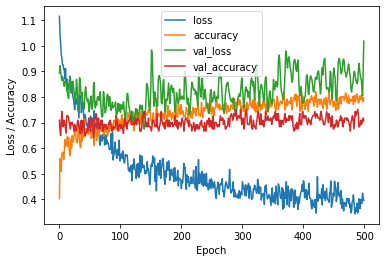

========================Stat summary========================

               Train          Val            
log_loss:      0.3285         1.0186         
accuracy:      0.8865         0.7094         
macro f1:      0.8904         0.6398         
weighted f1:   0.8856         0.7029         


Wall time: 25.3 s


In [151]:
%%time

bs = 128
epochs = 500

# a = 2
# nbr_nodes = int(x_trn.shape[0]/(a*(inp_dim-num_classes)))

INPUT = {'inp_dim': inp_dim,         
         'n_nod': [64, 32],                  
         'drop_nod': [0.5, 0],                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.01,            
         'metric': 'accuracy',              
         'lambd' : 0,             
         'num_out' : num_classes } 


model_weighted = mlp(**INPUT)
 
model_weighted.summary()

print("Training weighted model...")
estimator_weighted = model_weighted.fit(x_trn, d_trn,
                      epochs = epochs,     
                      validation_data=(x_val,d_val),
                      class_weight=weights_dict,
                      batch_size=bs,   
                      callbacks=[TqdmCallback(verbose=1)],
                      # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
                      verbose = 0)
plot_history(estimator_weighted)
print_model_stats(model_weighted)


 ########## Result for Training data ########## 

log_loss:    0.3585
accuracy:    0.8608 

              precision    recall  f1-score   support

     class 1       0.92      0.84      0.88       276
     class 2       0.88      0.97      0.93        38
     class 3       0.77      0.88      0.82       153

    accuracy                           0.86       467
   macro avg       0.86      0.90      0.87       467
weighted avg       0.87      0.86      0.86       467



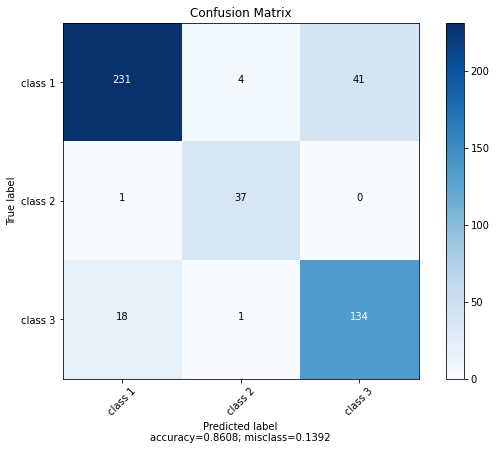


 ########## Result for Validation data ########## 

log_loss:    0.7907
accuracy:    0.6838 

              precision    recall  f1-score   support

     class 1       0.75      0.71      0.73        69
     class 2       0.55      0.60      0.57        10
     class 3       0.61      0.66      0.63        38

    accuracy                           0.68       117
   macro avg       0.64      0.66      0.65       117
weighted avg       0.69      0.68      0.69       117



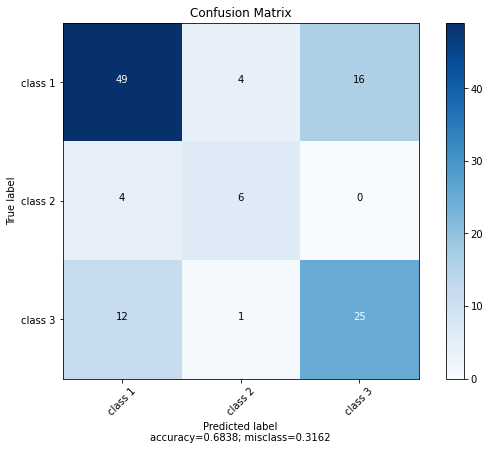


 ########## Result for Test data ########## 

log_loss:    1.2304
accuracy:    0.6205 

              precision    recall  f1-score   support

     class 1       0.73      0.67      0.70       115
     class 2       0.42      0.31      0.36        16
     class 3       0.51      0.61      0.55        64

    accuracy                           0.62       195
   macro avg       0.55      0.53      0.54       195
weighted avg       0.63      0.62      0.62       195



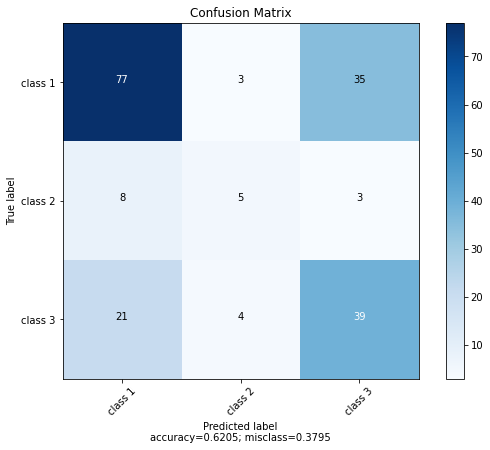

In [149]:
# plot the confusion matrix
make_cm_plot(model_weighted, x_trn, d_trn, num_classes, 'Training data')
make_cm_plot(model_weighted, x_val, d_val, num_classes, 'Validation data')
make_cm_plot(model_weighted, x_tst, d_tst, num_classes, 'Test data')

### Weighted Loss Question 9 

##### Setup (Load data etc)

In [11]:
# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

validation_size = 0.2

# Load Bioconcentration training and test data
x_trn_og, d_trn_og, x_tst, d_tst = bcf()
num_classes = d_tst.shape[1]
inp_dim = x_trn_og.shape[1]

# Split train set into train and validation
x_trn, x_val, d_trn, d_val = train_test_split(x_trn_og, d_trn_og, test_size=validation_size, stratify=d_trn_og)

# Normalize in relation to train set
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std 

# Get class weights
weights = class_weight.compute_class_weight(class_weight ='balanced', 
                                            classes = np.unique(np.argmax(d_trn, axis=1)), 
                                            y = np.argmax(d_trn, axis=1))
weights_dict = dict(enumerate(weights))
print(weights_dict)

print(x_trn.shape, d_trn.shape)
unq_rows, count = np.unique(d_trn, axis=0, return_counts = 1)
print("Class count training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

{0: 0.5640096618357487, 1: 4.0964912280701755, 2: 1.0174291938997821}
(467, 9) (467, 3)
Class count training set
{(0.0, 0.0, 1.0): 153, (0.0, 1.0, 0.0): 38, (1.0, 0.0, 0.0): 276}


##### Statistics functions

In [13]:


def get_model_stats(model, final_model=False):
    if final_model:
        X = [x_trn_og, x_tst]
        D = [d_trn_og, d_tst]
    else: 
        X = [x_trn, x_val]
        D = [d_trn, d_val]

    Y = [model.predict(x, verbose=0 ) for x in X]
    D_class = [d.argmax(axis=1) for d in D]
    Y_class = [y.argmax(axis=1) for y in Y]

    LOSS = [log_loss(D[i], Y[i], eps=1e-15) for i in range(2)]
    ACC = [(Y_class[i]==D_class[i]).mean() for i in range(2)]
    F1 = [f1_score(D_class[i], Y_class[i], average='macro') for i in range(2)]
    WF1 = [f1_score(D_class[i], Y_class[i], average='weighted') for i in range(2)]

    return LOSS, ACC, F1, WF1

def print_model_stats(model, final_model=False):
    LOSS, ACC, F1, WF1 = get_model_stats(model, final_model)
    if final_model: val_tst = 'Test' 
    else: val_tst = "Val"
    print("{:=^60}\n".format("Stat summary"))
    print('{:<15}{:<15}{:<15}'.format('', 'Train', val_tst))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('log_loss:',LOSS[0],LOSS[1]))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('accuracy:', ACC[0],ACC[1]))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('macro f1:', F1[0],F1[1]))
    print('{:<15}{:<15.4f}{:<15.4f}'.format('weighted f1:', WF1[0],WF1[1]))
    print("\n{:=^60}\n".format(""))

# def get_model_stats(model, final_model=False):
    # X = [x_trn, x_val, x_tst]
    # D = [d_trn, d_val, d_tst]

    # Y = [model.predict(x, verbose=0 ) for x in X]
    # D_class = [d.argmax(axis=1) for d in D]
    # Y_class = [y.argmax(axis=1) for y in Y]

    # LOSS = [log_loss(D[i], Y[i], eps=1e-15) for i in range(3)]
    # ACC = [(Y_class[i]==D_class[i]).mean() for i in range(3)]
    # WF1 = [f1_score(D_class[i], Y_class[i], average='weighted') for i in range(3)]

    # return LOSS, ACC, WF1
    
# def print_model_stats(model):
#     LOSS, ACC, WF1 = get_model_stats(model)
#     print("{:=^60}\n".format("Stat summary"))
#     print('{:<15}{:<15}{:<15}{:<15}'.format('', 'Train', 'Val', 'Test'))
#     print('{:<15}{:<15.4f}{:<15.4f}{:<15.4f}'.format('log_loss:',LOSS[0],LOSS[1],LOSS[2]))
#     print('{:<15}{:<15.4f}{:<15.4f}{:<15.4f}'.format('accuracy:', ACC[0],ACC[1],ACC[2]))
#     print('{:<15}{:<15.4f}{:<15.4f}{:<15.4f}'.format('weighted f1:', WF1[0],WF1[1],WF1[2]))
#     print("\n{:=^60}\n".format(""))

def plot_history(estimator):
    plt.figure()
    plt.ylabel('Loss / Accuracy')
    plt.xlabel('Epoch')
    for k in estimator.history.keys():
        plt.plot(estimator.history[k], label = k) 
    plt.legend()
    plt.show()

#### Models

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_24 (Dense)            (None, 38)                380       
                                                                 
 dropout_12 (Dropout)        (None, 38)                0         
                                                                 
 dense_25 (Dense)            (None, 3)                 117       
                                                                 
Total params: 497
Trainable params: 497
Non-trainable params: 0
_________________________________________________________________
Training weighted model...


100%|██████████| 2000/2000 [01:01<00:00, 32.36epoch/s, loss=0.433, accuracy=0.758, val_loss=1.79, val_accuracy=0.632]


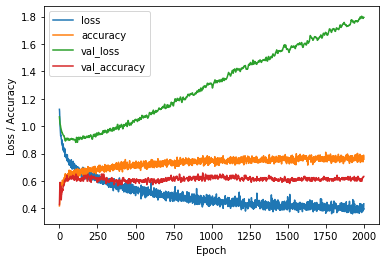

========================Stat summary========================

               Train          Val            
log_loss:      0.4144         1.7273         
accuracy:      0.8158         0.6325         
macro f1:      0.8349         0.5620         
weighted f1:   0.8175         0.6367         


Wall time: 1min 2s


In [20]:
%%time

# bs = x_trn.shape[0]
bs = 256
epochs = 2000

a = 2
nbr_nodes = int(x_trn.shape[0]/(a*(inp_dim-num_classes)))

INPUT = {'inp_dim': inp_dim,         
         'n_nod': [nbr_nodes],                  
         'drop_nod': 0.2,                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.005,            
         'metric': 'accuracy',              
         'lambd' : 0.0,             
         'num_out' : num_classes } 


model_weighted = mlp(**INPUT)
model_non_weighted = mlp(**INPUT)
 
model_weighted.summary()
# model_non_weighted.summary()

print("Training weighted model...")
estimator_weighted = model_weighted.fit(x_trn, d_trn,
                      epochs = epochs,     
                      validation_data=(x_val,d_val),
                      class_weight=weights_dict,
                      batch_size=bs,   
                      callbacks=[TqdmCallback(verbose=1)],
                      # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
                      verbose = 0)
plot_history(estimator_weighted)
print_model_stats(model_weighted)

# print("Training non-weighted model...")
# estimator_non_weighted = model_weighted.fit(x_trn, d_trn,
#                       epochs = epochs,     
#                       validation_data=(x_val,d_val),
#                     #   class_weight=weights_dict,
#                       batch_size=bs,   
#                       callbacks=[TqdmCallback(verbose=1)],
#                       # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
#                       verbose = 0)

# plot_history(estimator_non_weighted)
# print_model_stats(model_non_weighted)


=======================Weighted Model=======================


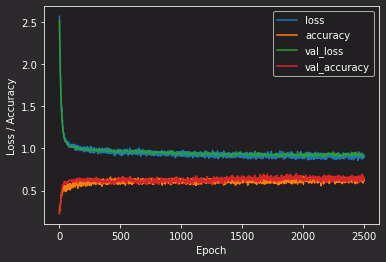

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8170         0.8868         0.9124         
accuracy:      0.6852         0.6581         0.6205         
weighted f1:   0.6843         0.6570         0.6171         




{'name': 'model_131',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 9),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'main_input'},
   'name': 'main_input',
   'inbound_nodes': []},
  {'class_name': 'Dense',
   'config': {'name': 'dense_264',
    'trainable': True,
    'dtype': 'float32',
    'units': 15,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': {'class_name': 'L2',
     'config': {'l2': 0.10000000149011612}},
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'dense_264',
   'inbound_nodes': [[['main_input', 0, 0, {}]]]},
  {'class_name': 'Dropout',
   'config': {'name': 'dropout_133',
    'trainable': True,
    'dtype': 'float32',
    'rate': 0.6,
 

In [437]:
print("{:=^60}".format("Weighted Model"))
plot_history(estimator_weighted)
print_model_stats(model_weighted)

# # plot the confusion matrix
    # make_cm_plot(model_weighted, x_trn, d_trn, num_classes, 'Training data')
    # make_cm_plot(model_weighted, x_val, d_val, num_classes, 'Validation data')
    # make_cm_plot(model_weighted, x_tst, d_tst, num_classes, 'Test data')

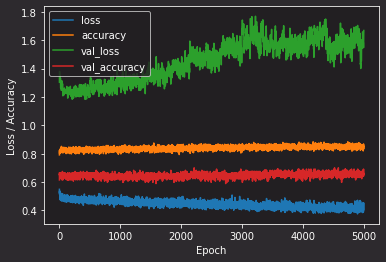

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0407         0.9981         1.0319         
accuracy:      0.5246         0.5556         0.5333         
weighted f1:   0.5320         0.5635         0.5264         




In [405]:
print("{:-^s60}".format("Weighted Model"))
plot_history(estimator_non_weighted)
print_model_stats(model_non_weighted)

# # plot the confusion matrix
    # make_cm_plot(model_weighted, x_trn, d_trn, num_classes, 'Training data')
    # make_cm_plot(model_weighted, x_val, d_val, num_classes, 'Validation data')
    # make_cm_plot(model_weighted, x_tst, d_tst, num_classes, 'Test data')

##### Loop



--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 1/54 ...
|---------------------Training---------------------|
|##################################################| 48.921875 s
|-----------------------DONE-----------------------|


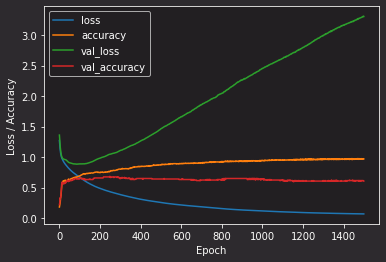

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0911         3.2024         3.1388         
accuracy:      0.9657         0.6068         0.6000         
weighted f1:   0.9658         0.6108         0.6033         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 2/54 ...
|---------------------Training---------------------|
|##################################################| 43.75 s
|-----------------------DONE-----------------------|


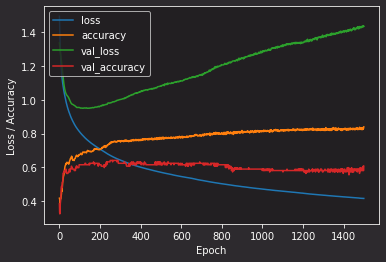

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4251         1.3582         1.0141         
accuracy:      0.8266         0.6068         0.5949         
weighted f1:   0.8274         0.6151         0.6062         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 3/54 ...
|---------------------Training---------------------|
|##################################################| 42.171875 s
|-----------------------DONE-----------------------|


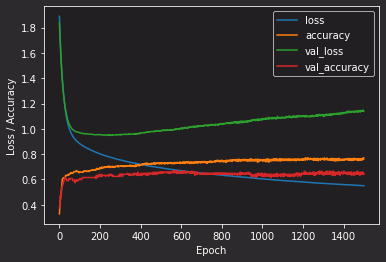

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5638         1.0664         0.9212         
accuracy:      0.7602         0.6410         0.5949         
weighted f1:   0.7627         0.6495         0.6004         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 4/54 ...
|---------------------Training---------------------|
|##################################################| 46.890625 s
|-----------------------DONE-----------------------|


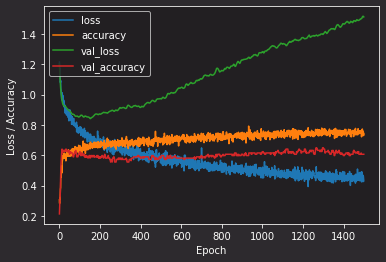

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4612         1.3801         1.0725         
accuracy:      0.8158         0.6068         0.5897         
weighted f1:   0.8165         0.6136         0.5981         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 5/54 ...
|---------------------Training---------------------|
|##################################################| 42.546875 s
|-----------------------DONE-----------------------|


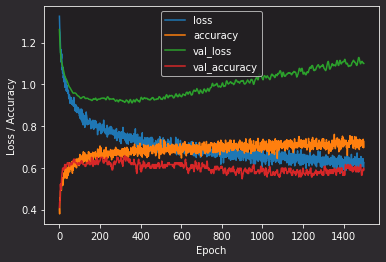

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5691         1.0471         0.8744         
accuracy:      0.7730         0.5897         0.6308         
weighted f1:   0.7742         0.5974         0.6352         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 6/54 ...
|---------------------Training---------------------|
|##################################################| 40.984375 s
|-----------------------DONE-----------------------|


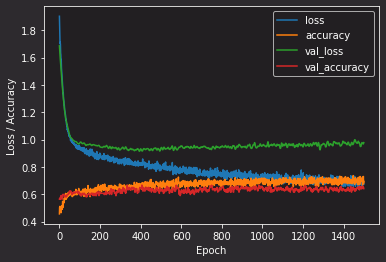

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6506         0.9126         0.8778         
accuracy:      0.7366         0.6410         0.6051         
weighted f1:   0.7391         0.6489         0.6110         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 7/54 ...
|---------------------Training---------------------|
|##################################################| 40.578125 s
|-----------------------DONE-----------------------|


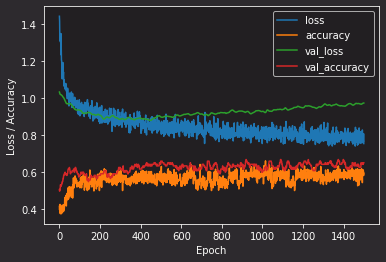

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6757         0.9725         0.9067         
accuracy:      0.7109         0.6496         0.5590         
weighted f1:   0.7152         0.6601         0.5683         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 8/54 ...
|---------------------Training---------------------|
|##################################################| 40.8125 s
|-----------------------DONE-----------------------|


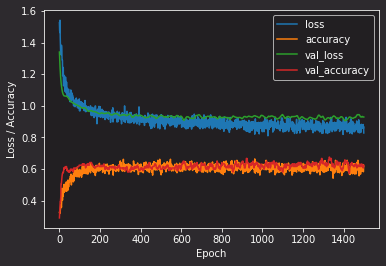

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7699         0.8981         0.8835         
accuracy:      0.6895         0.6239         0.6000         
weighted f1:   0.6927         0.6344         0.6074         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 9/54 ...
|---------------------Training---------------------|
|##################################################| 39.609375 s
|-----------------------DONE-----------------------|


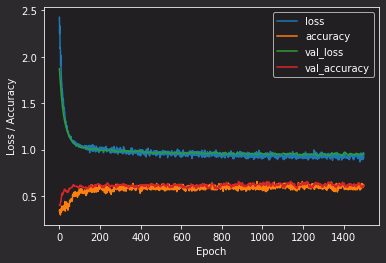

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8458         0.9172         0.9478         
accuracy:      0.6403         0.6068         0.5692         
weighted f1:   0.6534         0.6171         0.5811         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 10/54 ...
|---------------------Training---------------------|
|##################################################| 41.1875 s
|-----------------------DONE-----------------------|


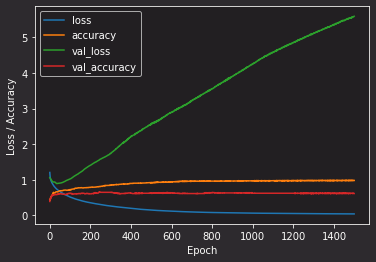

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0596         3.8286         3.7319         
accuracy:      0.9786         0.6154         0.6103         
weighted f1:   0.9787         0.6287         0.6161         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 11/54 ...
|---------------------Training---------------------|
|##################################################| 39.859375 s
|-----------------------DONE-----------------------|


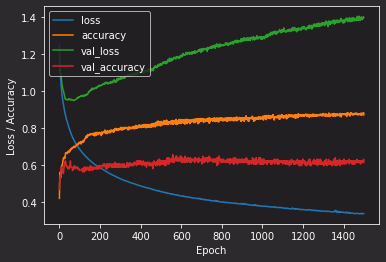

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3402         1.3313         1.1539         
accuracy:      0.8801         0.6154         0.5949         
weighted f1:   0.8807         0.6185         0.5996         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 12/54 ...
|---------------------Training---------------------|
|##################################################| 40.5625 s
|-----------------------DONE-----------------------|


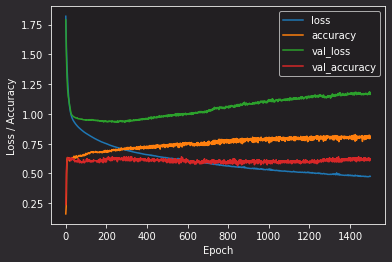

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4779         1.0841         0.9356         
accuracy:      0.8073         0.6239         0.6000         
weighted f1:   0.8085         0.6299         0.6076         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 13/54 ...
|---------------------Training---------------------|
|##################################################| 41.171875 s
|-----------------------DONE-----------------------|


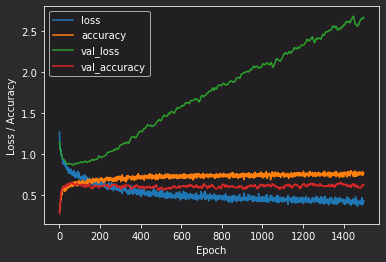

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4119         1.7766         1.1978         
accuracy:      0.8287         0.6239         0.5846         
weighted f1:   0.8291         0.6233         0.5885         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 14/54 ...
|---------------------Training---------------------|
|##################################################| 41.0625 s
|-----------------------DONE-----------------------|


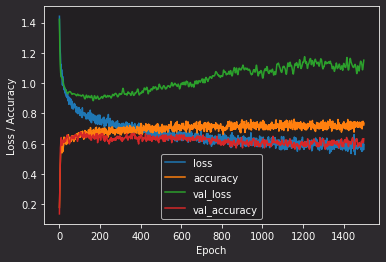

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5307         1.0910         0.8752         
accuracy:      0.7880         0.6325         0.5949         
weighted f1:   0.7888         0.6390         0.6006         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 15/54 ...
|---------------------Training---------------------|
|##################################################| 40.71875 s
|-----------------------DONE-----------------------|


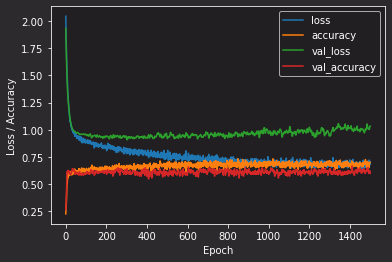

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6205         0.9582         0.8763         
accuracy:      0.7452         0.5983         0.5846         
weighted f1:   0.7475         0.6142         0.5988         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 16/54 ...
|---------------------Training---------------------|
|##################################################| 40.640625 s
|-----------------------DONE-----------------------|


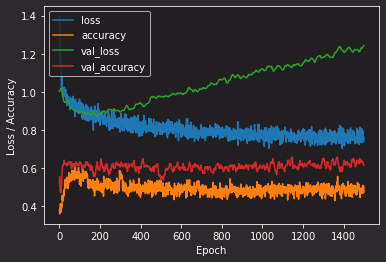

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6331         1.2420         0.9532         
accuracy:      0.6959         0.6154         0.5333         
weighted f1:   0.7036         0.6274         0.5547         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 17/54 ...
|---------------------Training---------------------|
|##################################################| 40.921875 s
|-----------------------DONE-----------------------|


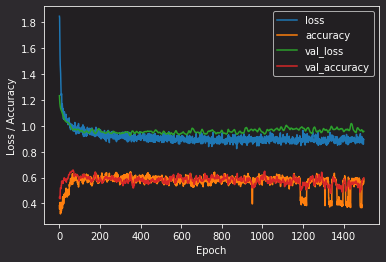

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7805         0.9212         0.8929         
accuracy:      0.6381         0.5983         0.5128         
weighted f1:   0.6460         0.6180         0.5215         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 18/54 ...
|---------------------Training---------------------|
|##################################################| 41.296875 s
|-----------------------DONE-----------------------|


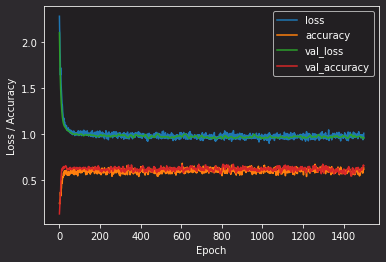

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8742         0.9294         0.9431         
accuracy:      0.6403         0.6581         0.6308         
weighted f1:   0.6417         0.6615         0.6291         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 19/54 ...
|---------------------Training---------------------|
|##################################################| 39.765625 s
|-----------------------DONE-----------------------|


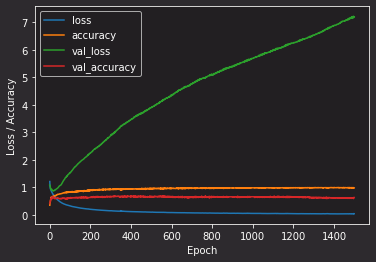

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0549         4.7988         4.7301         
accuracy:      0.9829         0.6325         0.5949         
weighted f1:   0.9828         0.6349         0.5929         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 20/54 ...
|---------------------Training---------------------|
|##################################################| 41.0 s
|-----------------------DONE-----------------------|


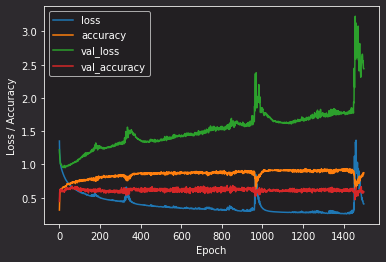

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3117         2.1211         1.5541         
accuracy:      0.8694         0.5897         0.6205         
weighted f1:   0.8697         0.5947         0.6304         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 21/54 ...
|---------------------Training---------------------|
|##################################################| 41.859375 s
|-----------------------DONE-----------------------|


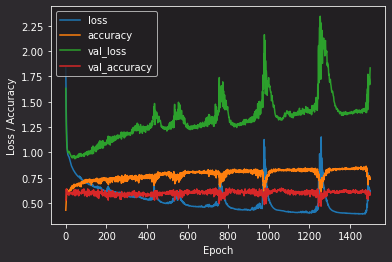

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5954         1.6971         1.1769         
accuracy:      0.7730         0.5812         0.5538         
weighted f1:   0.7743         0.5864         0.5572         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 22/54 ...
|---------------------Training---------------------|
|##################################################| 41.40625 s
|-----------------------DONE-----------------------|


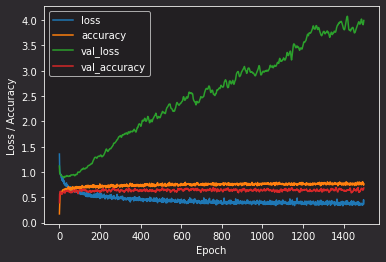

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3666         1.9942         1.3884         
accuracy:      0.8223         0.6838         0.6205         
weighted f1:   0.8236         0.6857         0.6278         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 23/54 ...
|---------------------Training---------------------|
|##################################################| 41.078125 s
|-----------------------DONE-----------------------|


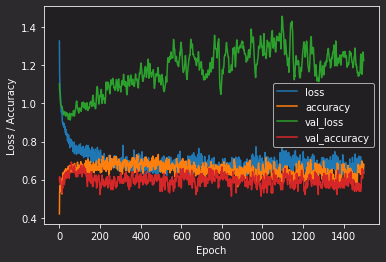

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5654         1.1580         0.9171         
accuracy:      0.7495         0.6325         0.5846         
weighted f1:   0.7513         0.6376         0.5879         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 24/54 ...
|---------------------Training---------------------|
|##################################################| 41.109375 s
|-----------------------DONE-----------------------|


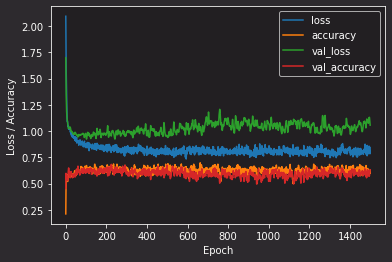

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7215         0.9948         0.9040         
accuracy:      0.6831         0.6325         0.5744         
weighted f1:   0.6883         0.6420         0.5876         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 25/54 ...
|---------------------Training---------------------|
|##################################################| 40.59375 s
|-----------------------DONE-----------------------|


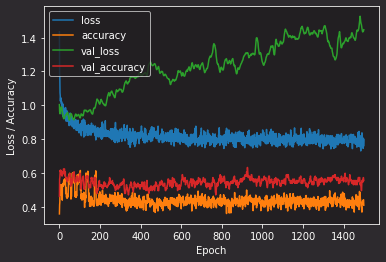

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6491         1.4471         1.0336         
accuracy:      0.6681         0.5556         0.5077         
weighted f1:   0.6831         0.5815         0.5345         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 26/54 ...
|---------------------Training---------------------|
|##################################################| 40.4375 s
|-----------------------DONE-----------------------|


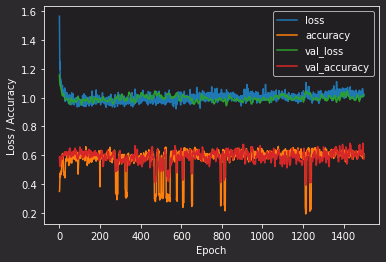

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9449         1.0032         1.0074         
accuracy:      0.6167         0.5726         0.5692         
weighted f1:   0.6076         0.5712         0.5431         




--------------------------------Model parameters--------------------------------

 Nodes: 38       Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 27/54 ...
|---------------------Training---------------------|
|##################################################| 42.0 s
|-----------------------DONE-----------------------|


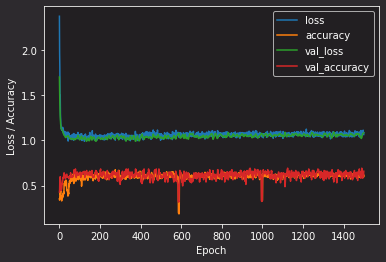

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0573         1.0707         1.0866         
accuracy:      0.6552         0.6581         0.5949         
weighted f1:   0.6255         0.6308         0.5300         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 28/54 ...
|---------------------Training---------------------|
|##################################################| 39.953125 s
|-----------------------DONE-----------------------|


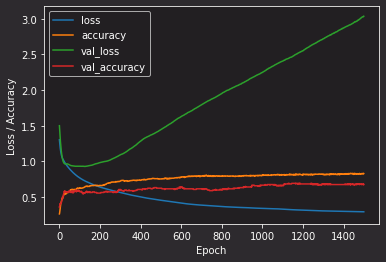

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3910         2.1848         1.7203         
accuracy:      0.8266         0.6752         0.5744         
weighted f1:   0.8276         0.6824         0.5813         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 29/54 ...
|---------------------Training---------------------|
|##################################################| 40.25 s
|-----------------------DONE-----------------------|


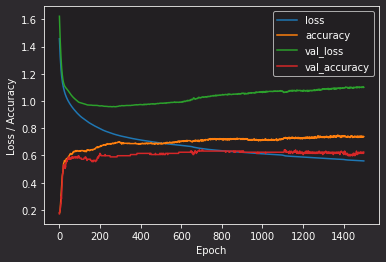

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6065         1.0413         0.9532         
accuracy:      0.7388         0.6239         0.5744         
weighted f1:   0.7410         0.6301         0.5823         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 30/54 ...
|---------------------Training---------------------|
|##################################################| 39.5625 s
|-----------------------DONE-----------------------|


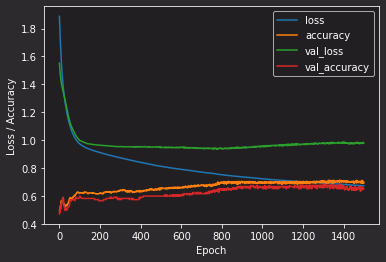

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6801         0.9137         0.9247         
accuracy:      0.7002         0.6496         0.5641         
weighted f1:   0.7065         0.6599         0.5762         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 31/54 ...
|---------------------Training---------------------|
|##################################################| 41.59375 s
|-----------------------DONE-----------------------|


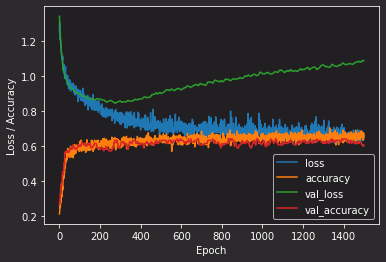

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6492         1.0879         0.9692         
accuracy:      0.7302         0.6068         0.5641         
weighted f1:   0.7334         0.6252         0.5760         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 32/54 ...
|---------------------Training---------------------|
|##################################################| 40.359375 s
|-----------------------DONE-----------------------|


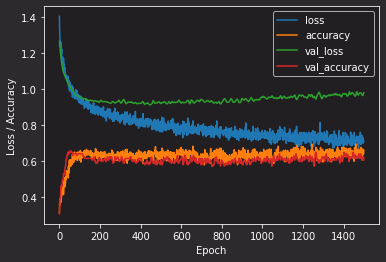

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6826         0.9397         0.8585         
accuracy:      0.7066         0.6068         0.5795         
weighted f1:   0.7122         0.6211         0.5944         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 33/54 ...
|---------------------Training---------------------|
|##################################################| 40.3125 s
|-----------------------DONE-----------------------|


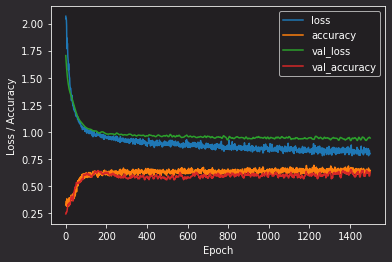

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7779         0.8988         0.9023         
accuracy:      0.6809         0.6239         0.5846         
weighted f1:   0.6900         0.6316         0.6069         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 34/54 ...
|---------------------Training---------------------|
|##################################################| 41.21875 s
|-----------------------DONE-----------------------|


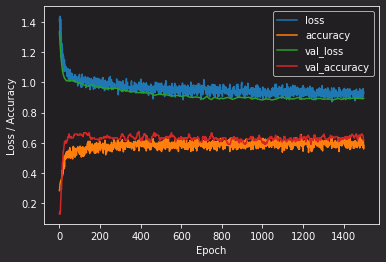

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7943         0.8950         0.9011         
accuracy:      0.7002         0.6154         0.6103         
weighted f1:   0.6975         0.6172         0.6091         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 35/54 ...
|---------------------Training---------------------|
|##################################################| 40.359375 s
|-----------------------DONE-----------------------|


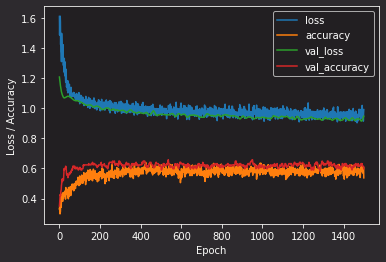

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8760         0.9301         0.9448         
accuracy:      0.6488         0.5983         0.5949         
weighted f1:   0.6540         0.6130         0.6022         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 36/54 ...
|---------------------Training---------------------|
|##################################################| 41.21875 s
|-----------------------DONE-----------------------|


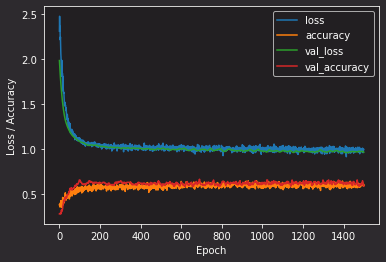

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9165         0.9436         0.9825         
accuracy:      0.6445         0.5897         0.5897         
weighted f1:   0.6505         0.5954         0.5970         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 37/54 ...
|---------------------Training---------------------|
|##################################################| 39.828125 s
|-----------------------DONE-----------------------|


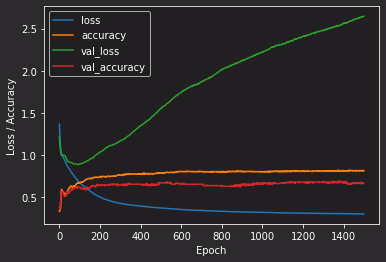

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4022         2.3514         1.8870         
accuracy:      0.8137         0.6581         0.5436         
weighted f1:   0.8151         0.6591         0.5464         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 38/54 ...
|---------------------Training---------------------|
|##################################################| 39.625 s
|-----------------------DONE-----------------------|


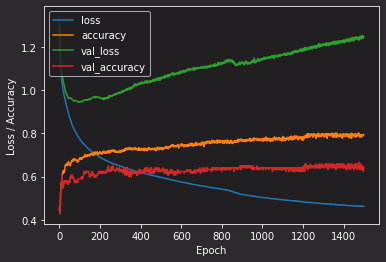

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4930         1.1909         1.0363         
accuracy:      0.7859         0.6410         0.5897         
weighted f1:   0.7878         0.6447         0.6006         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 39/54 ...
|---------------------Training---------------------|
|##################################################| 40.375 s
|-----------------------DONE-----------------------|


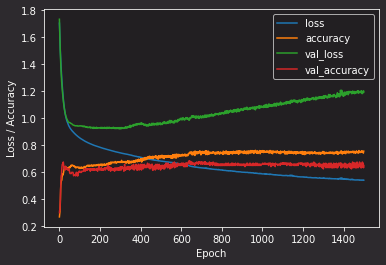

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5741         1.1344         0.9421         
accuracy:      0.7559         0.6496         0.5744         
weighted f1:   0.7593         0.6536         0.5850         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 40/54 ...
|---------------------Training---------------------|
|##################################################| 40.46875 s
|-----------------------DONE-----------------------|


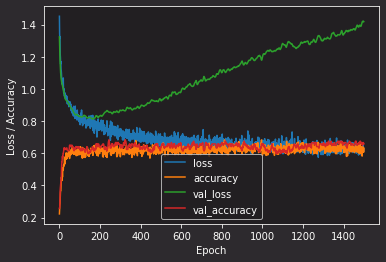

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5940         1.4078         1.0032         
accuracy:      0.7409         0.6581         0.6000         
weighted f1:   0.7439         0.6625         0.6110         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 41/54 ...
|---------------------Training---------------------|
|##################################################| 40.203125 s
|-----------------------DONE-----------------------|


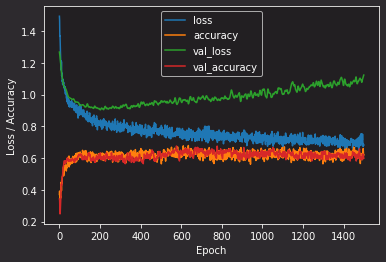

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6515         1.0812         0.8902         
accuracy:      0.7131         0.5983         0.5897         
weighted f1:   0.7199         0.6083         0.6088         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 42/54 ...
|---------------------Training---------------------|
|##################################################| 40.625 s
|-----------------------DONE-----------------------|


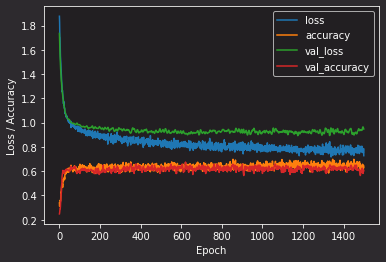

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7156         0.9004         0.8649         
accuracy:      0.7002         0.6068         0.5692         
weighted f1:   0.7067         0.6129         0.5820         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 43/54 ...
|---------------------Training---------------------|
|##################################################| 41.1875 s
|-----------------------DONE-----------------------|


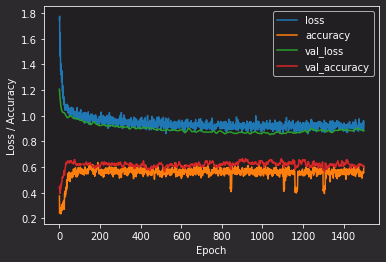

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7394         0.8819         0.8739         
accuracy:      0.6959         0.5983         0.6000         
weighted f1:   0.7015         0.6069         0.6050         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 44/54 ...
|---------------------Training---------------------|
|##################################################| 39.984375 s
|-----------------------DONE-----------------------|


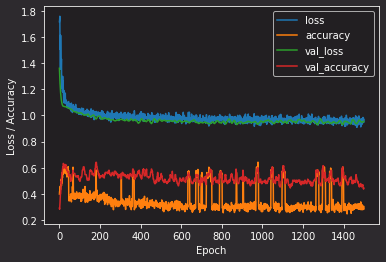

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8457         0.9351         0.9342         
accuracy:      0.5203         0.4444         0.4667         
weighted f1:   0.5550         0.4830         0.5132         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 45/54 ...
|---------------------Training---------------------|
|##################################################| 41.15625 s
|-----------------------DONE-----------------------|


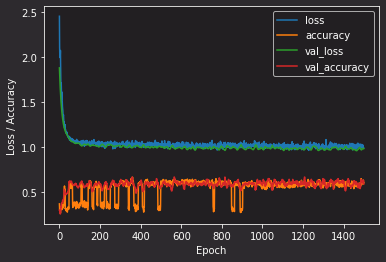

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9215         0.9632         0.9869         
accuracy:      0.6188         0.5897         0.5538         
weighted f1:   0.6247         0.6082         0.5629         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 46/54 ...
|---------------------Training---------------------|
|##################################################| 39.53125 s
|-----------------------DONE-----------------------|


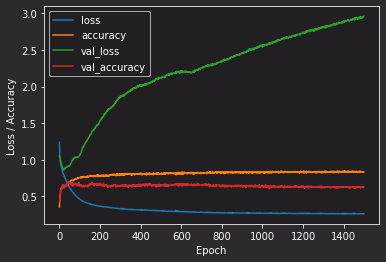

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3566         2.2896         2.6350         
accuracy:      0.8330         0.6325         0.5641         
weighted f1:   0.8343         0.6331         0.5746         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 47/54 ...
|---------------------Training---------------------|
|##################################################| 39.3125 s
|-----------------------DONE-----------------------|


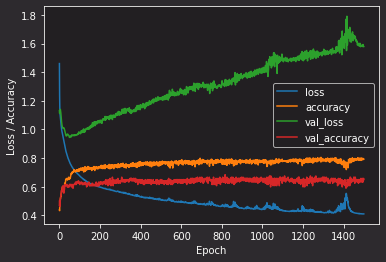

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4704         1.5164         1.1297         
accuracy:      0.7901         0.6496         0.5487         
weighted f1:   0.7911         0.6554         0.5569         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 48/54 ...
|---------------------Training---------------------|
|##################################################| 40.109375 s
|-----------------------DONE-----------------------|


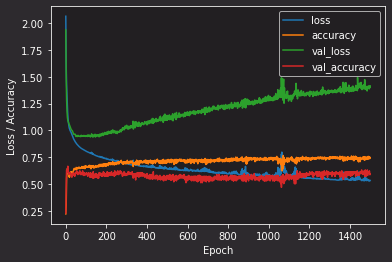

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5699         1.3530         1.0332         
accuracy:      0.7495         0.5897         0.5538         
weighted f1:   0.7507         0.5994         0.5593         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 49/54 ...
|---------------------Training---------------------|
|##################################################| 40.875 s
|-----------------------DONE-----------------------|


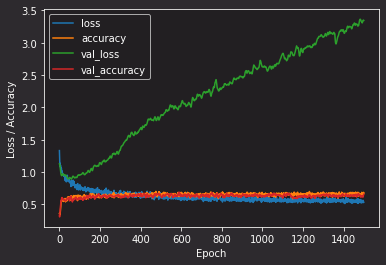

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5279         1.8026         1.2798         
accuracy:      0.7602         0.6581         0.5846         
weighted f1:   0.7605         0.6656         0.5924         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 50/54 ...
|---------------------Training---------------------|
|##################################################| 44.875 s
|-----------------------DONE-----------------------|


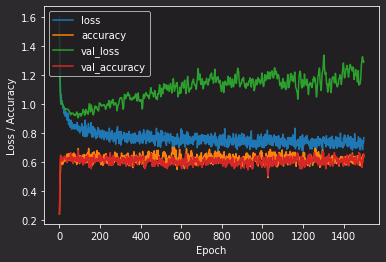

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6661         1.2481         0.9173         
accuracy:      0.7473         0.6496         0.5538         
weighted f1:   0.7470         0.6586         0.5591         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 51/54 ...
|---------------------Training---------------------|
|##################################################| 43.4375 s
|-----------------------DONE-----------------------|


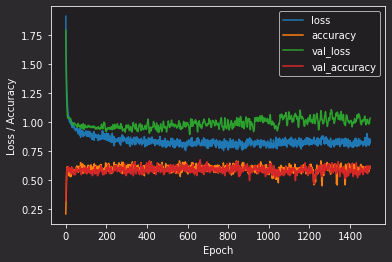

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7447         0.9776         0.9148         
accuracy:      0.6660         0.6068         0.5436         
weighted f1:   0.6721         0.6307         0.5432         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 52/54 ...
|---------------------Training---------------------|
|##################################################| 41.4375 s
|-----------------------DONE-----------------------|


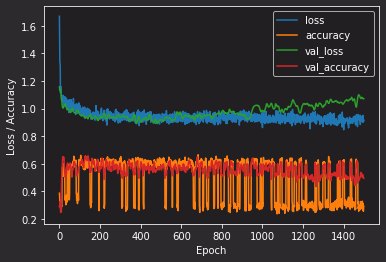

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7632         1.0721         0.9508         
accuracy:      0.5525         0.4957         0.4564         
weighted f1:   0.5802         0.5294         0.4851         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 53/54 ...
|---------------------Training---------------------|
|##################################################| 42.046875 s
|-----------------------DONE-----------------------|


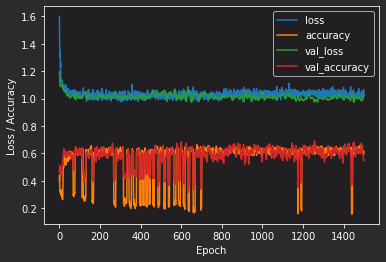

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9653         1.0129         1.0236         
accuracy:      0.5889         0.5556         0.5231         
weighted f1:   0.6031         0.5854         0.5374         




--------------------------------Model parameters--------------------------------

 Nodes: 15       Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 54/54 ...
|---------------------Training---------------------|
|##################################################| 42.265625 s
|-----------------------DONE-----------------------|


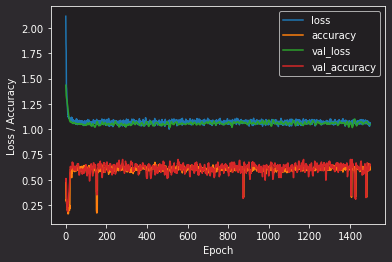

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0193         1.0387         1.0548         
accuracy:      0.6916         0.6410         0.6205         
weighted f1:   0.6692         0.6029         0.5819         


Wall time: 28min 24s


In [533]:
%%time

# bs = x_trn.shape[0]
# bs = 256
epochs = 1500

A = [2, 5]
batch_sizes = [512]
learning_rates = [0.005, 0.01, 0.03]
dropouts = [0, 0.3, 0.8]
lambdas = [0, 0.01, 0.05]

modelnbr=1

for a in A: 
  for bs in batch_sizes:
    for lr in learning_rates:
      for drop in dropouts:
        for lambd in lambdas:

# a = 2
          nbr_nodes = int(x_trn.shape[0]/(a*(inp_dim-num_classes)))

          INPUT = {'inp_dim': inp_dim,         
                  'n_nod': [nbr_nodes],                  
                  'drop_nod': drop,                
                  'act_fun': 'relu',             
                  'out_act_fun': 'softmax',      
                  'opt_method': 'Adam',         
                  'cost_fun': 'categorical_crossentropy',           
                  'lr_rate': lr,            
                  'metric': 'accuracy',              
                  'lambd' : lambd,             
                  'num_out' : num_classes } 


          model_weighted = mlp(**INPUT)
          model_non_weighted = mlp(**INPUT)
          
          # model_weighted.summary()
          # model_non_weighted.summary()

          print('\n\n{:=^80}'.format(''))
          print('{:-^80}\n'.format('Model parameters'))
          print('{:>8}{:<8}{:>8}{:<8}{:>8}{:<8}{:>8}{:<8}{:>8}{:<8}'.format("Nodes: ", nbr_nodes, "Batch: ", bs, "lr: ", lr, "Drop: ", drop, 'lambd: ', lambd))
          print('\n'+'-'*80+'\n')
          print("Training model {}/{} ...".format(modelnbr,54))
          estimator_weighted = model_weighted.fit(x_trn, d_trn,
                                epochs = epochs,     
                                validation_data=(x_val,d_val),
                                class_weight=weights_dict,
                                batch_size=bs,   
                              #   callbacks=[TqdmCallback(verbose=1)],
                                callbacks=[LoadingBarCallback(nbro_epochs = epochs)],
                                # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
                                verbose = 0)
          plot_history(estimator_weighted)
          print_model_stats(model_weighted)

          modelnbr+=1

          # print("Training non-weighted model...")
          # estimator_non_weighted = model_weighted.fit(x_trn, d_trn,
          #                       epochs = epochs,     
          #                       validation_data=(x_val,d_val),
          #                     #   class_weight=weights_dict,
          #                       batch_size=bs,   
          #                       callbacks=[TqdmCallback(verbose=1)],
          #                       # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
          #                       verbose = 0)

          # plot_history(estimator_non_weighted)
          # print_model_stats(model_non_weighted)


##### Loop 2

In [547]:

A = [0.5, 8]
batch_sizes = [512, 256]
learning_rates = [0.005, 0.01, 0.03]
dropouts = [0, 0.3, 0.8]
lambdas = [0, 0.01, 0.05]

param_perm = 0
for a in A: 
  for bs in batch_sizes:
    for lr in learning_rates:
      for drop in dropouts:
        for lambd in lambdas:
            param_perm+=1
param_perm


108



--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 1/108 ...
|---------------------Training---------------------|
|##################################################| 47.84375 s
|-----------------------DONE-----------------------|


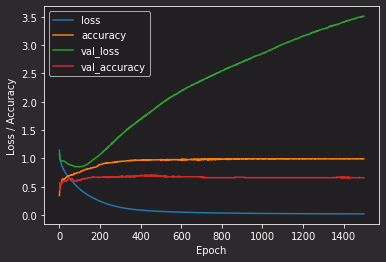

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0257         3.3622         3.0929         
accuracy:      0.9893         0.6581         0.5897         
weighted f1:   0.9893         0.6586         0.5890         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 2/108 ...
|---------------------Training---------------------|
|##################################################| 45.15625 s
|-----------------------DONE-----------------------|


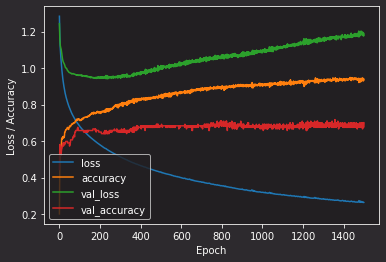

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.2131         1.0901         1.0641         
accuracy:      0.9422         0.7009         0.6359         
weighted f1:   0.9426         0.7031         0.6378         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 3/108 ...
|---------------------Training---------------------|
|##################################################| 43.953125 s
|-----------------------DONE-----------------------|


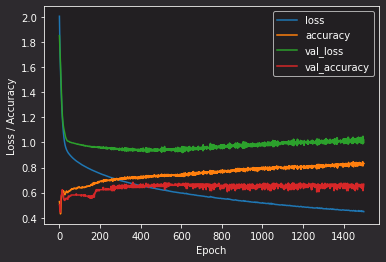

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4244         0.9084         0.9442         
accuracy:      0.8330         0.6667         0.5846         
weighted f1:   0.8347         0.6701         0.5901         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 4/108 ...
|---------------------Training---------------------|
|##################################################| 44.796875 s
|-----------------------DONE-----------------------|


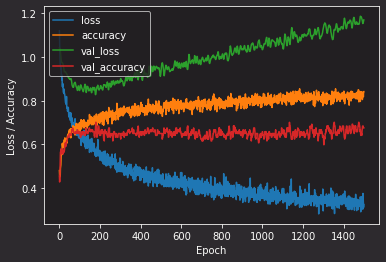

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3258         1.1700         1.2378         
accuracy:      0.8822         0.6752         0.6256         
weighted f1:   0.8829         0.6796         0.6295         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 5/108 ...
|---------------------Training---------------------|
|##################################################| 45.15625 s
|-----------------------DONE-----------------------|


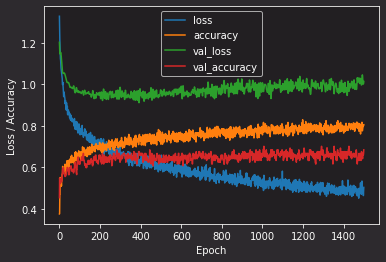

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4431         0.9338         0.9719         
accuracy:      0.8287         0.6838         0.5949         
weighted f1:   0.8304         0.6873         0.5994         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 6/108 ...
|---------------------Training---------------------|
|##################################################| 45.734375 s
|-----------------------DONE-----------------------|


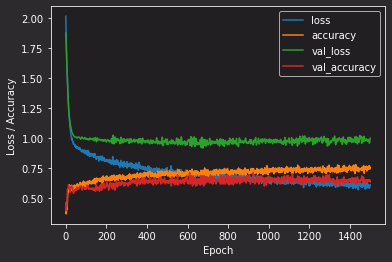

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5617         0.9049         0.9305         
accuracy:      0.7794         0.6325         0.5641         
weighted f1:   0.7831         0.6388         0.5735         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 7/108 ...
|---------------------Training---------------------|
|##################################################| 44.859375 s
|-----------------------DONE-----------------------|


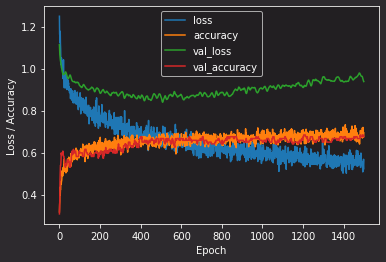

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5111         0.9378         1.0824         
accuracy:      0.7794         0.6752         0.5385         
weighted f1:   0.7820         0.6788         0.5507         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 8/108 ...
|---------------------Training---------------------|
|##################################################| 47.5 s
|-----------------------DONE-----------------------|


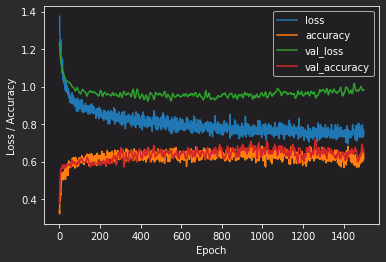

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6683         0.9158         0.9427         
accuracy:      0.7002         0.6581         0.5436         
weighted f1:   0.7110         0.6636         0.5596         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 9/108 ...
|---------------------Training---------------------|
|##################################################| 44.578125 s
|-----------------------DONE-----------------------|


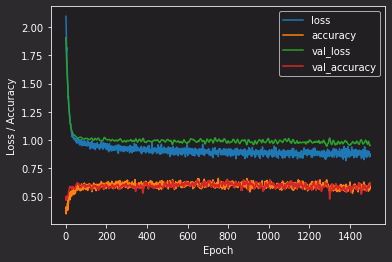

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7765         0.8885         0.9139         
accuracy:      0.6574         0.6239         0.5436         
weighted f1:   0.6758         0.6349         0.5616         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 10/108 ...
|---------------------Training---------------------|
|##################################################| 43.828125 s
|-----------------------DONE-----------------------|


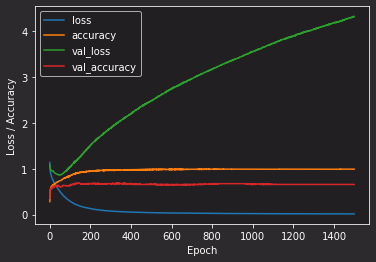

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0227         3.9833         3.3706         
accuracy:      0.9893         0.6581         0.6103         
weighted f1:   0.9893         0.6611         0.6081         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 11/108 ...
|---------------------Training---------------------|
|##################################################| 45.71875 s
|-----------------------DONE-----------------------|


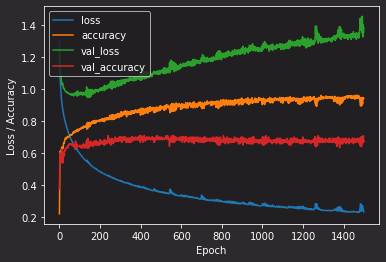

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.1873         1.3037         1.2467         
accuracy:      0.9550         0.6752         0.6359         
weighted f1:   0.9551         0.6768         0.6342         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 12/108 ...
|---------------------Training---------------------|
|##################################################| 47.3125 s
|-----------------------DONE-----------------------|


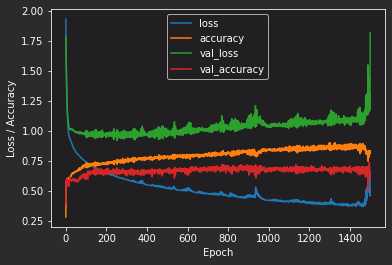

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9857         1.6928         1.6099         
accuracy:      0.7259         0.6325         0.5385         
weighted f1:   0.7439         0.6551         0.5586         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 13/108 ...
|---------------------Training---------------------|
|##################################################| 44.953125 s
|-----------------------DONE-----------------------|


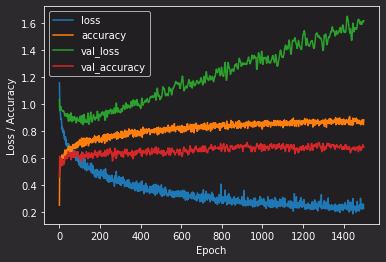

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.2058         1.6179         1.6259         
accuracy:      0.9336         0.6838         0.6308         
weighted f1:   0.9337         0.6858         0.6316         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 14/108 ...
|---------------------Training---------------------|
|##################################################| 45.15625 s
|-----------------------DONE-----------------------|


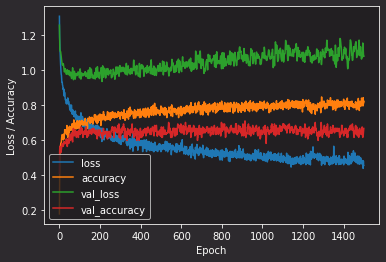

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3820         0.9745         1.0518         
accuracy:      0.8437         0.6667         0.6513         
weighted f1:   0.8449         0.6670         0.6541         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 15/108 ...
|---------------------Training---------------------|
|##################################################| 45.40625 s
|-----------------------DONE-----------------------|


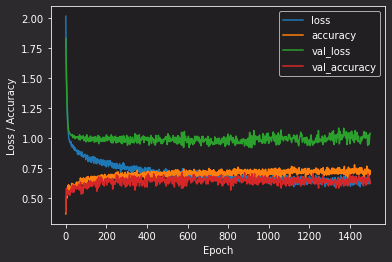

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5745         0.9410         0.9483         
accuracy:      0.7752         0.6325         0.5692         
weighted f1:   0.7775         0.6392         0.5813         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 16/108 ...
|---------------------Training---------------------|
|##################################################| 44.65625 s
|-----------------------DONE-----------------------|


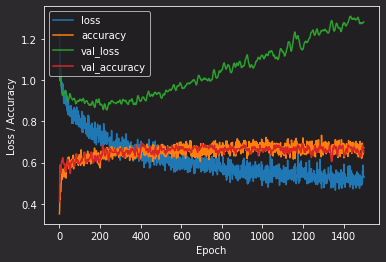

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4646         1.2807         1.3164         
accuracy:      0.7773         0.6496         0.5333         
weighted f1:   0.7807         0.6540         0.5466         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 17/108 ...
|---------------------Training---------------------|
|##################################################| 45.78125 s
|-----------------------DONE-----------------------|


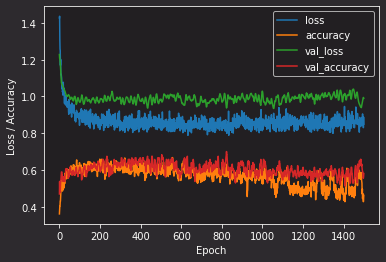

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7568         0.9289         0.9473         
accuracy:      0.6081         0.5812         0.5026         
weighted f1:   0.6315         0.6044         0.5286         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 18/108 ...
|---------------------Training---------------------|
|##################################################| 44.609375 s
|-----------------------DONE-----------------------|


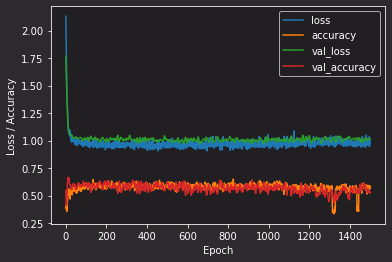

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9051         0.9759         1.0021         
accuracy:      0.5910         0.5299         0.5282         
weighted f1:   0.6124         0.5587         0.5478         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 19/108 ...
|---------------------Training---------------------|
|##################################################| 43.671875 s
|-----------------------DONE-----------------------|


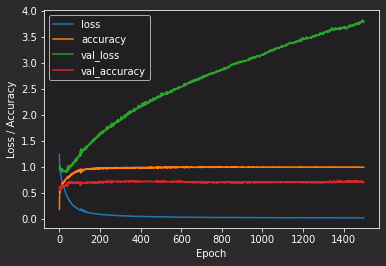

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0172         3.4913         3.5252         
accuracy:      0.9914         0.6923         0.6154         
weighted f1:   0.9914         0.6912         0.6128         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 20/108 ...
|---------------------Training---------------------|
|##################################################| 44.359375 s
|-----------------------DONE-----------------------|


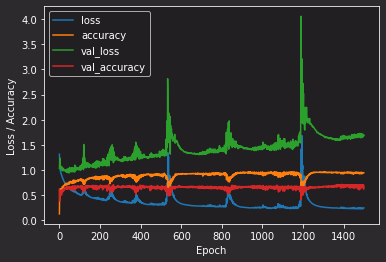

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.2129         1.5955         1.3398         
accuracy:      0.9315         0.6239         0.6205         
weighted f1:   0.9323         0.6293         0.6262         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 21/108 ...
|---------------------Training---------------------|
|##################################################| 44.515625 s
|-----------------------DONE-----------------------|


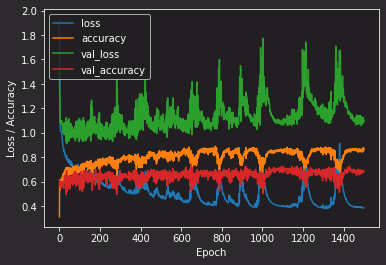

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.3641         0.9909         1.0339         
accuracy:      0.8544         0.6838         0.6154         
weighted f1:   0.8557         0.6875         0.6163         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 22/108 ...
|---------------------Training---------------------|
|##################################################| 45.0 s
|-----------------------DONE-----------------------|


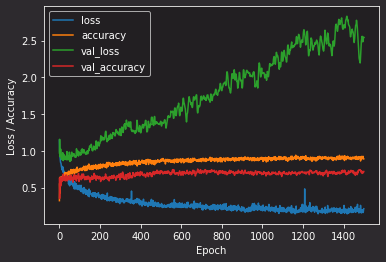

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.1336         2.5204         1.9699         
accuracy:      0.9465         0.7179         0.6513         
weighted f1:   0.9467         0.7202         0.6521         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 23/108 ...
|---------------------Training---------------------|
|##################################################| 43.921875 s
|-----------------------DONE-----------------------|


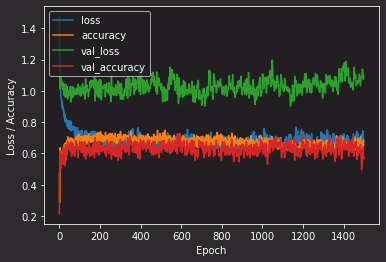

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5905         1.0183         0.9356         
accuracy:      0.7173         0.5726         0.5744         
weighted f1:   0.7216         0.5791         0.5792         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 24/108 ...
|---------------------Training---------------------|
|##################################################| 44.75 s
|-----------------------DONE-----------------------|


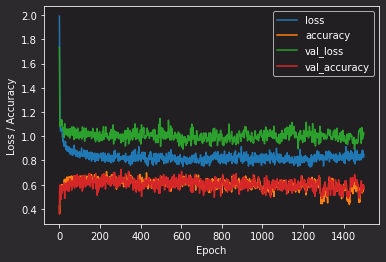

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7761         0.9544         0.9824         
accuracy:      0.6317         0.5641         0.5128         
weighted f1:   0.6477         0.5724         0.5235         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 25/108 ...
|---------------------Training---------------------|
|##################################################| 44.546875 s
|-----------------------DONE-----------------------|


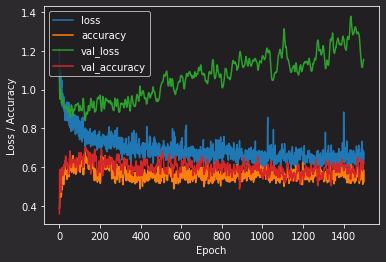

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5193         1.1538         1.2578         
accuracy:      0.7216         0.6325         0.5231         
weighted f1:   0.7364         0.6434         0.5406         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 26/108 ...
|---------------------Training---------------------|
|##################################################| 45.078125 s
|-----------------------DONE-----------------------|


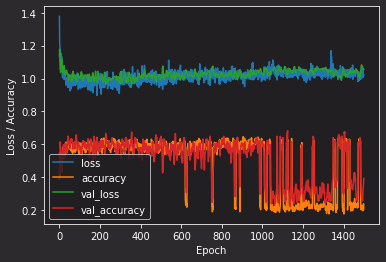

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9853         1.0324         1.0435         
accuracy:      0.4325         0.3932         0.3692         
weighted f1:   0.4762         0.4459         0.4152         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 27/108 ...
|---------------------Training---------------------|
|##################################################| 44.8125 s
|-----------------------DONE-----------------------|


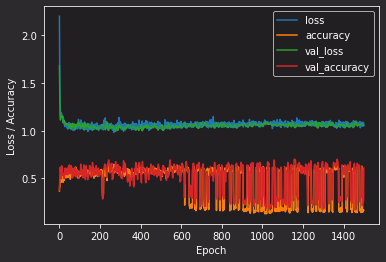

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0234         1.0420         1.0610         
accuracy:      0.6188         0.6068         0.5436         
weighted f1:   0.6055         0.5904         0.5199         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 28/108 ...
|---------------------Training---------------------|
|##################################################| 52.0 s
|-----------------------DONE-----------------------|


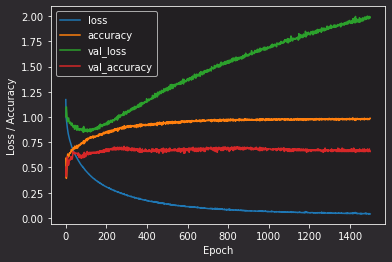

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0504         1.9893         2.0923         
accuracy:      0.9829         0.6581         0.6462         
weighted f1:   0.9829         0.6612         0.6433         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 29/108 ...
|---------------------Training---------------------|
|##################################################| 52.828125 s
|-----------------------DONE-----------------------|


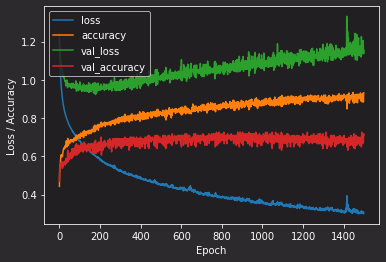

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.2570         1.0587         1.0286         
accuracy:      0.9143         0.7094         0.6462         
weighted f1:   0.9149         0.7097         0.6469         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 30/108 ...
|---------------------Training---------------------|
|##################################################| 52.828125 s
|-----------------------DONE-----------------------|


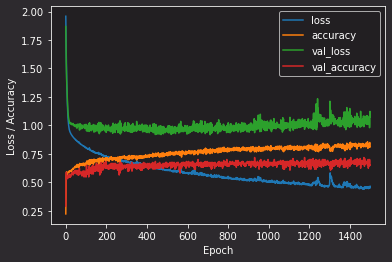

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4474         0.9709         0.9337         
accuracy:      0.8266         0.6496         0.6154         
weighted f1:   0.8289         0.6541         0.6226         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 31/108 ...
|---------------------Training---------------------|
|##################################################| 52.78125 s
|-----------------------DONE-----------------------|


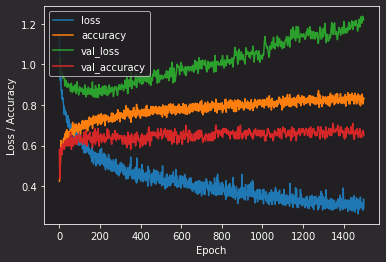

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.2849         1.2200         1.2539         
accuracy:      0.9036         0.6496         0.6051         
weighted f1:   0.9043         0.6541         0.6060         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 32/108 ...
|---------------------Training---------------------|
|##################################################| 53.0 s
|-----------------------DONE-----------------------|


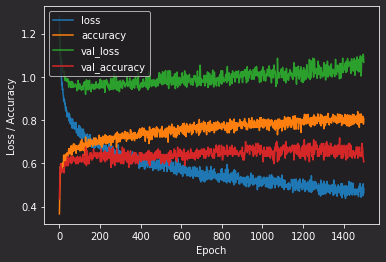

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4007         0.9799         1.0473         
accuracy:      0.8544         0.6068         0.6103         
weighted f1:   0.8554         0.6140         0.6127         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 33/108 ...
|---------------------Training---------------------|
|##################################################| 51.921875 s
|-----------------------DONE-----------------------|


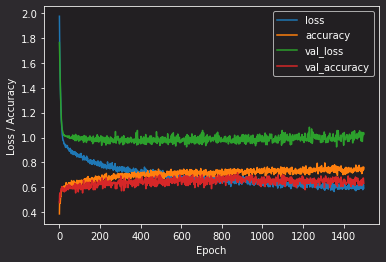

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5604         0.9315         0.9592         
accuracy:      0.7623         0.6325         0.5795         
weighted f1:   0.7657         0.6384         0.5896         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 34/108 ...
|---------------------Training---------------------|
|##################################################| 51.765625 s
|-----------------------DONE-----------------------|


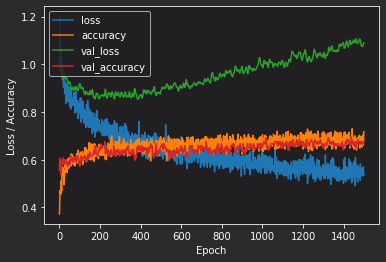

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4928         1.0905         1.1974         
accuracy:      0.7837         0.6752         0.5590         
weighted f1:   0.7870         0.6786         0.5707         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 35/108 ...
|---------------------Training---------------------|
|##################################################| 53.65625 s
|-----------------------DONE-----------------------|


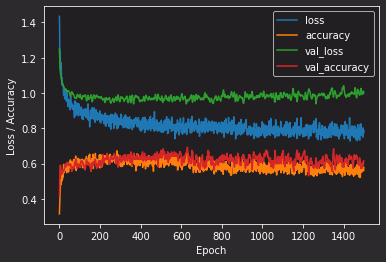

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6751         0.9286         0.9546         
accuracy:      0.6788         0.6154         0.5128         
weighted f1:   0.6980         0.6310         0.5359         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.005     Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 36/108 ...
|---------------------Training---------------------|
|##################################################| 53.0 s
|-----------------------DONE-----------------------|


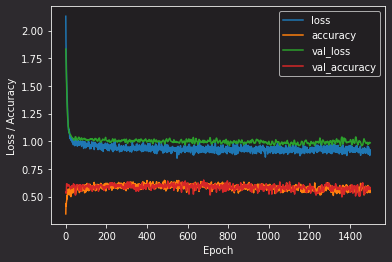

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8160         0.9306         0.9394         
accuracy:      0.6167         0.5812         0.5590         
weighted f1:   0.6375         0.5970         0.5769         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 37/108 ...
|---------------------Training---------------------|
|##################################################| 50.96875 s
|-----------------------DONE-----------------------|


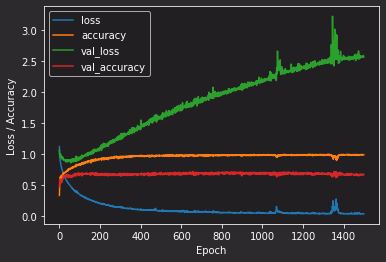

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0390         2.4901         2.4411         
accuracy:      0.9872         0.6667         0.6205         
weighted f1:   0.9872         0.6701         0.6210         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 38/108 ...
|---------------------Training---------------------|
|##################################################| 53.34375 s
|-----------------------DONE-----------------------|


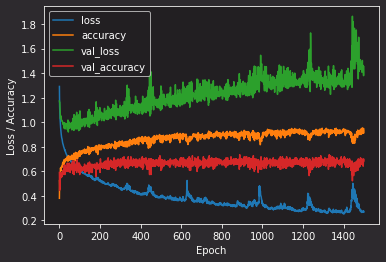

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.1859         1.3450         1.2831         
accuracy:      0.9315         0.6838         0.6359         
weighted f1:   0.9315         0.6843         0.6348         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 39/108 ...
|---------------------Training---------------------|
|##################################################| 51.90625 s
|-----------------------DONE-----------------------|


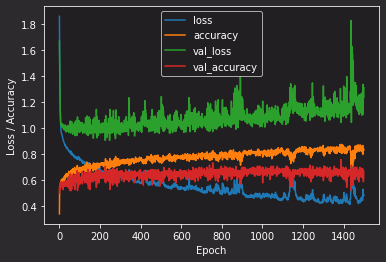

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4406         1.1162         1.1214         
accuracy:      0.8501         0.6667         0.5590         
weighted f1:   0.8524         0.6718         0.5640         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 40/108 ...
|---------------------Training---------------------|
|##################################################| 53.09375 s
|-----------------------DONE-----------------------|


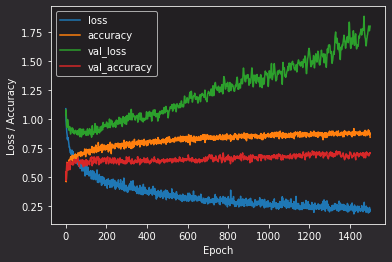

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.1863         1.8019         1.7489         
accuracy:      0.9400         0.7094         0.6359         
weighted f1:   0.9402         0.7098         0.6369         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 41/108 ...
|---------------------Training---------------------|
|##################################################| 53.375 s
|-----------------------DONE-----------------------|


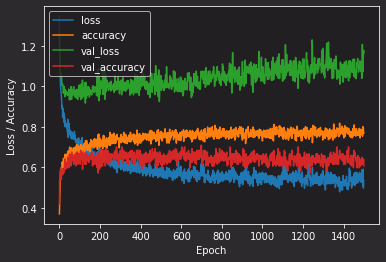

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4375         1.0631         1.0885         
accuracy:      0.8201         0.6068         0.5436         
weighted f1:   0.8222         0.6123         0.5514         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 42/108 ...
|---------------------Training---------------------|
|##################################################| 53.59375 s
|-----------------------DONE-----------------------|


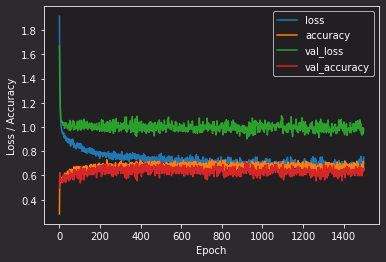

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6109         0.8907         0.9315         
accuracy:      0.7388         0.6410         0.5487         
weighted f1:   0.7431         0.6434         0.5621         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 43/108 ...
|---------------------Training---------------------|
|##################################################| 52.515625 s
|-----------------------DONE-----------------------|


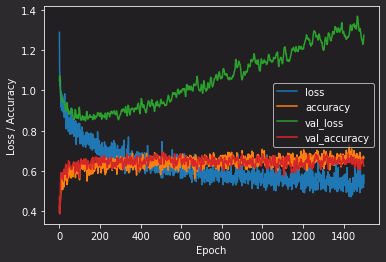

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.4742         1.2753         1.3540         
accuracy:      0.7687         0.6239         0.5385         
weighted f1:   0.7714         0.6291         0.5506         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 44/108 ...
|---------------------Training---------------------|
|##################################################| 52.40625 s
|-----------------------DONE-----------------------|


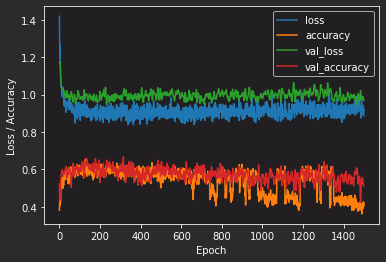

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8067         0.9174         0.9604         
accuracy:      0.5846         0.5128         0.5436         
weighted f1:   0.6142         0.5421         0.5751         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.01      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 45/108 ...
|---------------------Training---------------------|
|##################################################| 54.578125 s
|-----------------------DONE-----------------------|


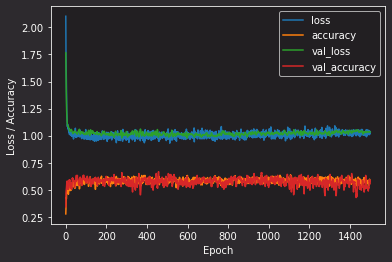

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9765         1.0121         1.0397         
accuracy:      0.5889         0.5556         0.5128         
weighted f1:   0.6103         0.5824         0.5285         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 46/108 ...
|---------------------Training---------------------|
|##################################################| 50.828125 s
|-----------------------DONE-----------------------|


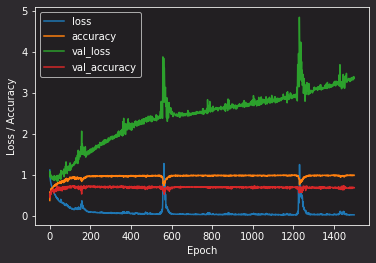

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.0281         3.3545         3.4705         
accuracy:      0.9893         0.6838         0.6256         
weighted f1:   0.9893         0.6839         0.6266         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 47/108 ...
|---------------------Training---------------------|
|##################################################| 51.484375 s
|-----------------------DONE-----------------------|


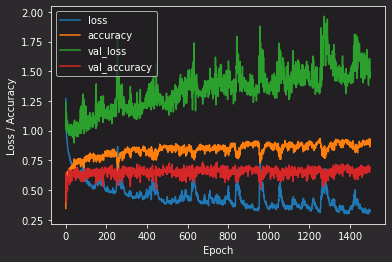

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.2281         1.3870         1.4118         
accuracy:      0.9208         0.6923         0.5846         
weighted f1:   0.9213         0.6965         0.5889         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 48/108 ...
|---------------------Training---------------------|
|##################################################| 52.484375 s
|-----------------------DONE-----------------------|


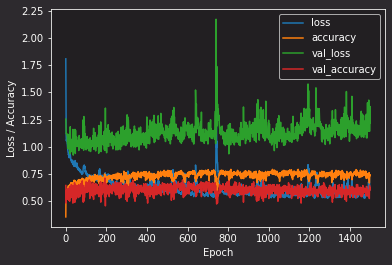

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5550         1.1031         1.1209         
accuracy:      0.7559         0.6154         0.5282         
weighted f1:   0.7594         0.6208         0.5403         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 49/108 ...
|---------------------Training---------------------|
|##################################################| 52.703125 s
|-----------------------DONE-----------------------|


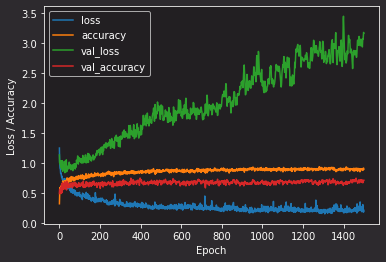

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.1428         2.8004         2.2512         
accuracy:      0.9507         0.7094         0.6462         
weighted f1:   0.9509         0.7074         0.6423         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 50/108 ...
|---------------------Training---------------------|
|##################################################| 53.765625 s
|-----------------------DONE-----------------------|


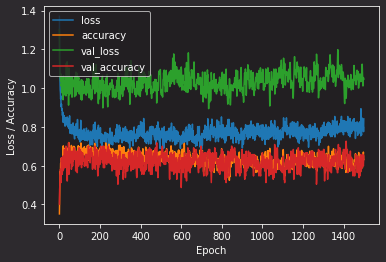

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6596         0.9860         0.9427         
accuracy:      0.6938         0.6496         0.5487         
weighted f1:   0.6966         0.6629         0.5524         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 51/108 ...
|---------------------Training---------------------|
|##################################################| 52.71875 s
|-----------------------DONE-----------------------|


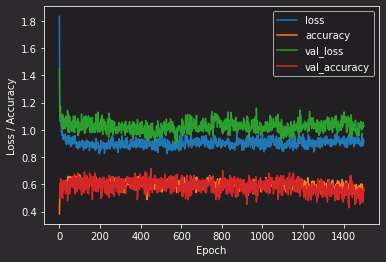

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8719         0.9935         0.9773         
accuracy:      0.6167         0.5726         0.5538         
weighted f1:   0.6209         0.5671         0.5442         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 52/108 ...
|---------------------Training---------------------|
|##################################################| 52.53125 s
|-----------------------DONE-----------------------|


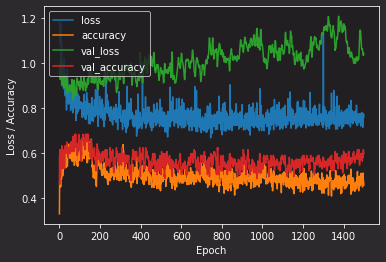

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6251         1.0433         1.3041         
accuracy:      0.6552         0.5983         0.4821         
weighted f1:   0.6737         0.6013         0.5048         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 53/108 ...
|---------------------Training---------------------|
|##################################################| 52.53125 s
|-----------------------DONE-----------------------|


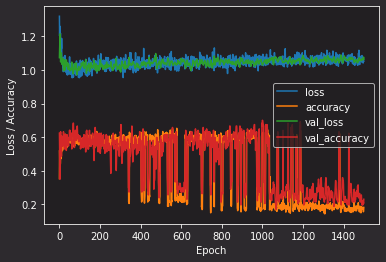

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0251         1.0506         1.0748         
accuracy:      0.2355         0.2308         0.2308         
weighted f1:   0.2392         0.2667         0.2697         




--------------------------------Model parameters--------------------------------

 Nodes: 155      Batch: 256         lr: 0.03      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 54/108 ...
|---------------------Training---------------------|
|##################################################| 54.109375 s
|-----------------------DONE-----------------------|


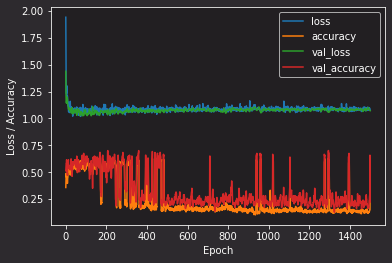

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0514         1.0643         1.0747         
accuracy:      0.2719         0.2222         0.2410         
weighted f1:   0.2900         0.2383         0.2727         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 55/108 ...
|---------------------Training---------------------|
|##################################################| 44.734375 s
|-----------------------DONE-----------------------|


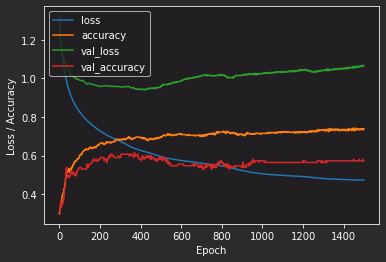

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6185         1.0638         1.2392         
accuracy:      0.7388         0.5726         0.5692         
weighted f1:   0.7410         0.5825         0.5752         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 56/108 ...
|---------------------Training---------------------|
|##################################################| 44.9375 s
|-----------------------DONE-----------------------|


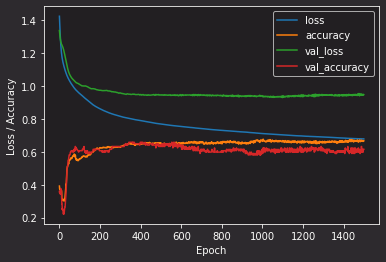

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7277         0.9065         0.9583         
accuracy:      0.6702         0.6154         0.5949         
weighted f1:   0.6757         0.6265         0.5995         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 57/108 ...
|---------------------Training---------------------|
|##################################################| 45.40625 s
|-----------------------DONE-----------------------|


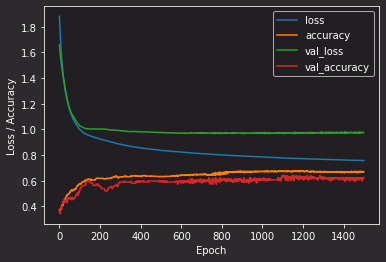

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7797         0.9356         0.9597         
accuracy:      0.6702         0.6239         0.5795         
weighted f1:   0.6807         0.6422         0.5914         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 58/108 ...
|---------------------Training---------------------|
|##################################################| 46.4375 s
|-----------------------DONE-----------------------|


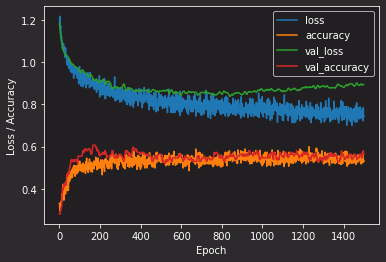

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7187         0.8934         0.9947         
accuracy:      0.6467         0.5641         0.4872         
weighted f1:   0.6528         0.5795         0.5021         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 59/108 ...
|---------------------Training---------------------|
|##################################################| 47.25 s
|-----------------------DONE-----------------------|


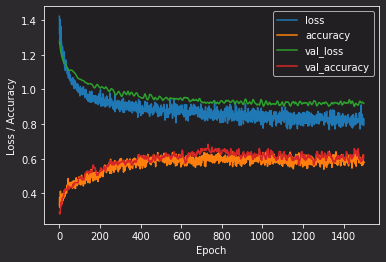

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7766         0.8954         0.9249         
accuracy:      0.6916         0.6068         0.5590         
weighted f1:   0.6988         0.6207         0.5675         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 60/108 ...
|---------------------Training---------------------|
|##################################################| 44.046875 s
|-----------------------DONE-----------------------|


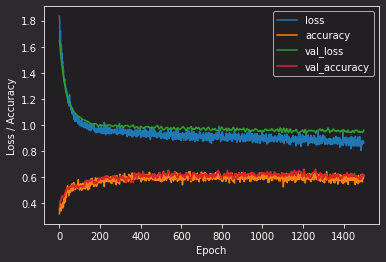

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8421         0.9276         0.9475         
accuracy:      0.6445         0.6154         0.5128         
weighted f1:   0.6600         0.6364         0.5319         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 61/108 ...
|---------------------Training---------------------|
|##################################################| 44.421875 s
|-----------------------DONE-----------------------|


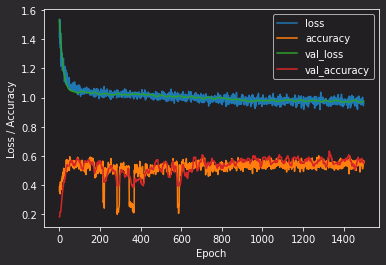

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8641         0.9751         1.0042         
accuracy:      0.5974         0.5470         0.5026         
weighted f1:   0.6142         0.5817         0.5176         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 62/108 ...
|---------------------Training---------------------|
|##################################################| 45.390625 s
|-----------------------DONE-----------------------|


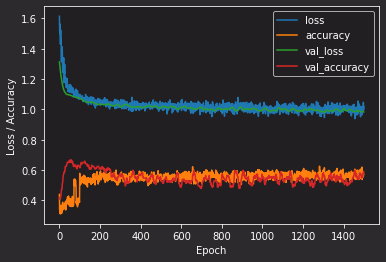

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9292         0.9700         1.0024         
accuracy:      0.6146         0.5897         0.5385         
weighted f1:   0.6236         0.6043         0.5381         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.005     Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 63/108 ...
|---------------------Training---------------------|
|##################################################| 44.921875 s
|-----------------------DONE-----------------------|


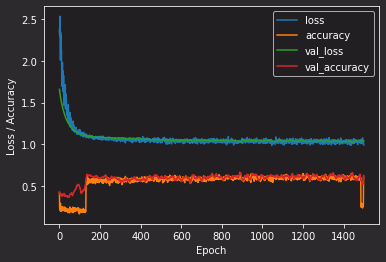

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9939         1.0292         1.0497         
accuracy:      0.5846         0.6239         0.5436         
weighted f1:   0.6004         0.6375         0.5507         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 64/108 ...
|---------------------Training---------------------|
|##################################################| 44.734375 s
|-----------------------DONE-----------------------|


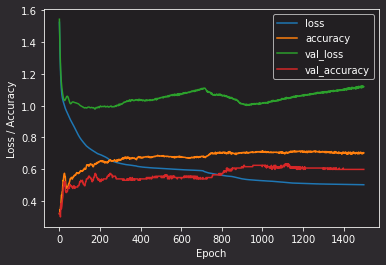

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6457         1.1186         1.1088         
accuracy:      0.7066         0.5983         0.5692         
weighted f1:   0.7088         0.6060         0.5785         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 65/108 ...
|---------------------Training---------------------|
|##################################################| 44.234375 s
|-----------------------DONE-----------------------|


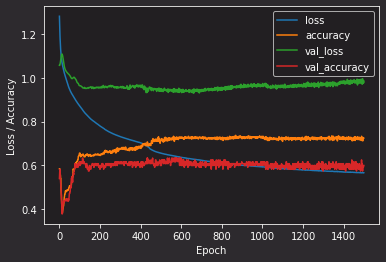

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6383         0.9445         0.9995         
accuracy:      0.7259         0.5983         0.5487         
weighted f1:   0.7313         0.6151         0.5605         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 66/108 ...
|---------------------Training---------------------|
|##################################################| 44.53125 s
|-----------------------DONE-----------------------|


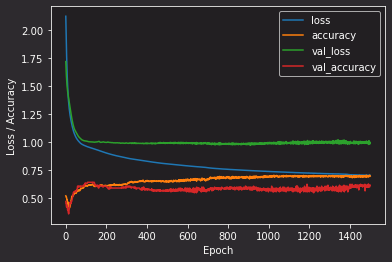

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7320         0.9518         0.9205         
accuracy:      0.6981         0.6154         0.5641         
weighted f1:   0.7073         0.6308         0.5758         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 67/108 ...
|---------------------Training---------------------|
|##################################################| 44.25 s
|-----------------------DONE-----------------------|


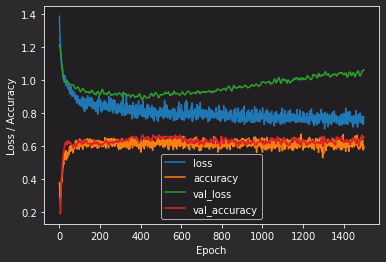

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7431         1.0619         1.1234         
accuracy:      0.6660         0.6496         0.5846         
weighted f1:   0.6757         0.6610         0.5934         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 68/108 ...
|---------------------Training---------------------|
|##################################################| 44.390625 s
|-----------------------DONE-----------------------|


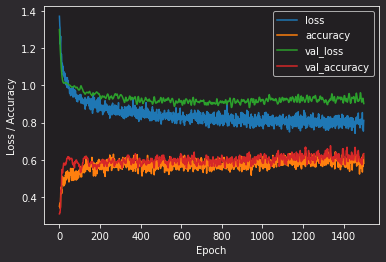

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7447         0.8782         0.9135         
accuracy:      0.6745         0.6325         0.5179         
weighted f1:   0.6857         0.6448         0.5313         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 69/108 ...
|---------------------Training---------------------|
|##################################################| 44.078125 s
|-----------------------DONE-----------------------|


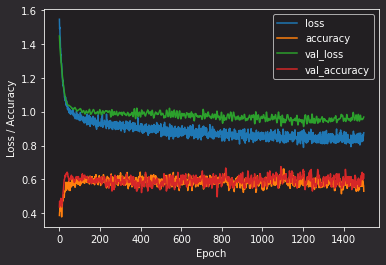

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8100         0.9378         0.9637         
accuracy:      0.6488         0.6068         0.4974         
weighted f1:   0.6603         0.6200         0.5103         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 70/108 ...
|---------------------Training---------------------|
|##################################################| 44.40625 s
|-----------------------DONE-----------------------|


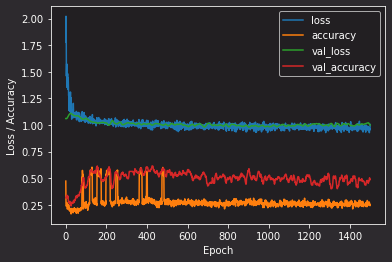

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8658         0.9994         1.0231         
accuracy:      0.5567         0.4872         0.4564         
weighted f1:   0.5755         0.5172         0.4819         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 71/108 ...
|---------------------Training---------------------|
|##################################################| 44.53125 s
|-----------------------DONE-----------------------|


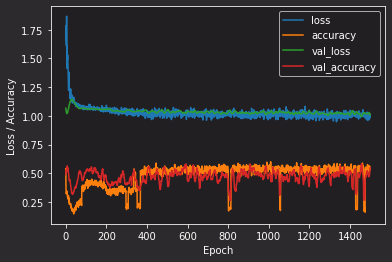

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9297         0.9918         0.9899         
accuracy:      0.5589         0.5470         0.4615         
weighted f1:   0.5689         0.5586         0.4713         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.01      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 72/108 ...
|---------------------Training---------------------|
|##################################################| 44.75 s
|-----------------------DONE-----------------------|


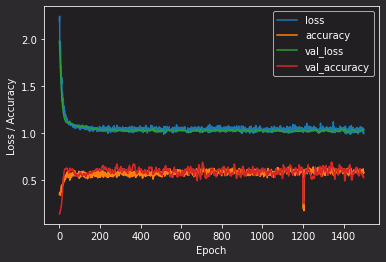

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9964         1.0283         1.0466         
accuracy:      0.5482         0.5299         0.4923         
weighted f1:   0.5720         0.5615         0.5076         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 73/108 ...
|---------------------Training---------------------|
|##################################################| 44.34375 s
|-----------------------DONE-----------------------|


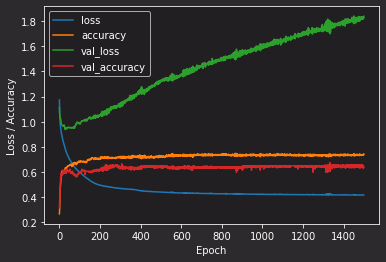

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5656         1.8173         1.5704         
accuracy:      0.7345         0.6410         0.5282         
weighted f1:   0.7359         0.6458         0.5346         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 74/108 ...
|---------------------Training---------------------|
|##################################################| 46.3125 s
|-----------------------DONE-----------------------|


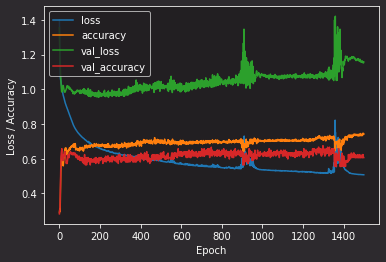

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5800         1.1066         1.1769         
accuracy:      0.7430         0.6068         0.5385         
weighted f1:   0.7445         0.6136         0.5510         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 75/108 ...
|---------------------Training---------------------|
|##################################################| 44.03125 s
|-----------------------DONE-----------------------|


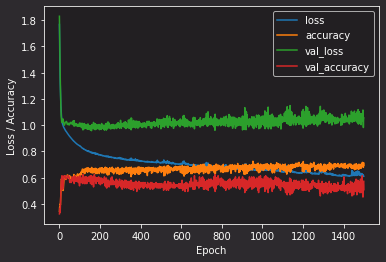

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6723         1.0042         1.0013         
accuracy:      0.6981         0.5726         0.5590         
weighted f1:   0.7067         0.5889         0.5736         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 76/108 ...
|---------------------Training---------------------|
|##################################################| 45.484375 s
|-----------------------DONE-----------------------|


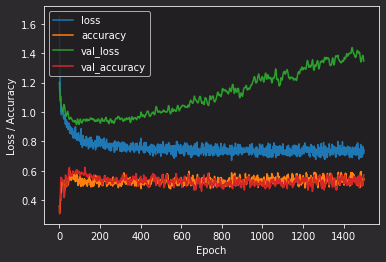

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6719         1.3462         1.2927         
accuracy:      0.6617         0.5726         0.5231         
weighted f1:   0.6654         0.5832         0.5291         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 77/108 ...
|---------------------Training---------------------|
|##################################################| 44.15625 s
|-----------------------DONE-----------------------|


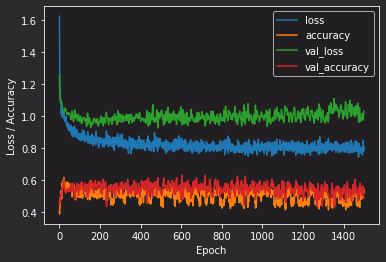

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7561         1.0027         1.0209         
accuracy:      0.6317         0.4872         0.4769         
weighted f1:   0.6465         0.5036         0.4889         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 78/108 ...
|---------------------Training---------------------|
|##################################################| 44.828125 s
|-----------------------DONE-----------------------|


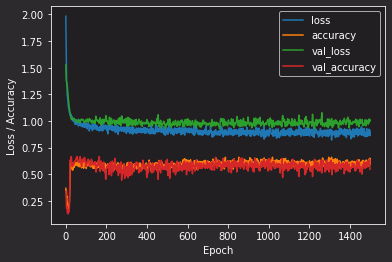

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8615         0.9805         0.9927         
accuracy:      0.6060         0.5470         0.5333         
weighted f1:   0.6166         0.5667         0.5472         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 79/108 ...
|---------------------Training---------------------|
|##################################################| 43.71875 s
|-----------------------DONE-----------------------|


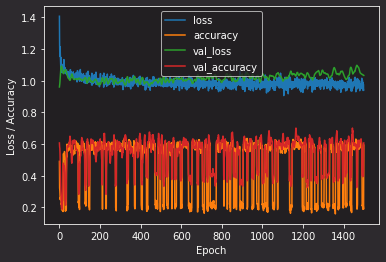

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8269         1.0335         1.1353         
accuracy:      0.6210         0.6068         0.5538         
weighted f1:   0.6264         0.6119         0.5514         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 80/108 ...
|---------------------Training---------------------|
|##################################################| 44.984375 s
|-----------------------DONE-----------------------|


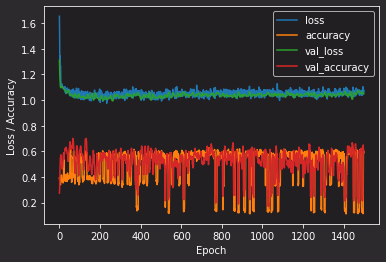

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0204         1.0377         1.0609         
accuracy:      0.5653         0.5983         0.5128         
weighted f1:   0.5533         0.5828         0.4845         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 512         lr: 0.03      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 81/108 ...
|---------------------Training---------------------|
|##################################################| 44.484375 s
|-----------------------DONE-----------------------|


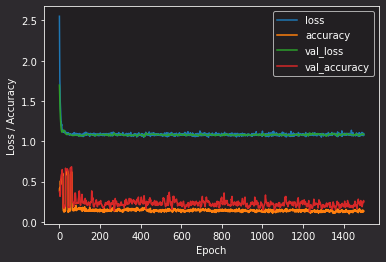

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0554         1.0761         1.0841         
accuracy:      0.2505         0.2479         0.2205         
weighted f1:   0.2487         0.2813         0.2411         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 82/108 ...
|---------------------Training---------------------|
|##################################################| 51.609375 s
|-----------------------DONE-----------------------|


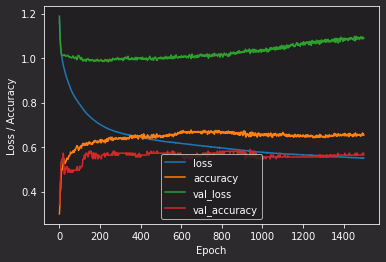

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6827         1.0906         1.1227         
accuracy:      0.6488         0.5641         0.5436         
weighted f1:   0.6531         0.5670         0.5511         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 83/108 ...
|---------------------Training---------------------|
|##################################################| 52.578125 s
|-----------------------DONE-----------------------|


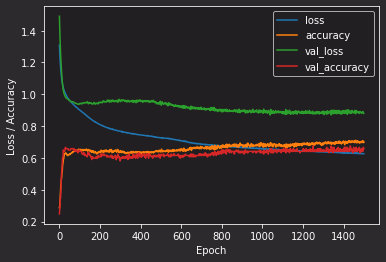

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6862         0.8323         0.9903         
accuracy:      0.7002         0.6581         0.5436         
weighted f1:   0.7055         0.6677         0.5545         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 84/108 ...
|---------------------Training---------------------|
|##################################################| 52.21875 s
|-----------------------DONE-----------------------|


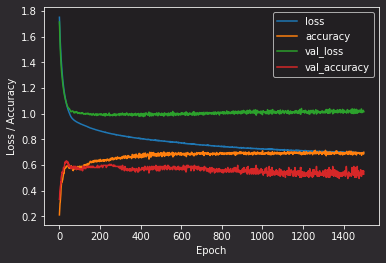

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7069         0.9633         0.9550         
accuracy:      0.7002         0.5299         0.5436         
weighted f1:   0.7110         0.5512         0.5538         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 85/108 ...
|---------------------Training---------------------|
|##################################################| 51.734375 s
|-----------------------DONE-----------------------|


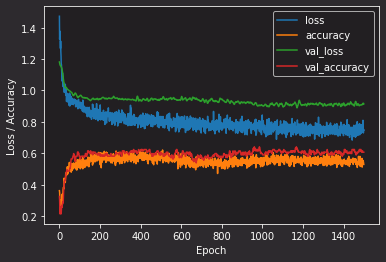

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7026         0.9145         0.9634         
accuracy:      0.6981         0.6068         0.5231         
weighted f1:   0.7029         0.6147         0.5403         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 86/108 ...
|---------------------Training---------------------|
|##################################################| 52.3125 s
|-----------------------DONE-----------------------|


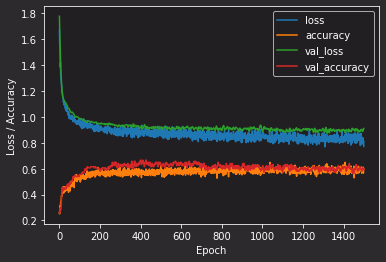

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8023         0.8916         0.9315         
accuracy:      0.6445         0.5983         0.5333         
weighted f1:   0.6544         0.6080         0.5440         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 87/108 ...
|---------------------Training---------------------|
|##################################################| 52.828125 s
|-----------------------DONE-----------------------|


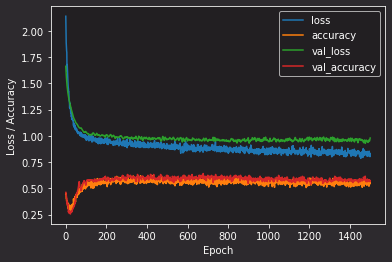

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8186         0.9466         0.9676         
accuracy:      0.6124         0.5726         0.5333         
weighted f1:   0.6286         0.5956         0.5491         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 88/108 ...
|---------------------Training---------------------|
|##################################################| 52.484375 s
|-----------------------DONE-----------------------|


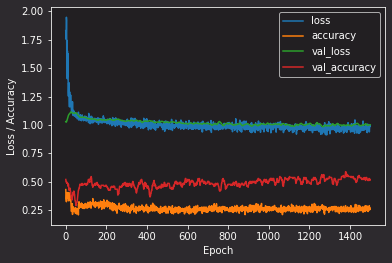

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8806         1.0021         1.0453         
accuracy:      0.5696         0.5214         0.5128         
weighted f1:   0.5945         0.5610         0.5359         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 89/108 ...
|---------------------Training---------------------|
|##################################################| 51.921875 s
|-----------------------DONE-----------------------|


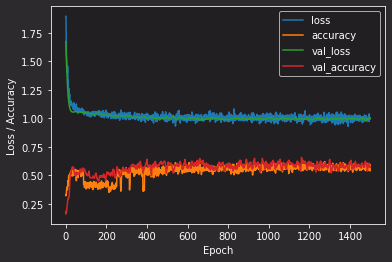

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9406         0.9903         1.0073         
accuracy:      0.6167         0.5726         0.5590         
weighted f1:   0.6273         0.5904         0.5659         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.005     Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 90/108 ...
|---------------------Training---------------------|
|##################################################| 52.421875 s
|-----------------------DONE-----------------------|


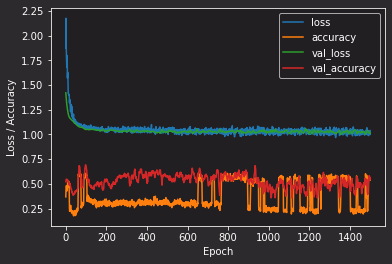

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9666         0.9979         1.0265         
accuracy:      0.5889         0.5641         0.4667         
weighted f1:   0.6050         0.5871         0.4857         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 91/108 ...
|---------------------Training---------------------|
|##################################################| 52.796875 s
|-----------------------DONE-----------------------|


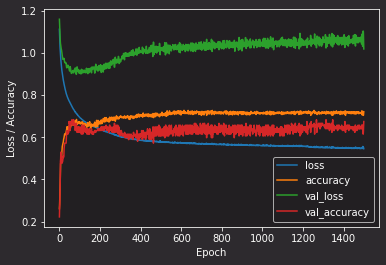

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6414         1.0199         1.1539         
accuracy:      0.7216         0.6752         0.5590         
weighted f1:   0.7265         0.6816         0.5664         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 92/108 ...
|---------------------Training---------------------|
|##################################################| 52.6875 s
|-----------------------DONE-----------------------|


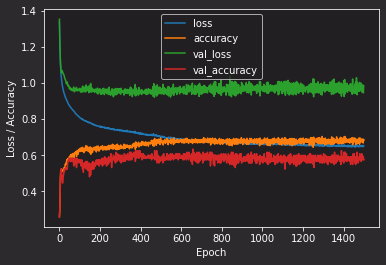

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7113         0.9489         1.0140         
accuracy:      0.6767         0.5726         0.5026         
weighted f1:   0.6877         0.5903         0.5169         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 93/108 ...
|---------------------Training---------------------|
|##################################################| 51.046875 s
|-----------------------DONE-----------------------|


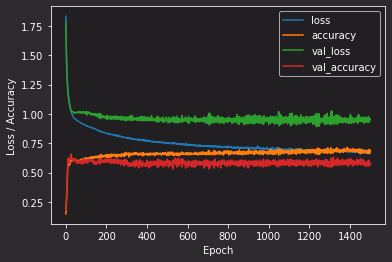

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7159         0.9087         0.9912         
accuracy:      0.6702         0.5641         0.5641         
weighted f1:   0.6795         0.5800         0.5726         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 94/108 ...
|---------------------Training---------------------|
|##################################################| 52.296875 s
|-----------------------DONE-----------------------|


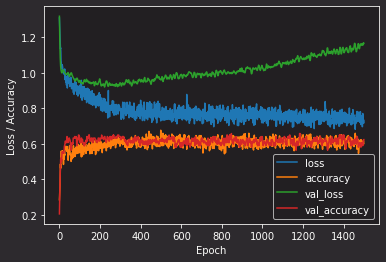

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6942         1.1655         1.2494         
accuracy:      0.6959         0.6239         0.5436         
weighted f1:   0.7032         0.6390         0.5545         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 95/108 ...
|---------------------Training---------------------|
|##################################################| 52.625 s
|-----------------------DONE-----------------------|


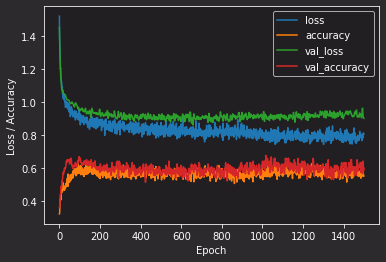

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7196         0.8746         0.9913         
accuracy:      0.6488         0.5983         0.5231         
weighted f1:   0.6577         0.6131         0.5367         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 96/108 ...
|---------------------Training---------------------|
|##################################################| 51.40625 s
|-----------------------DONE-----------------------|


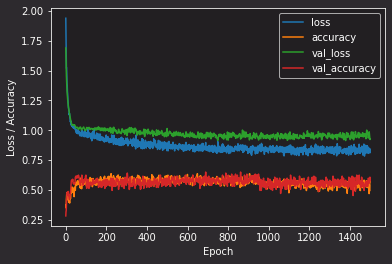

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7504         0.8928         0.9355         
accuracy:      0.6253         0.5812         0.4667         
weighted f1:   0.6349         0.5961         0.4749         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 97/108 ...
|---------------------Training---------------------|
|##################################################| 53.15625 s
|-----------------------DONE-----------------------|


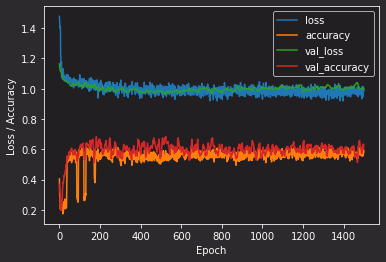

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8587         1.0022         1.0442         
accuracy:      0.6445         0.6154         0.5538         
weighted f1:   0.6515         0.6199         0.5502         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 98/108 ...
|---------------------Training---------------------|
|##################################################| 52.65625 s
|-----------------------DONE-----------------------|


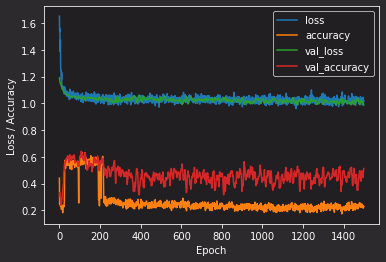

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.9349         0.9721         1.0206         
accuracy:      0.4797         0.5128         0.3795         
weighted f1:   0.5081         0.5398         0.4110         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.01      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 99/108 ...
|---------------------Training---------------------|
|##################################################| 52.265625 s
|-----------------------DONE-----------------------|


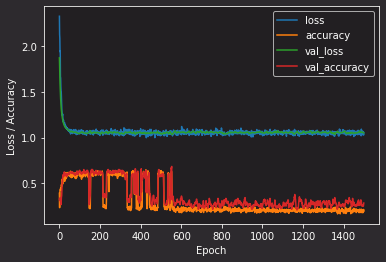

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0125         1.0402         1.0683         
accuracy:      0.2891         0.2821         0.2513         
weighted f1:   0.3065         0.3198         0.2746         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0        lambd: 0       

--------------------------------------------------------------------------------

Training model 100/108 ...
|---------------------Training---------------------|
|##################################################| 50.96875 s
|-----------------------DONE-----------------------|


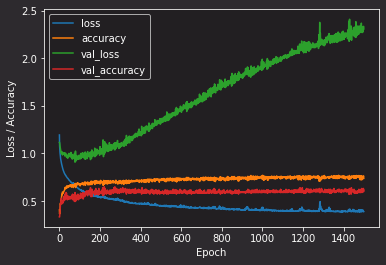

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5368         2.2013         1.5646         
accuracy:      0.7537         0.6154         0.5487         
weighted f1:   0.7554         0.6272         0.5534         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0        lambd: 0.01    

--------------------------------------------------------------------------------

Training model 101/108 ...
|---------------------Training---------------------|
|##################################################| 52.15625 s
|-----------------------DONE-----------------------|


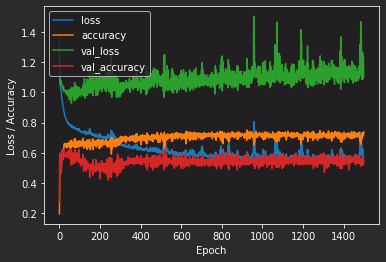

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.5920         1.0546         1.0606         
accuracy:      0.7366         0.5470         0.5333         
weighted f1:   0.7403         0.5556         0.5424         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0        lambd: 0.05    

--------------------------------------------------------------------------------

Training model 102/108 ...
|---------------------Training---------------------|
|##################################################| 52.0625 s
|-----------------------DONE-----------------------|


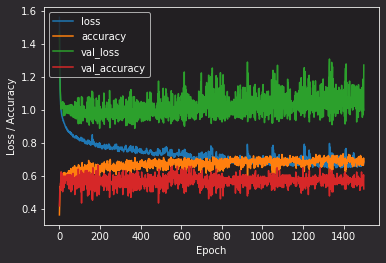

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8351         1.2107         1.1588         
accuracy:      0.6274         0.5214         0.4615         
weighted f1:   0.6470         0.5513         0.4959         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0.3      lambd: 0       

--------------------------------------------------------------------------------

Training model 103/108 ...
|---------------------Training---------------------|
|##################################################| 53.484375 s
|-----------------------DONE-----------------------|


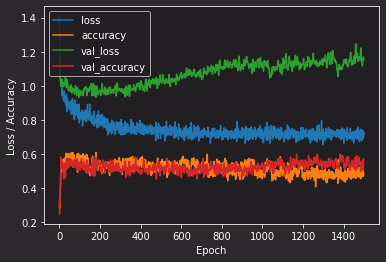

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.6601         1.1527         1.2646         
accuracy:      0.6338         0.5726         0.4872         
weighted f1:   0.6489         0.5907         0.5001         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0.3      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 104/108 ...
|---------------------Training---------------------|
|##################################################| 54.03125 s
|-----------------------DONE-----------------------|


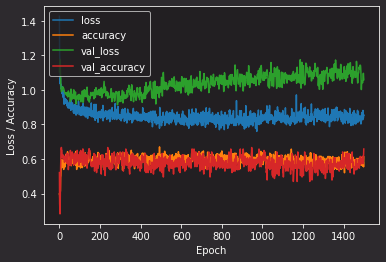

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.7803         1.0300         0.9583         
accuracy:      0.6724         0.6581         0.5846         
weighted f1:   0.6681         0.6479         0.5669         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0.3      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 105/108 ...
|---------------------Training---------------------|
|##################################################| 53.375 s
|-----------------------DONE-----------------------|


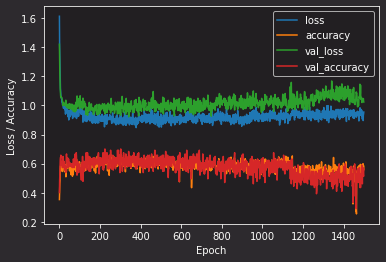

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8851         0.9892         0.9928         
accuracy:      0.6253         0.5641         0.5026         
weighted f1:   0.6260         0.5755         0.5030         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0.8      lambd: 0       

--------------------------------------------------------------------------------

Training model 106/108 ...
|---------------------Training---------------------|
|##################################################| 51.9375 s
|-----------------------DONE-----------------------|


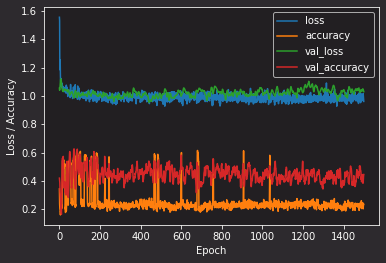

========================Stat summary========================

               Train          Val            Test           
log_loss:      0.8674         1.0305         1.0944         
accuracy:      0.5225         0.4444         0.4410         
weighted f1:   0.5463         0.4830         0.4702         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0.8      lambd: 0.01    

--------------------------------------------------------------------------------

Training model 107/108 ...
|---------------------Training---------------------|
|##################################################| 54.375 s
|-----------------------DONE-----------------------|


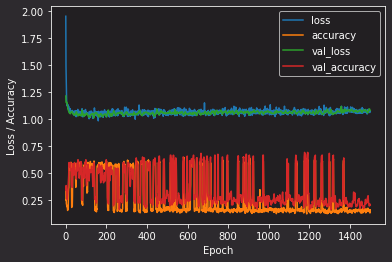

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0426         1.0733         1.0788         
accuracy:      0.2420         0.2051         0.2051         
weighted f1:   0.2045         0.1820         0.2082         




--------------------------------Model parameters--------------------------------

 Nodes: 9        Batch: 256         lr: 0.03      Drop: 0.8      lambd: 0.05    

--------------------------------------------------------------------------------

Training model 108/108 ...
|---------------------Training---------------------|
|##################################################| 52.890625 s
|-----------------------DONE-----------------------|


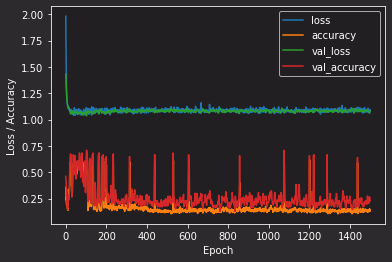

========================Stat summary========================

               Train          Val            Test           
log_loss:      1.0665         1.0798         1.0864         
accuracy:      0.2505         0.2308         0.2154         
weighted f1:   0.2593         0.2726         0.2425         


Wall time: 1h 6min 44s


In [548]:
%%time

# bs = x_trn.shape[0]
# bs = 256
epochs = 1500

A = [0.5, 8]
batch_sizes = [512, 256]
learning_rates = [0.005, 0.01, 0.03]
dropouts = [0, 0.3, 0.8]
lambdas = [0, 0.01, 0.05]

modelnbr=1

for a in A: 
  for bs in batch_sizes:
    for lr in learning_rates:
      for drop in dropouts:
        for lambd in lambdas:

# a = 2
          nbr_nodes = int(x_trn.shape[0]/(a*(inp_dim-num_classes)))

          INPUT = {'inp_dim': inp_dim,         
                  'n_nod': [nbr_nodes],                  
                  'drop_nod': drop,                
                  'act_fun': 'relu',             
                  'out_act_fun': 'softmax',      
                  'opt_method': 'Adam',         
                  'cost_fun': 'categorical_crossentropy',           
                  'lr_rate': lr,            
                  'metric': 'accuracy',              
                  'lambd' : lambd,             
                  'num_out' : num_classes } 


          model_weighted = mlp(**INPUT)
          model_non_weighted = mlp(**INPUT)
          
          # model_weighted.summary()
          # model_non_weighted.summary()

          print('\n\n{:=^80}'.format(''))
          print('{:-^80}\n'.format('Model parameters'))
          print('{:>8}{:<8}{:>8}{:<8}{:>8}{:<8}{:>8}{:<8}{:>8}{:<8}'.format("Nodes: ", nbr_nodes, "Batch: ", bs, "lr: ", lr, "Drop: ", drop, 'lambd: ', lambd))
          print('\n'+'-'*80+'\n')
          print("Training model {}/{} ...".format(modelnbr,param_perm))
          estimator_weighted = model_weighted.fit(x_trn, d_trn,
                                epochs = epochs,     
                                validation_data=(x_val,d_val),
                                class_weight=weights_dict,
                                batch_size=bs,   
                              #   callbacks=[TqdmCallback(verbose=1)],
                                callbacks=[LoadingBarCallback(nbro_epochs = epochs)],
                                # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
                                verbose = 0)
          plot_history(estimator_weighted)
          print_model_stats(model_weighted)

          modelnbr+=1

          # print("Training non-weighted model...")
          # estimator_non_weighted = model_weighted.fit(x_trn, d_trn,
          #                       epochs = epochs,     
          #                       validation_data=(x_val,d_val),
          #                     #   class_weight=weights_dict,
          #                       batch_size=bs,   
          #                       callbacks=[TqdmCallback(verbose=1)],
          #                       # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
          #                       verbose = 0)

          # plot_history(estimator_non_weighted)
          # print_model_stats(model_non_weighted)


### Sampling Models Question 9 

#### Setup (Read data, Over-/Undersample etc)

##### V1 Sampled first......

In [110]:
%%time
#OBS THIS OVERWRITES ALL CURRENT SAMPLER MODELS

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

# Load Bioconcentration training and test data
x_trn_og, d_trn_og, x_tst, d_tst = bcf()
num_classes = d_tst.shape[1]
inp_dim = x_trn_og.shape[1]

sm = SMOTE(random_state = seed)#, k_neighbors = 10)
x_trn_sm, d_trn_sm = sm.fit_resample(x_trn_og, d_trn_og)

ros = RandomOverSampler(random_state = seed)
x_trn_ros, d_trn_ros = ros.fit_resample(x_trn_og, d_trn_og)

rus = RandomUnderSampler(random_state = seed)
x_trn_rus, d_trn_rus = rus.fit_resample(x_trn_og, d_trn_og)

smt = SMOTETomek(random_state = seed)
x_trn_smt, d_trn_smt = smt.fit_resample(x_trn_og, d_trn_og)

sme = SMOTEENN(random_state = seed)
x_trn_sme, d_trn_sme = sme.fit_resample(x_trn_og, d_trn_og)

model_samplers = {}
estimator_samplers = {}


##### V2 split first!!!

In [534]:
%%time
#OBS RUNNING THIS CELL OVERWRITES ALL CURRENT SAMPLER MODELS

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

validation_size = 0.2


# Load Bioconcentration training and test data
x_trn_og, d_trn_og, x_tst, d_tst = bcf()
num_classes = d_tst.shape[1]
inp_dim = x_trn_og.shape[1]

# Split train set into train and validation
x_trn, x_val, d_trn, d_val = train_test_split(x_trn_og, d_trn_og, test_size=validation_size, stratify=d_trn_og)

# Normalize in relation to train set
# mu, std = standard(x_trn)
mu, std = standard(x_trn)
# x_trn_norm = (x_trn_og - mu)/std
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std 


model_samplers = {}
estimator_samplers = {}
x_trn_samplers = {}
d_trn_samplers = {}

sm = SMOTE(random_state = seed)#, k_neighbors = 10)
x_trn_samplers["SMOTE"], d_trn_samplers["SMOTE"] = sm.fit_resample(x_trn, d_trn)

ros = RandomOverSampler(random_state = seed)
x_trn_samplers["ROS"], d_trn_samplers["ROS"] = ros.fit_resample(x_trn, d_trn)

rus = RandomUnderSampler(random_state = seed)
x_trn_samplers["RUS"], d_trn_samplers["RUS"] = rus.fit_resample(x_trn, d_trn)

smt = SMOTETomek(random_state = seed)
x_trn_samplers["SMOTETomek"], d_trn_samplers["SMOTETomek"] = smt.fit_resample(x_trn, d_trn)

sme = SMOTEENN(random_state = seed)
x_trn_samplers["SMOTEENN"], d_trn_samplers["SMOTEENN"] = sme.fit_resample(x_trn, d_trn)

x_trn_samplers["off"], d_trn_samplers["off"] = x_trn, d_trn

Wall time: 102 ms


##### Statistics functions

In [219]:
def sample_model_stats(sampling_method, model_summary=True, plot_learning=True, stat_summary=True, confusion=True):
    
    print("\n{:=^75}\n".format(" " + sampling_method + " model "))

    if model_summary:
        model_samplers[sampling_method].summary()

    # Plot the learning curves
    if plot_learning:
        plt.figure()
        plt.ylabel('Loss / Accuracy')
        plt.xlabel('Epoch')
        for k in estimator_samplers[sampling_method].history.keys():
            plt.plot(estimator_samplers[sampling_method].history[k], label = k) 
        plt.legend()
        plt.show()

    if stat_summary:
        # Print stat summary
        LOSS, ACC, WF1 = get_sample_model_stats(sampling_method)
        print("{:=^75}\n".format("Stat summary"))
        print('{:<15s}{:<15s}{:<15s}{:<15s}{:<15s}'.format('', 'Org train', 'Samp train', 'Samp val', 'Test'))
        print('{:<15s}{:<15.4f}{:<15.4f}{:<15.4f}{:<15.4f}'.format('log_loss:',LOSS[0],LOSS[1],LOSS[2],LOSS[3]))
        print('{:<15s}{:<15.4f}{:<15.4f}{:<15.4f}{:<15.4f}'.format('accuracy:', ACC[0],ACC[1],ACC[2],ACC[3]))
        print('{:<15s}{:<15.4f}{:<15.4f}{:<15.4f}{:<15.4f}'.format('weighted f1:', WF1[0],WF1[1],WF1[2],WF1[3]))
        print("\n{:=^75}\n".format(""))
    
    if confusion:
        # plot the confusion matrix
        make_cm_plot(model_samplers[sampling_method], x_trn_og, d_trn_og, num_classes, 'Original Training data')
        make_cm_plot(model_samplers[sampling_method], x_trn, d_trn, num_classes, sampling_method + ' Sampled Training data')
        make_cm_plot(model_samplers[sampling_method], x_val, d_val, num_classes, sampling_method + ' Sampled Validation data')
        make_cm_plot(model_samplers[sampling_method], x_tst, d_tst, num_classes, 'Test data')


def get_sample_model_stats(sampling_method):
    X = [x_trn_norm, x_trn, x_val, x_tst]
    D = [d_trn_og, d_trn, d_val, d_tst]

    Y = [model_samplers[sampling_method].predict(inp, verbose=0 ) for inp in X]
    D_class = [trg.argmax(axis=1) for trg in D]
    Y_class = [y.argmax(axis=1) for y in Y]

    LOSS = [log_loss(D[i], Y[i], eps=1e-15) for i in range(4)]
    ACC = [(Y_class[i]==D_class[i]).mean() for i in range(4)]
    WF1 = [f1_score(D_class[i], Y_class[i], average='weighted') for i in range(4)]


    return LOSS, ACC, WF1

##### Statistics functions V2

In [535]:
def sample_model_stats(sampling_method, model_summary=True, plot_learning=True, stat_summary=True, confusion=True):
    
    print("\n{:=^75}\n".format(" " + sampling_method + " model "))

    if model_summary:
        model_samplers[sampling_method].summary()

    # Plot the learning curves
    if plot_learning:
        plt.figure()
        plt.ylabel('Loss / Accuracy')
        plt.xlabel('Epoch')
        for k in estimator_samplers[sampling_method].history.keys():
            plt.plot(estimator_samplers[sampling_method].history[k], label = k) 
        plt.legend()
        plt.show()

    if stat_summary:
        # Print stat summary
        LOSS, ACC, WF1 = get_sample_model_stats(sampling_method)
        print("{:=^75}\n".format("Stat summary"))
        print('{:<15s}{:<15s}{:<15s}{:<15s}{:<15s}'.format('', 'Org train', 'Samp train', 'Val', 'Test'))
        print('{:<15s}{:<15.4f}{:<15.4f}{:<15.4f}{:<15.4f}'.format('log_loss:',LOSS[0],LOSS[1],LOSS[2],LOSS[3]))
        print('{:<15s}{:<15.4f}{:<15.4f}{:<15.4f}{:<15.4f}'.format('accuracy:', ACC[0],ACC[1],ACC[2],ACC[3]))
        print('{:<15s}{:<15.4f}{:<15.4f}{:<15.4f}{:<15.4f}'.format('weighted f1:', WF1[0],WF1[1],WF1[2],WF1[3]))
        print("\n{:=^75}\n".format(""))
    
    if confusion:
        # plot the confusion matrix
        make_cm_plot(model_samplers[sampling_method], x_trn, d_trn, num_classes, 'Training data')
        make_cm_plot(model_samplers[sampling_method], x_trn_samplers[sampling_method], d_trn_samplers[sampling_method], num_classes, sampling_method + ' Sampled Training data')
        make_cm_plot(model_samplers[sampling_method], x_val, d_val, num_classes, sampling_method + 'Validation data')
        make_cm_plot(model_samplers[sampling_method], x_tst, d_tst, num_classes, 'Test data')


def get_sample_model_stats(sampling_method):
    X = [x_trn, x_trn_samplers[sampling_method], x_val, x_tst]
    D = [d_trn, d_trn_samplers[sampling_method], d_val, d_tst]

    Y = [model_samplers[sampling_method].predict(inp, verbose=0 ) for inp in X]
    D_class = [trg.argmax(axis=1) for trg in D]
    Y_class = [y.argmax(axis=1) for y in Y]

    LOSS = [log_loss(D[i], Y[i], eps=1e-15) for i in range(4)]
    ACC = [(Y_class[i]==D_class[i]).mean() for i in range(4)]
    WF1 = [f1_score(D_class[i], Y_class[i], average='weighted') for i in range(4)]


    return LOSS, ACC, WF1

#### Visualizing data

##### Sampled data sizes

In [ ]:

# print data class counts
print(x_trn_og.shape, d_trn_og.shape)
unq_rows, count = np.unique(d_trn_og, axis=0, return_counts = 1)
print("Class count original training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print(x_trn_sm.shape, d_trn_sm.shape)
unq_rows, count = np.unique(d_trn_sm, axis=0, return_counts = 1)
print("Class count SMOTE oversampled training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print(x_trn_ros.shape, d_trn_ros.shape)
unq_rows, count = np.unique(d_trn_ros, axis=0, return_counts = 1)
print("Class count Random Oversampled training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print(x_trn_rus.shape, d_trn_rus.shape)
unq_rows, count = np.unique(d_trn_rus, axis=0, return_counts = 1)
print("Class count Random Undersampled training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print(x_tst.shape, d_tst.shape)
unq_rows, count = np.unique(d_tst, axis=0, return_counts = 1)
print("Class count test set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print(x_trn_smt.shape, d_trn_smt.shape)
unq_rows, count = np.unique(d_trn_smt, axis=0, return_counts = 1)
print("Class count SMOTETomek sampled training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print(x_trn_cm.shape, d_trn_cm.shape)
unq_rows, count = np.unique(d_trn_cm, axis=0, return_counts = 1)
print("Class count SMOTEENN sampled training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

(584, 9) (584, 3)
Class count original training set
{(0.0, 0.0, 1.0): 191, (0.0, 1.0, 0.0): 48, (1.0, 0.0, 0.0): 345}
(1035, 9) (1035, 3)
Class count SMOTE oversampled training set
{(0, 0, 1): 345, (0, 1, 0): 345, (1, 0, 0): 345}
(1035, 9) (1035, 3)
Class count Random Oversampled training set
{(0, 0, 1): 345, (0, 1, 0): 345, (1, 0, 0): 345}
(144, 9) (144, 3)
Class count Random Undersampled training set
{(0, 0, 1): 48, (0, 1, 0): 48, (1, 0, 0): 48}
(195, 9) (195, 3)
Class count test set
{(0.0, 0.0, 1.0): 64, (0.0, 1.0, 0.0): 16, (1.0, 0.0, 0.0): 115}
(955, 9) (955, 3)
Class count SMOTETomek sampled training set
{(0, 0, 1): 311, (0, 1, 0): 337, (1, 0, 0): 307}
(577, 9) (577, 3)
Class count SMOTEENN sampled training set
{(0, 0, 1): 156, (0, 1, 0): 302, (1, 0, 0): 119}


In [ ]:

print(x_trn_og.shape, d_trn_og.shape)
unq_rows, count = np.unique(d_trn_og, axis=0, return_counts = 1)
print("Class count original training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print('\n')

x_trn, x_val, d_trn, d_val = train_test_split(x_trn_og, d_trn_og, test_size=validation_size)
print(x_trn.shape, d_trn.shape)
unq_rows, count = np.unique(d_trn, axis=0, return_counts = 1)
print("Class count training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})
unq_rows, count = np.unique(d_val, axis=0, return_counts = 1)
print("Class count validation set")
print({tuple(i):j for i,j in zip(unq_rows,count)})

print('\n')

x_trn, x_val, d_trn, d_val = train_test_split(x_trn_og, d_trn_og, test_size=validation_size, stratify=d_trn_og)
print(x_trn.shape, d_trn.shape)
unq_rows, count = np.unique(d_trn, axis=0, return_counts = 1)
print("Class count stratified training set")
print({tuple(i):j for i,j in zip(unq_rows,count)})
unq_rows, count = np.unique(d_val, axis=0, return_counts = 1)
print("Class count stratified validation set")
print({tuple(i):j for i,j in zip(unq_rows,count)})


(584, 9) (584, 3)
Class count original training set
{(0.0, 0.0, 1.0): 191, (0.0, 1.0, 0.0): 48, (1.0, 0.0, 0.0): 345}


(467, 9) (467, 3)
Class count training set
{(0.0, 0.0, 1.0): 146, (0.0, 1.0, 0.0): 36, (1.0, 0.0, 0.0): 285}
Class count validation set
{(0.0, 0.0, 1.0): 45, (0.0, 1.0, 0.0): 12, (1.0, 0.0, 0.0): 60}


(467, 9) (467, 3)
Class count stratified training set
{(0.0, 0.0, 1.0): 153, (0.0, 1.0, 0.0): 38, (1.0, 0.0, 0.0): 276}
Class count stratified validation set
{(0.0, 0.0, 1.0): 38, (0.0, 1.0, 0.0): 10, (1.0, 0.0, 0.0): 69}


##### PCA plots V1

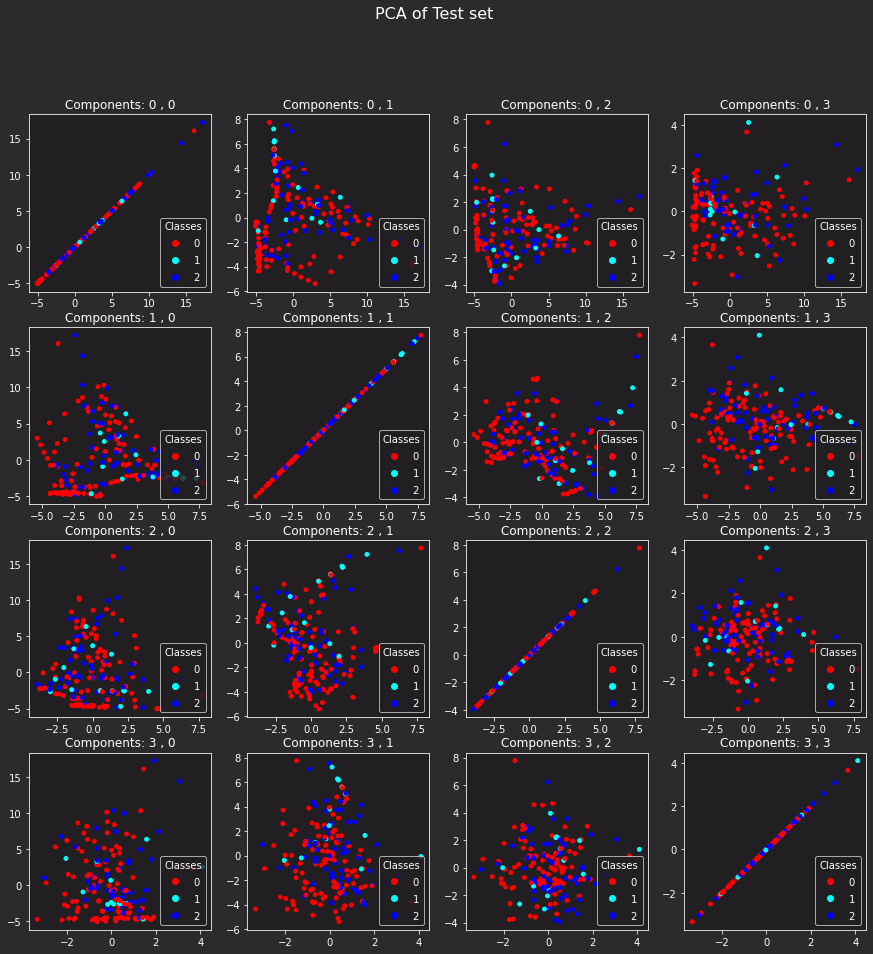

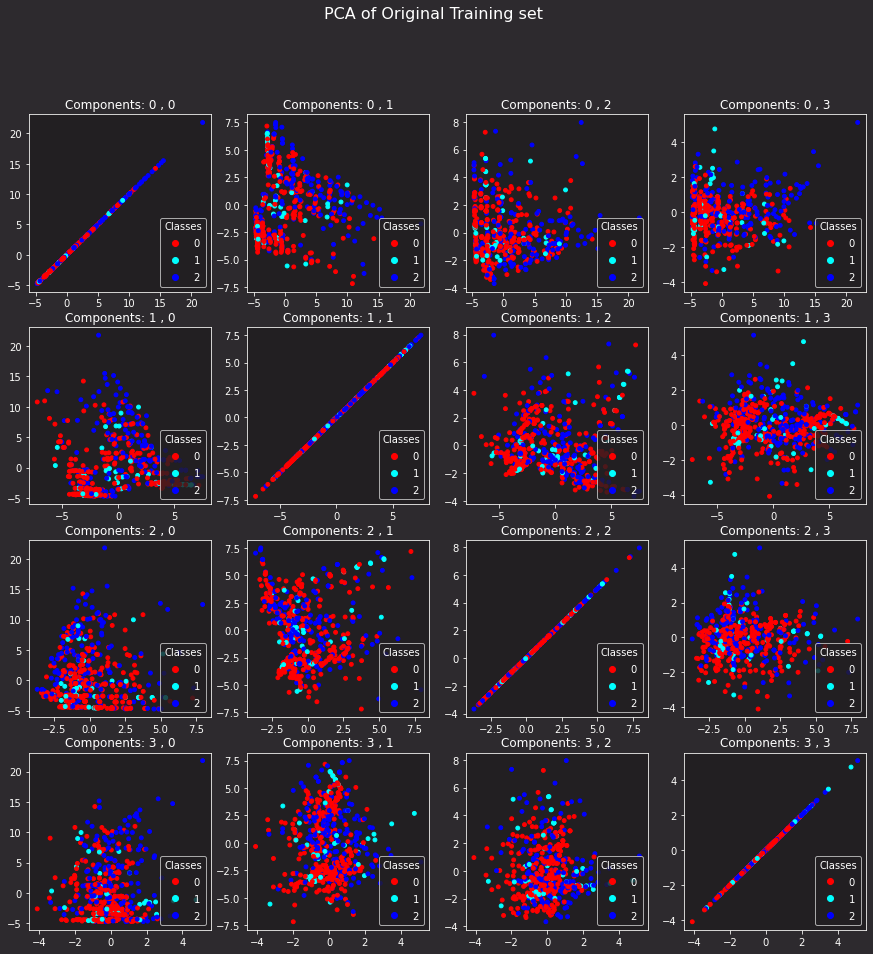

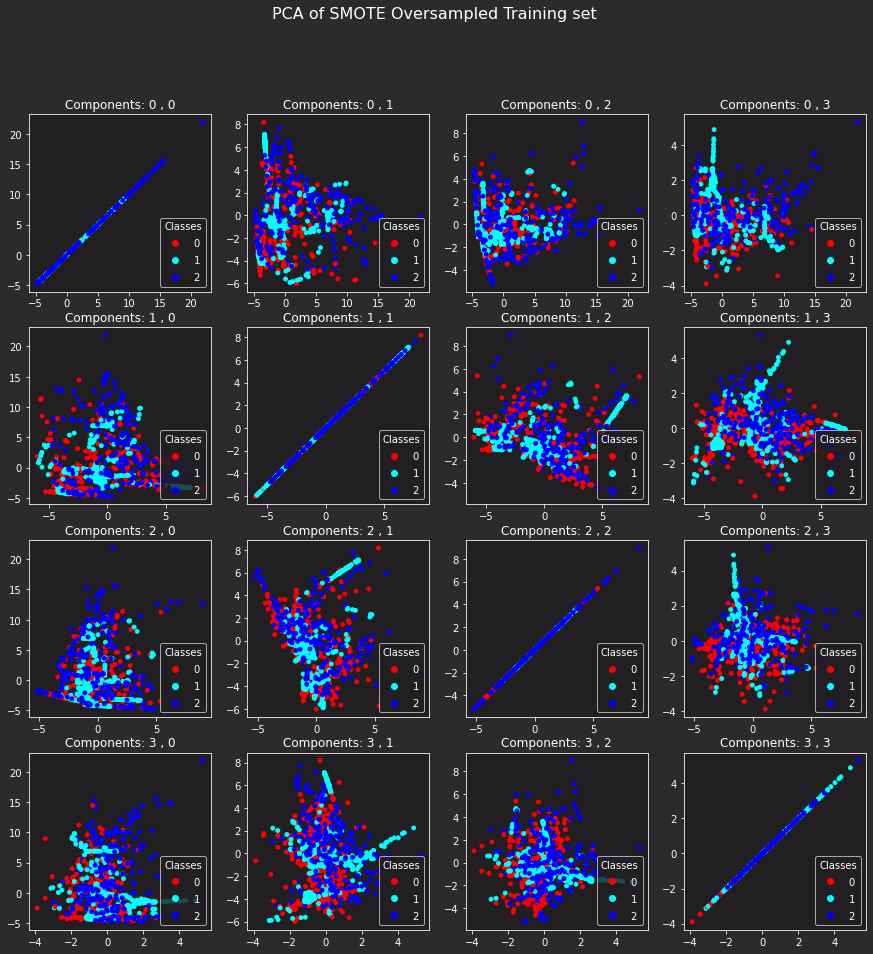

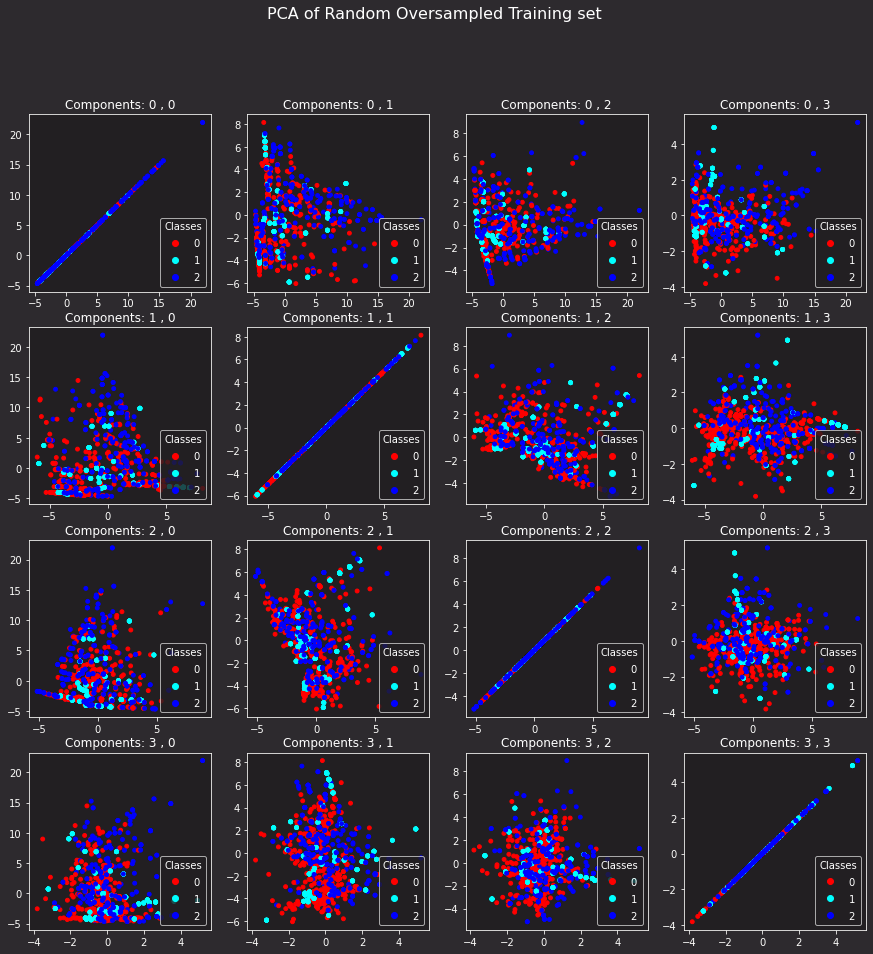

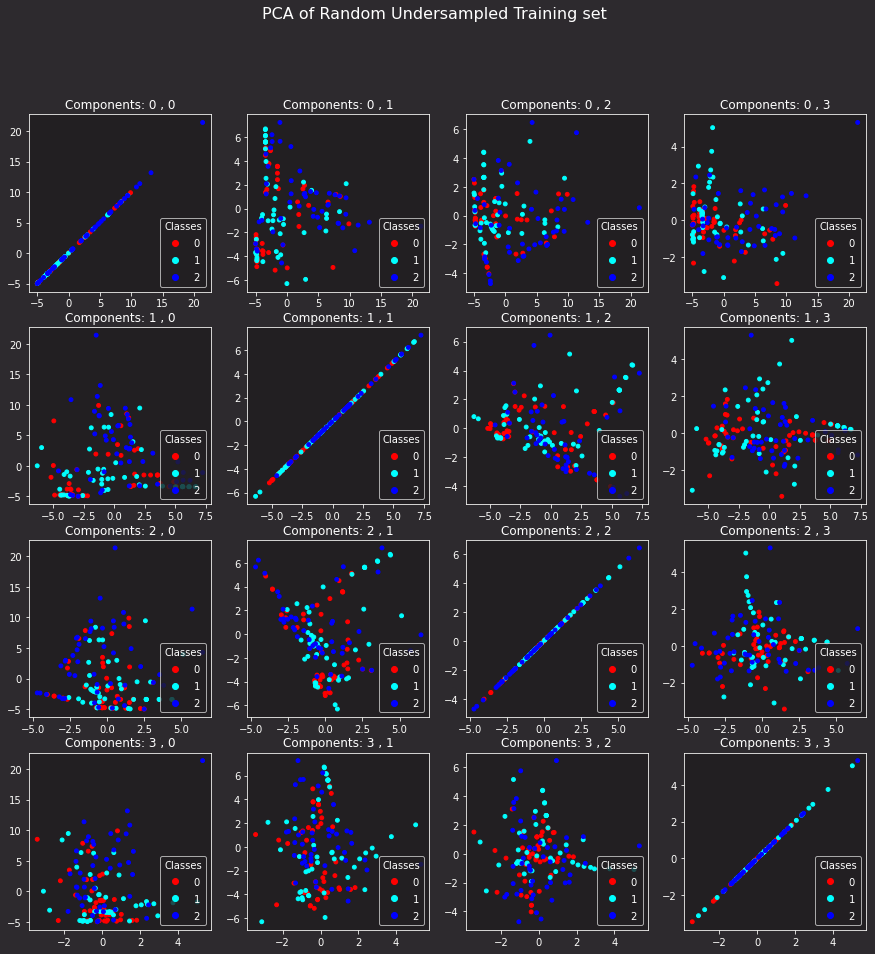

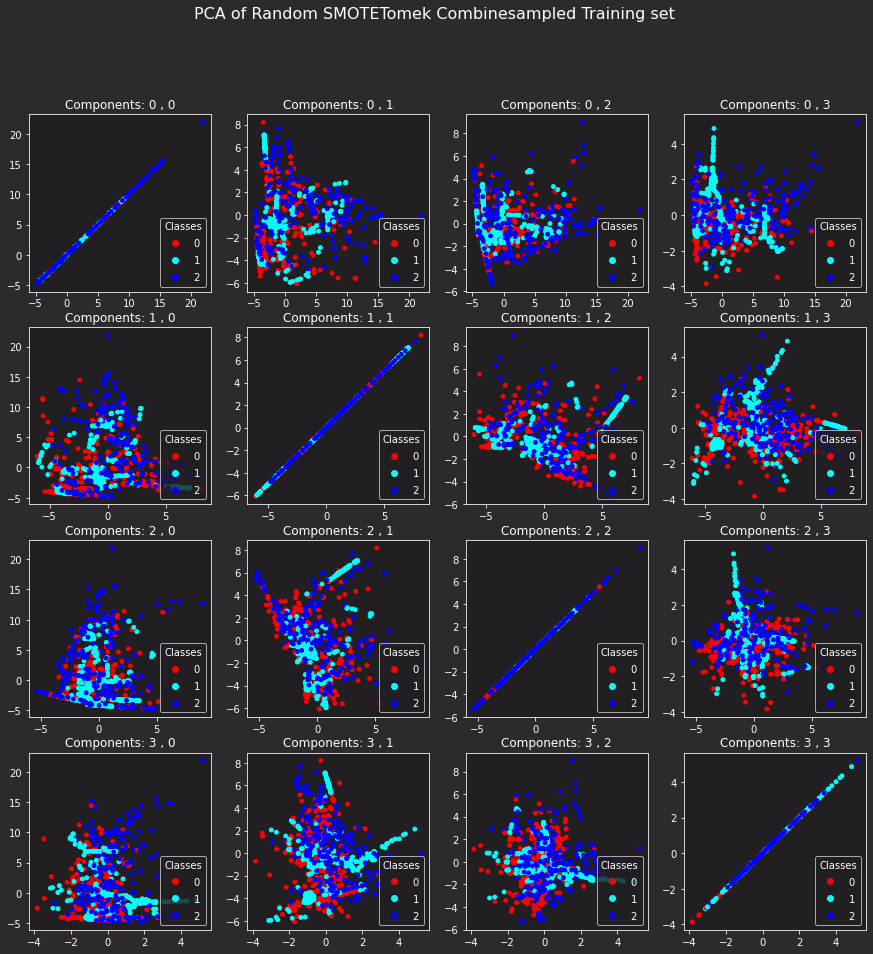

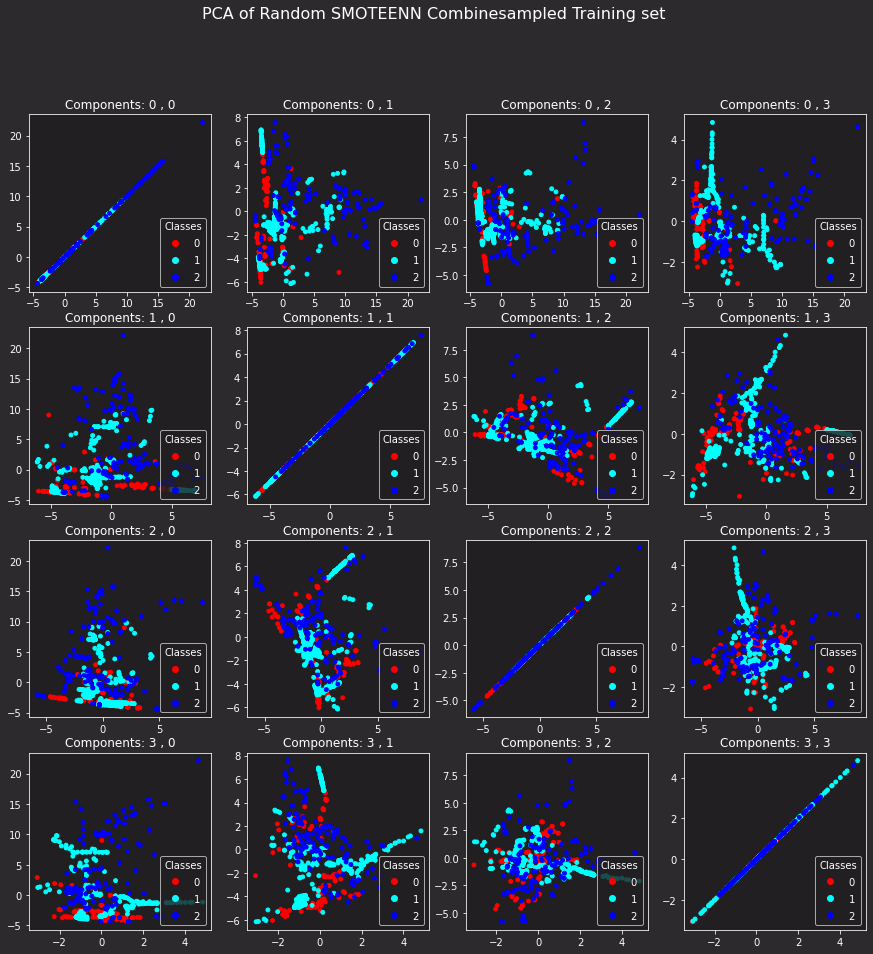

In [92]:
mpl.rcParams["figure.facecolor"] = "2D2A2E"
mpl.rcParams["axes.facecolor"] = "221F22"
mpl.rcParams["savefig.facecolor"] = "2D2A2E"
mpl.rcParams["text.color"] = "white"
mpl.rcParams["axes.edgecolor"] = "FCFCFA"
mpl.rcParams["xtick.color"] = "FCFCFA"
mpl.rcParams["ytick.color"] = "FCFCFA"
mpl.rcParams["axes.labelcolor"] = "FCFCFA"
mpl.rcParams["figure.titlesize"] = 16


def pca_component_plot(x, d, n_components, set_name):
    pca = PCA(n_components = n_components)
    components = pca.fit_transform(x)
    colors = ['red','cyan','blue']

    fig, axs = plt.subplots(n_components,n_components, figsize=(15,15))
    for i in range(n_components):
        for j in range(n_components):
            scatter = axs[i,j].scatter(components[:,i], components[:,j], s=15, c=np.argmax(d, axis=1), cmap=mpl.colors.ListedColormap(colors))
            axs[i,j].set_title("Components: " + str(i) + " , " + str(j))
            axs[i,j].legend(*scatter.legend_elements(),
                        loc="lower right", title="Classes")
    plt.suptitle("PCA of " + set_name)

pca_component_plot(x_tst, d_tst, 4, 'Test set')
pca_component_plot(x_trn_og, d_trn_og, 4, 'Original Training set')
pca_component_plot(x_trn_sm, d_trn_sm, 4, 'SMOTE Oversampled Training set')
pca_component_plot(x_trn_ros, d_trn_ros, 4, 'Random Oversampled Training set')
pca_component_plot(x_trn_rus, d_trn_rus, 4, 'Random Undersampled Training set')
pca_component_plot(x_trn_smt, d_trn_smt, 4, 'Random SMOTETomek Combinesampled Training set')
pca_component_plot(x_trn_sme, d_trn_sme, 4, 'Random SMOTEENN Combinesampled Training set')


##### PCA plots V2

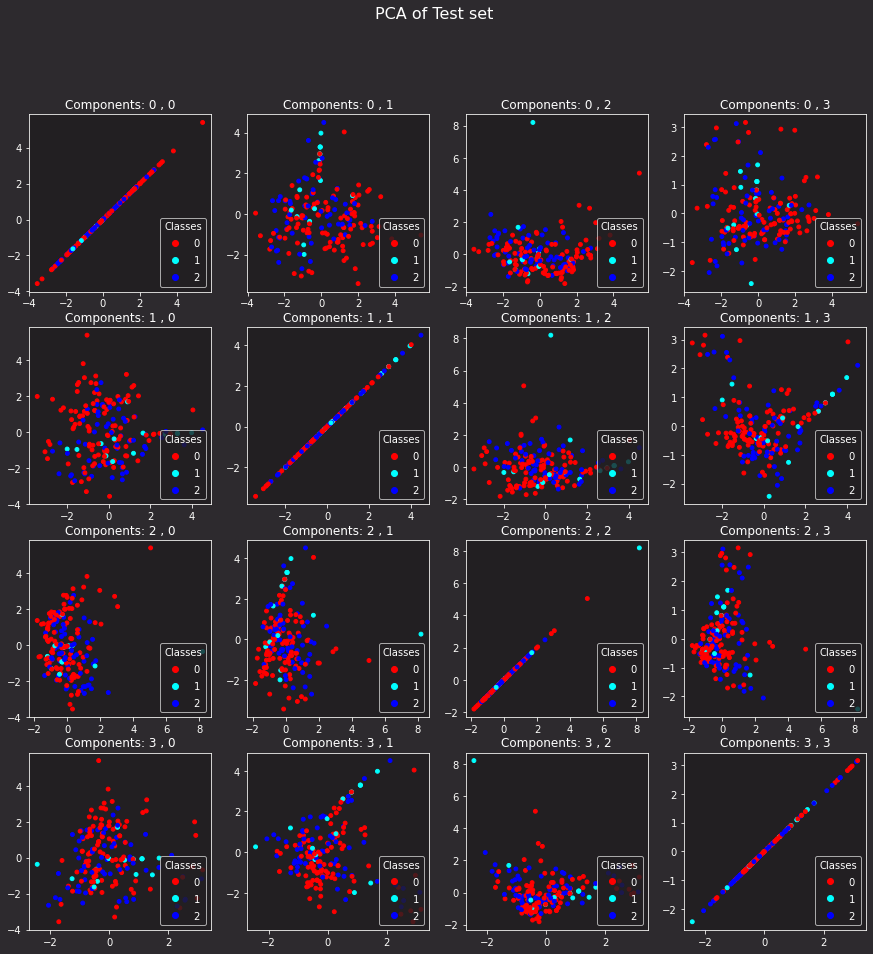

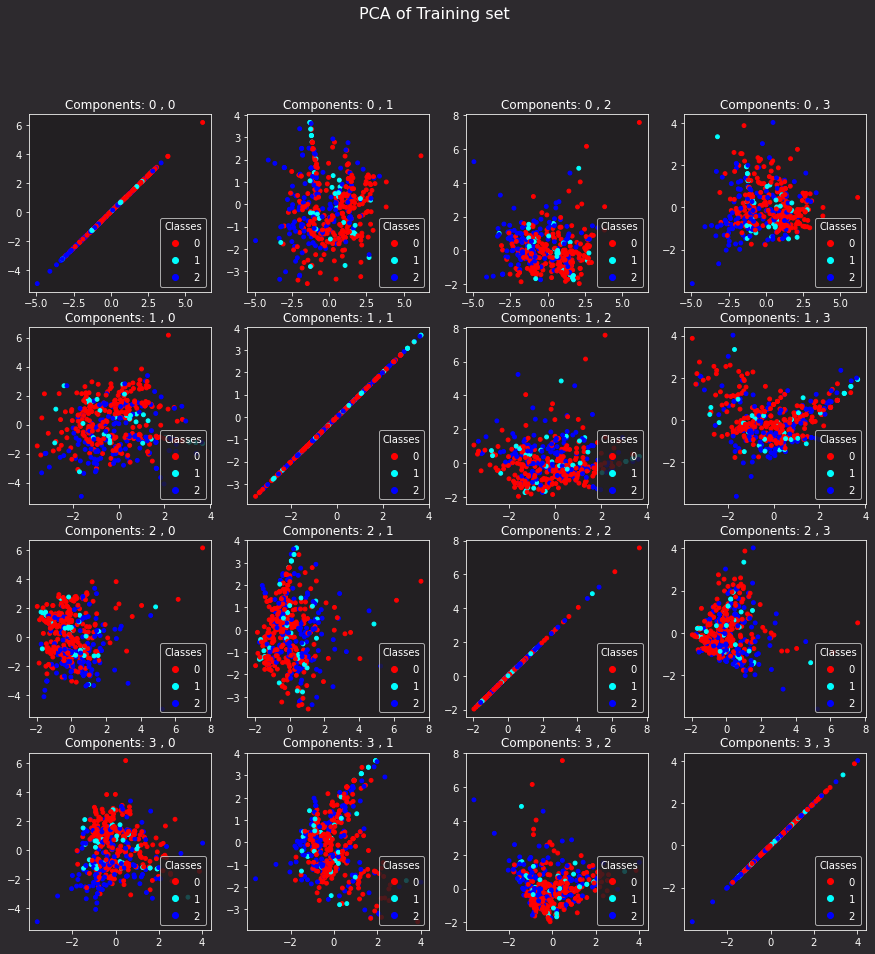

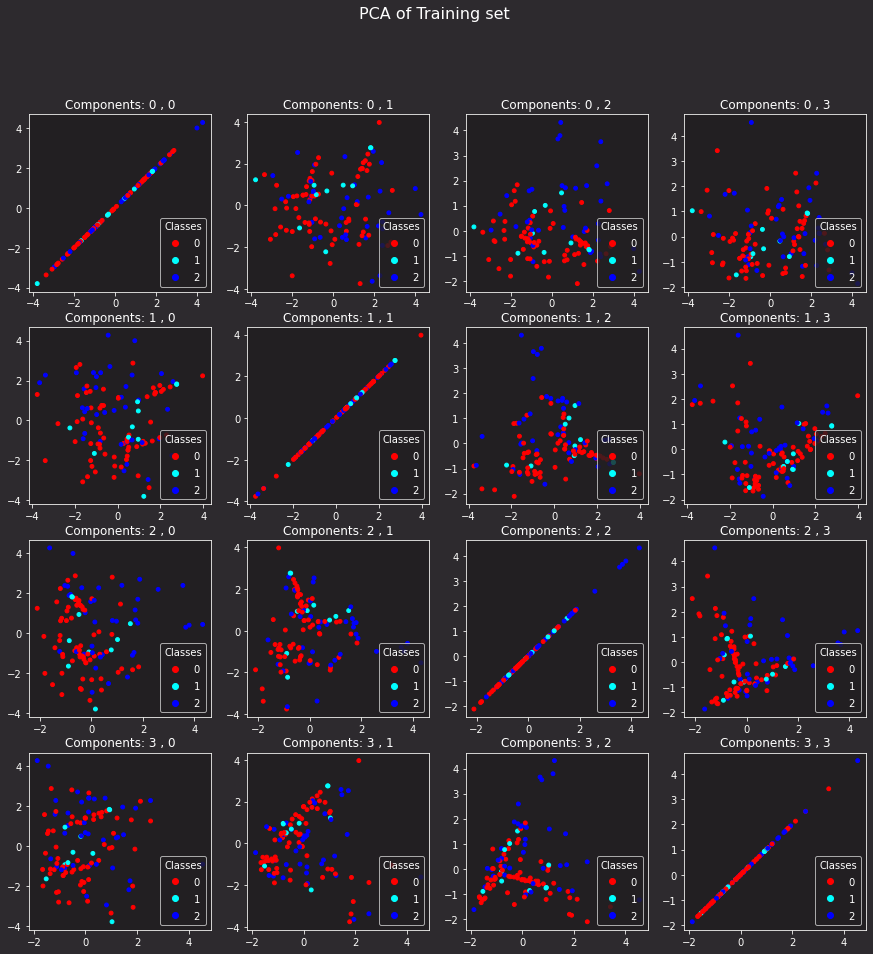

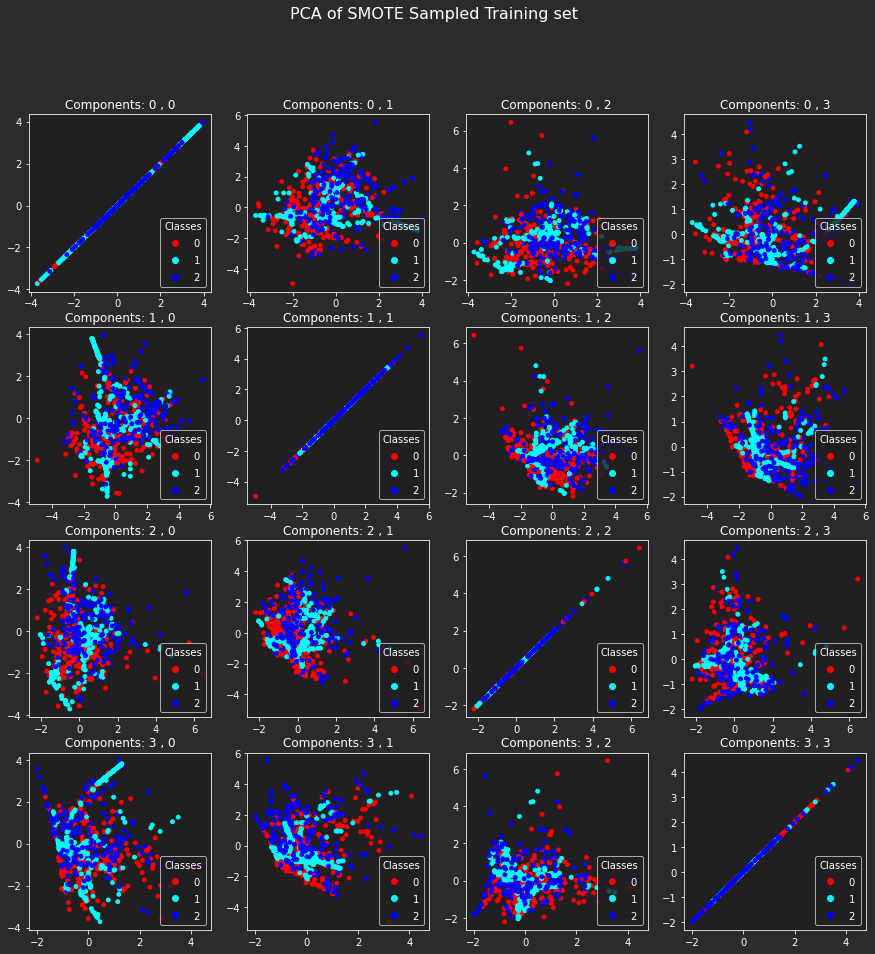

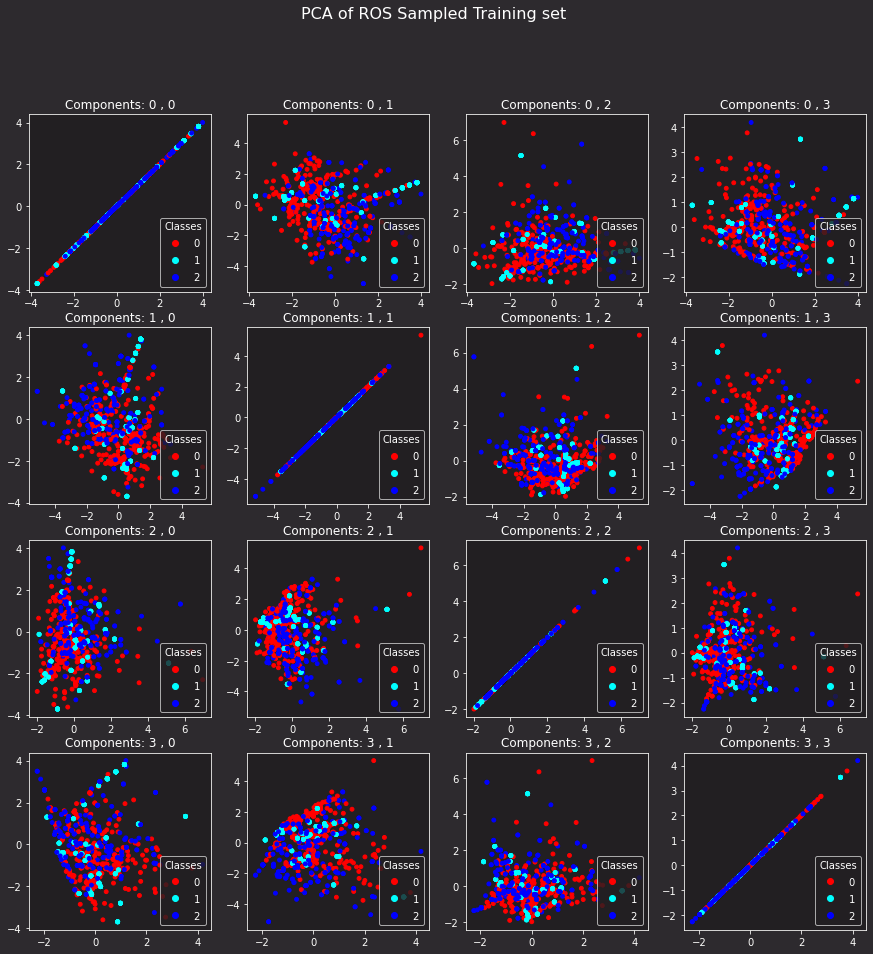

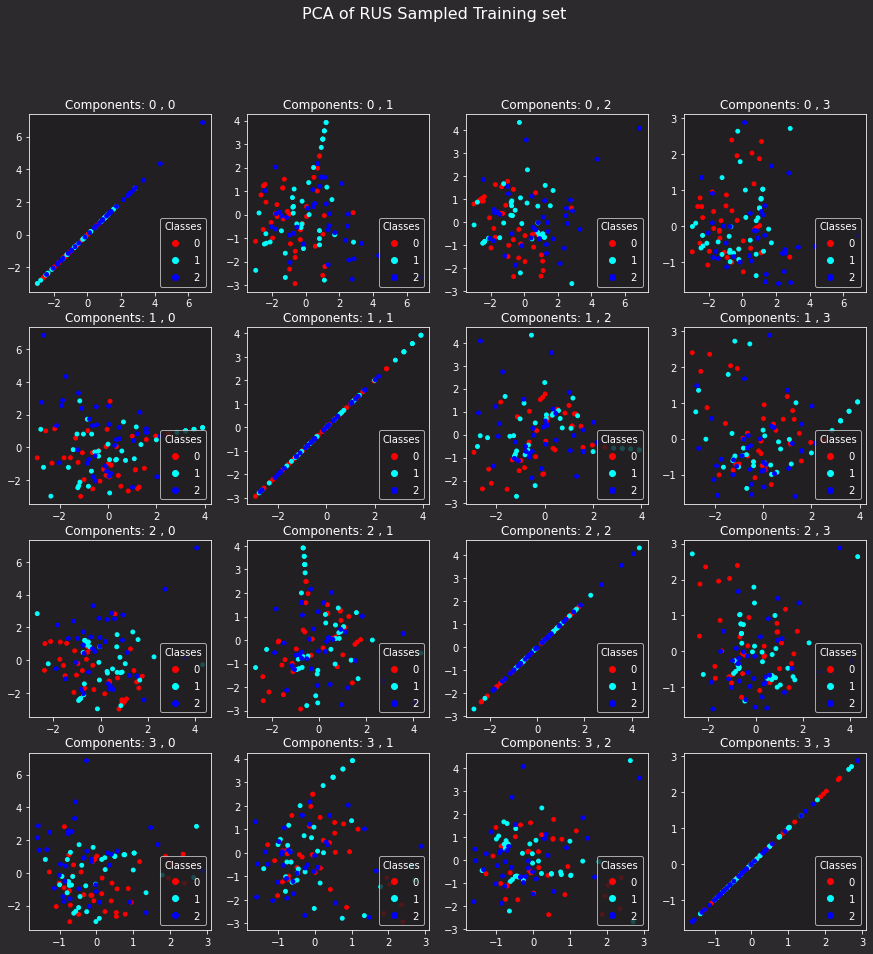

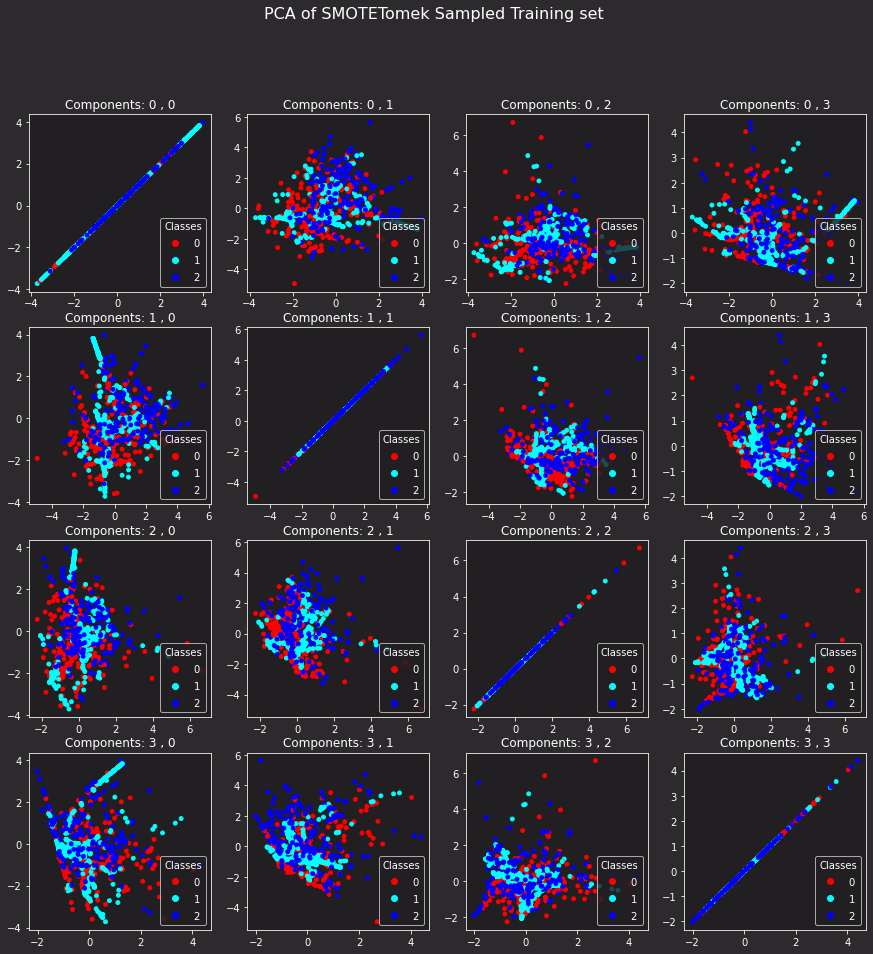

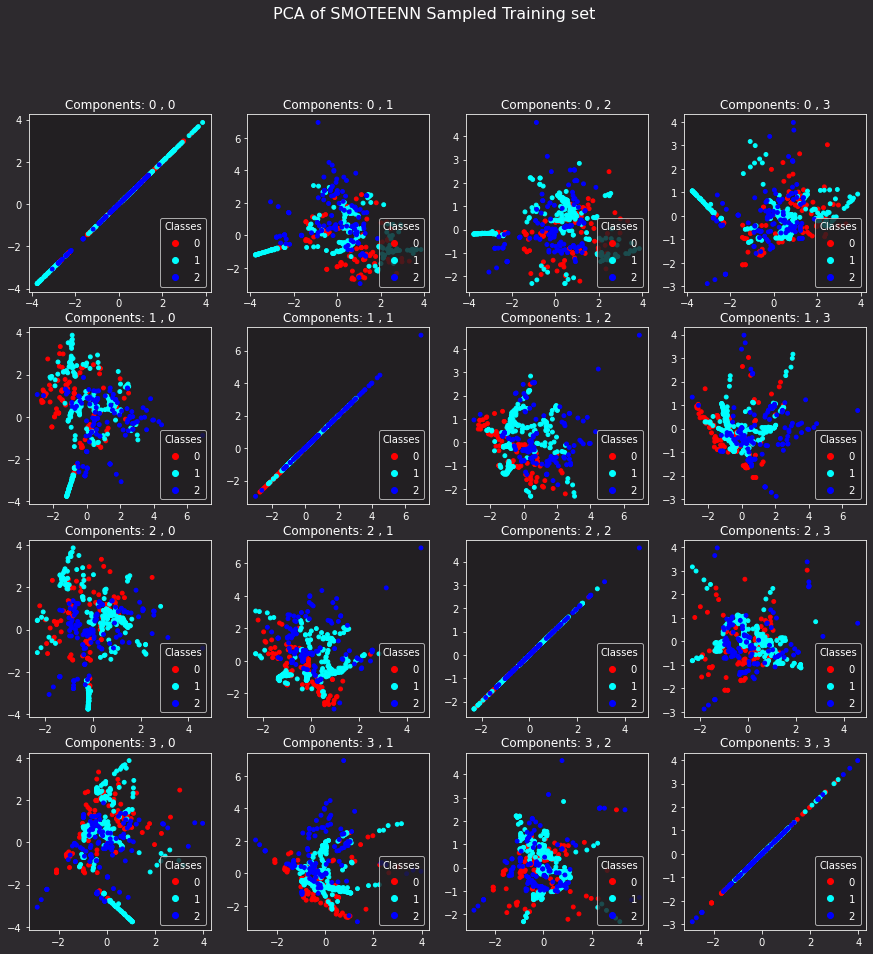

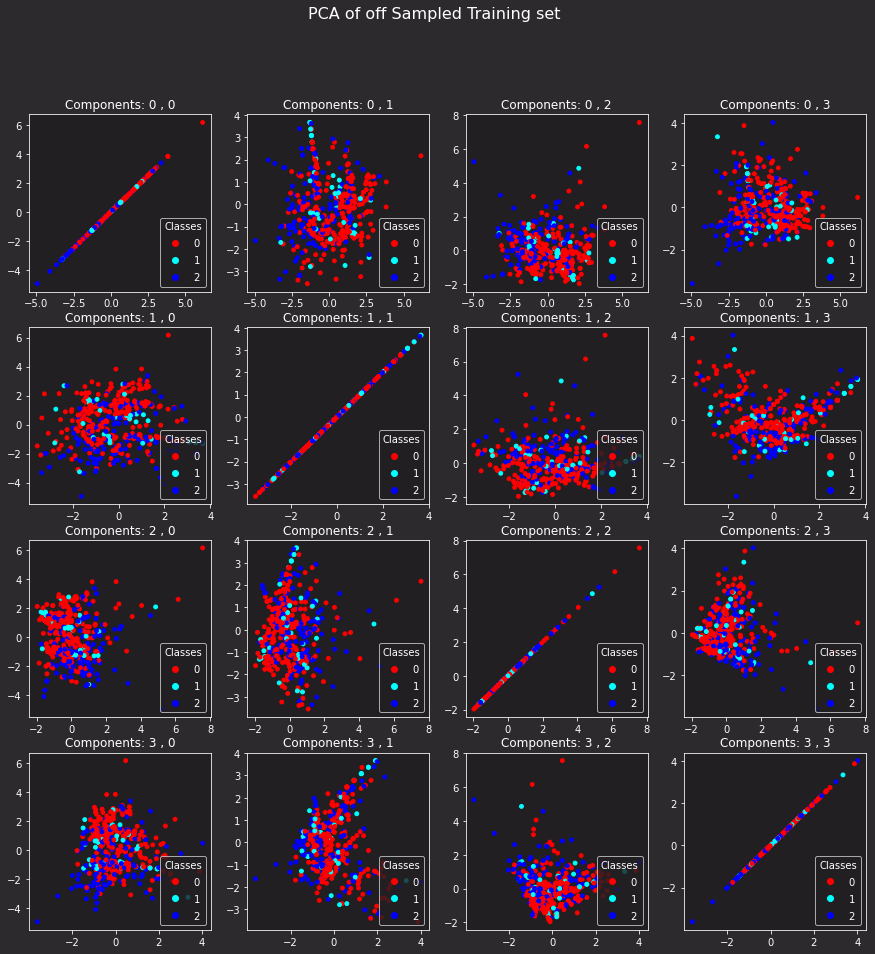

In [536]:
mpl.rcParams["figure.facecolor"] = "2D2A2E"
mpl.rcParams["axes.facecolor"] = "221F22"
mpl.rcParams["savefig.facecolor"] = "2D2A2E"
mpl.rcParams["text.color"] = "white"
mpl.rcParams["axes.edgecolor"] = "FCFCFA"
mpl.rcParams["xtick.color"] = "FCFCFA"
mpl.rcParams["ytick.color"] = "FCFCFA"
mpl.rcParams["axes.labelcolor"] = "FCFCFA"
mpl.rcParams["figure.titlesize"] = 16


def pca_component_plot(x, d, n_components, set_name):
    pca = PCA(n_components = n_components)
    components = pca.fit_transform(x)
    colors = ['red','cyan','blue']

    fig, axs = plt.subplots(n_components,n_components, figsize=(15,15))
    for i in range(n_components):
        for j in range(n_components):
            scatter = axs[i,j].scatter(components[:,i], components[:,j], s=15, c=np.argmax(d, axis=1), cmap=mpl.colors.ListedColormap(colors))
            axs[i,j].set_title("Components: " + str(i) + " , " + str(j))
            axs[i,j].legend(*scatter.legend_elements(),
                        loc="lower right", title="Classes")
    plt.suptitle("PCA of " + set_name)

pca_component_plot(x_tst, d_tst, 4, 'Test set')
pca_component_plot(x_trn, d_trn, 4, 'Training set')
pca_component_plot(x_val, d_val, 4, 'Training set')
sampling_methods = ["SMOTE", "ROS", "RUS", "SMOTETomek", "SMOTEENN", "off"]
for sampling_method in sampling_methods:
    pca_component_plot(x_trn_samplers[sampling_method], d_trn_samplers[sampling_method], 4, sampling_method +' Sampled Training set')


#### ---Models---

##### V1 Sampled first......

Model: "model_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_122 (Dense)           (None, 48)                480       
                                                                 
 dropout_62 (Dropout)        (None, 48)                0         
                                                                 
 dense_123 (Dense)           (None, 3)                 147       
                                                                 
Total params: 627
Trainable params: 627
Non-trainable params: 0
_________________________________________________________________
Model in training: SMOTE ....


100%|██████████| 10000/10000 [08:36<00:00, 19.35epoch/s, loss=0.528, accuracy=0.79, val_loss=0.572, val_accuracy=0.797]



=============================== SMOTE model ===============================



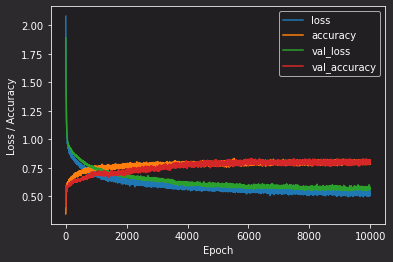

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.5224         0.3931         0.5271         14.1698        
accuracy:      0.7671         0.8490         0.7971         0.5897         


Model in training: ROS ....


100%|██████████| 10000/10000 [07:49<00:00, 21.32epoch/s, loss=0.542, accuracy=0.798, val_loss=0.791, val_accuracy=0.797]



================================ ROS model ================================



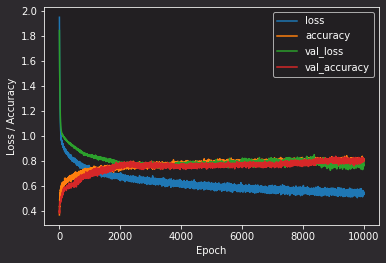

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.6009         0.3893         0.7402         31.7048        
accuracy:      0.7877         0.8732         0.7971         0.0821         


Model in training: RUS ....


100%|██████████| 10000/10000 [03:48<00:00, 43.79epoch/s, loss=0.451, accuracy=0.887, val_loss=1.94, val_accuracy=0.586]



================================ RUS model ================================



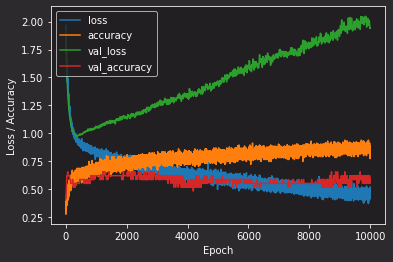

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      1.5587         0.2809         1.8550         31.7048        
accuracy:      0.6079         0.9478         0.5862         0.0821         


Model in training: SMOTETomek ....


100%|██████████| 10000/10000 [07:09<00:00, 23.28epoch/s, loss=0.457, accuracy=0.843, val_loss=0.576, val_accuracy=0.838]



============================ SMOTETomek model =============================



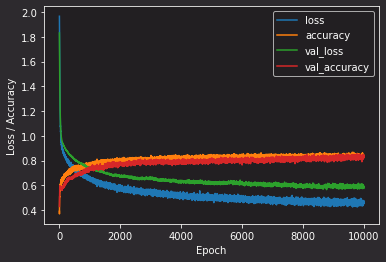

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.5524         0.3280         0.5318         14.1698        
accuracy:      0.7586         0.8704         0.8377         0.5897         


Model in training: SMOTEENN ....


100%|██████████| 10000/10000 [05:43<00:00, 29.15epoch/s, loss=0.16, accuracy=0.959, val_loss=0.23, val_accuracy=0.922] 



============================= SMOTEENN model ==============================



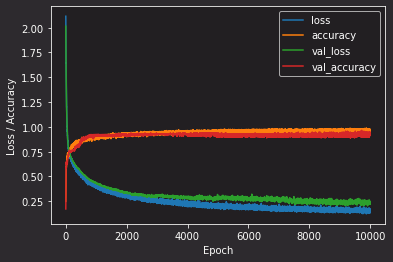

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      2.9819         0.0559         0.1856         18.7749        
accuracy:      0.6627         0.9935         0.9224         0.4564         


Model in training: off ....


100%|██████████| 10000/10000 [06:05<00:00, 27.37epoch/s, loss=0.558, accuracy=0.773, val_loss=1.07, val_accuracy=0.641]



================================ off model ================================



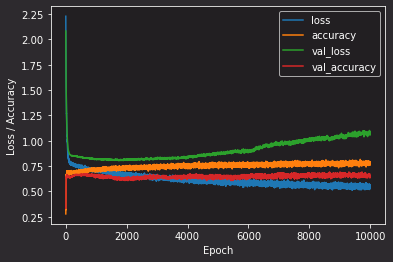

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.5706         0.4528         1.0408         27.0997        
accuracy:      0.7637         0.7944         0.6410         0.2154         


Wall time: 39min 14s


In [ ]:
%%time
# Pick sample method (SMOTE, ROS, RUS, SMOTETomek, SMOTEENN, off) and validation size
sampling_methods = ["SMOTE", "ROS", "RUS", "SMOTETomek", "SMOTEENN", "off"]
sampling_method = "ROS"
validation_size = 0.2

a = 2
nbr_nodes = int(x_trn_og.shape[0]/(a*(inp_dim-num_classes)))

INPUT = {'inp_dim': inp_dim,         
         'n_nod': [nbr_nodes],                  
         'drop_nod': 0.4,                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.001,            
         'metric': 'accuracy',              
         'lambd' : 0.05,             
         'num_out' : num_classes } 

# INPUT = {'inp_dim': inp_dim,         
        #  'n_nod': [nbr_nodes],                  
        #  'drop_nod': [0],                
        #  'act_fun': 'relu',             
        #  'out_act_fun': 'softmax',      
        #  'opt_method': 'Adam',         
        #  'cost_fun': 'categorical_crossentropy',           
        #  'lr_rate': 0.025,            
        #  'metric': 'accuracy',              
        #  'lambd' : 0.01,             
        #  'num_out' : num_classes }

first = True
for sampling_method in sampling_methods:
  # Split (un-/)sampled train data into train and validation 
  if sampling_method == "SMOTE":
    x_trn, x_val, d_trn, d_val = train_test_split(x_trn_sm, d_trn_sm, test_size=validation_size)
  elif sampling_method == "ROS":
    x_trn, x_val, d_trn, d_val = train_test_split(x_trn_ros, d_trn_ros, test_size=validation_size)
  elif sampling_method == "RUS":
    x_trn, x_val, d_trn, d_val = train_test_split(x_trn_rus, d_trn_rus, test_size=validation_size)
  elif sampling_method == "SMOTETomek":
    x_trn, x_val, d_trn, d_val = train_test_split(x_trn_smt, d_trn_smt, test_size=validation_size)
  elif sampling_method == "SMOTEENN":
    x_trn, x_val, d_trn, d_val = train_test_split(x_trn_sme, d_trn_sme, test_size=validation_size)
  elif sampling_method == "off":
    x_trn, x_val, d_trn, d_val = train_test_split(x_trn_og, d_trn_og, test_size=validation_size)

  # Normalize in relation to train set
  # mu, std = standard(x_trn)
  mu, std = standard(x_trn_og)
  x_trn_norm = (x_trn_og - mu)/std
  x_trn = (x_trn - mu)/std
  x_val = (x_val - mu)/std
  x_tst = (x_tst - mu)/std 

  model_samplers[sampling_method] = mlp(**INPUT)

  if first: 
    model_samplers[sampling_method].summary()
    first=False

  print("Model in training: " + sampling_method + ' ....')
  estimator_samplers[sampling_method] = model_samplers[sampling_method].fit(x_trn, d_trn,
                        epochs = 10000,     
                        validation_data=(x_val,d_val),
                        batch_size=128,   
                        callbacks=[TqdmCallback(verbose=1)],
                        # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
                        verbose = 0)

  sample_model_stats(sampling_method,
                      model_summary=False,
                      plot_learning=True,
                      stat_summary=True,
                      confusion=False)


##### V2 Split first!!

Model: "model_365"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_732 (Dense)           (None, 48)                480       
                                                                 
 dropout_367 (Dropout)       (None, 48)                0         
                                                                 
 dense_733 (Dense)           (None, 3)                 147       
                                                                 
Total params: 627
Trainable params: 627
Non-trainable params: 0
_________________________________________________________________
Model in training: SMOTE ....


100%|██████████| 5000/5000 [04:12<00:00, 19.79epoch/s, loss=0.552, accuracy=0.79, val_loss=0.606, val_accuracy=0.769] 



=============================== SMOTE model ===============================



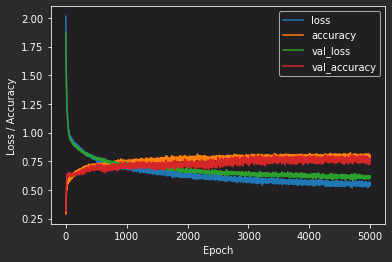

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6367         0.4173         0.5571         0.9221         
accuracy:      0.7537         0.8502         0.7692         0.5744         
weighted f1:   0.7557         0.8484         0.7724         0.5818         


Model in training: ROS ....


100%|██████████| 5000/5000 [04:12<00:00, 19.81epoch/s, loss=0.569, accuracy=0.798, val_loss=0.638, val_accuracy=0.744]



================================ ROS model ================================



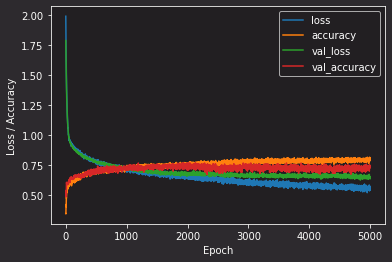

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6560         0.4324         0.5901         0.9489         
accuracy:      0.7559         0.8430         0.7436         0.5590         
weighted f1:   0.7587         0.8406         0.7461         0.5655         


Model in training: RUS ....


100%|██████████| 5000/5000 [02:19<00:00, 35.76epoch/s, loss=0.573, accuracy=0.781, val_loss=1.29, val_accuracy=0.607]



================================ RUS model ================================



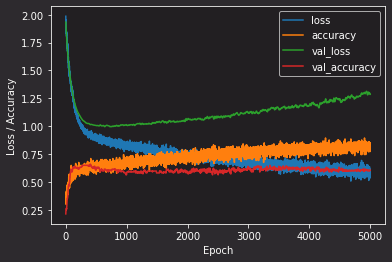

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      1.0352         0.4279         1.2047         1.3873         
accuracy:      0.5889         0.8772         0.6068         0.4821         
weighted f1:   0.6043         0.8774         0.6259         0.4987         


Model in training: SMOTETomek ....


100%|██████████| 5000/5000 [04:12<00:00, 19.83epoch/s, loss=0.541, accuracy=0.813, val_loss=0.624, val_accuracy=0.726]



============================ SMOTETomek model =============================



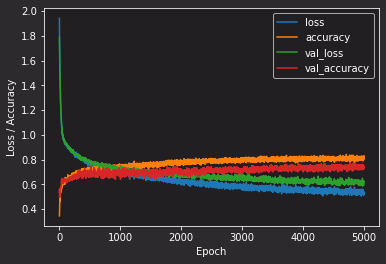

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6707         0.4040         0.5683         1.0217         
accuracy:      0.7409         0.8511         0.7265         0.5641         
weighted f1:   0.7461         0.8483         0.7309         0.5745         


Model in training: SMOTEENN ....


100%|██████████| 5000/5000 [03:18<00:00, 25.25epoch/s, loss=0.222, accuracy=0.943, val_loss=1.4, val_accuracy=0.658] 



============================= SMOTEENN model ==============================



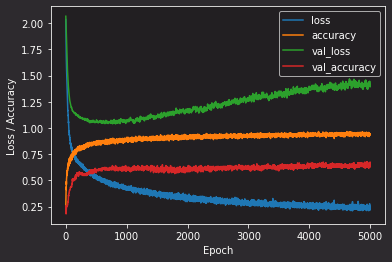

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      1.7104         0.1109         1.3443         2.1849         
accuracy:      0.6831         0.9811         0.6581         0.5385         
weighted f1:   0.6965         0.9810         0.6677         0.5617         


Model in training: off ....


100%|██████████| 5000/5000 [03:13<00:00, 25.87epoch/s, loss=0.603, accuracy=0.758, val_loss=0.597, val_accuracy=0.786]



================================ off model ================================



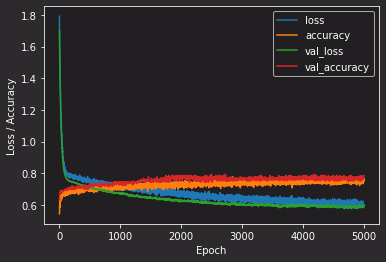

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.5906         0.5268         0.5636         0.8174         
accuracy:      0.7645         0.7794         0.7863         0.6667         
weighted f1:   0.7471         0.7624         0.7748         0.6428         


Model in training: SMOTE ....


100%|██████████| 5000/5000 [03:15<00:00, 25.58epoch/s, loss=0.586, accuracy=0.78, val_loss=0.653, val_accuracy=0.735] 



=============================== SMOTE model ===============================



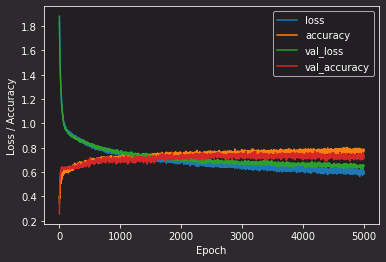

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6460         0.4745         0.6029         0.8955         
accuracy:      0.7559         0.8225         0.7350         0.5897         
weighted f1:   0.7588         0.8205         0.7379         0.5975         


Model in training: ROS ....


100%|██████████| 5000/5000 [03:15<00:00, 25.64epoch/s, loss=0.568, accuracy=0.807, val_loss=0.645, val_accuracy=0.761]



================================ ROS model ================================



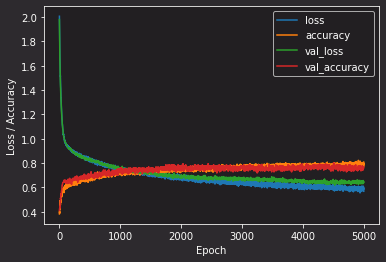

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6666         0.4625         0.5942         0.9315         
accuracy:      0.7559         0.8454         0.7607         0.5487         
weighted f1:   0.7584         0.8428         0.7625         0.5602         


Model in training: RUS ....


100%|██████████| 5000/5000 [02:17<00:00, 36.49epoch/s, loss=0.617, accuracy=0.798, val_loss=1.17, val_accuracy=0.632] 



================================ RUS model ================================



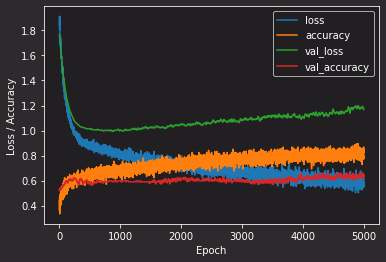

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      1.0243         0.4246         1.0958         1.3419         
accuracy:      0.5867         0.8596         0.6325         0.4667         
weighted f1:   0.6013         0.8604         0.6521         0.4859         


Model in training: SMOTETomek ....


100%|██████████| 5000/5000 [03:16<00:00, 25.46epoch/s, loss=0.578, accuracy=0.8, val_loss=0.658, val_accuracy=0.726]  



============================ SMOTETomek model =============================



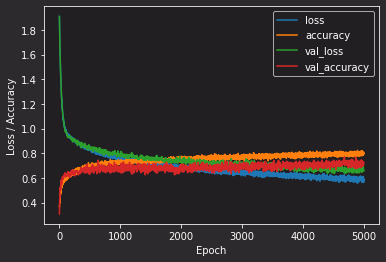

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6638         0.4518         0.5959         0.9525         
accuracy:      0.7323         0.8448         0.7265         0.5692         
weighted f1:   0.7357         0.8423         0.7281         0.5794         


Model in training: SMOTEENN ....


100%|██████████| 5000/5000 [02:37<00:00, 31.71epoch/s, loss=0.255, accuracy=0.933, val_loss=1.24, val_accuracy=0.624]



============================= SMOTEENN model ==============================



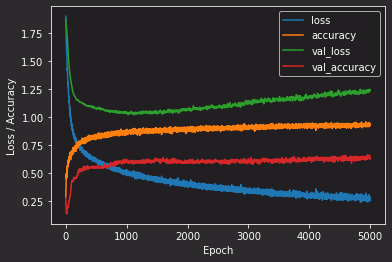

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      1.3876         0.1477         1.1776         1.8591         
accuracy:      0.6745         0.9664         0.6239         0.5385         
weighted f1:   0.6903         0.9664         0.6404         0.5606         


Model in training: off ....


100%|██████████| 5000/5000 [02:37<00:00, 31.82epoch/s, loss=0.632, accuracy=0.764, val_loss=0.594, val_accuracy=0.761]



================================ off model ================================



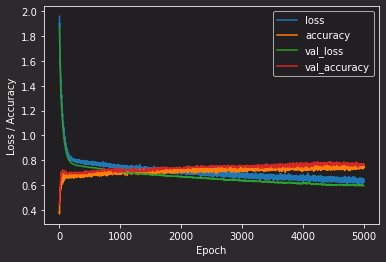

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6030         0.5656         0.5620         0.7936         
accuracy:      0.7623         0.7709         0.7607         0.6615         
weighted f1:   0.7471         0.7544         0.7501         0.6438         


Model in training: SMOTE ....


100%|██████████| 5000/5000 [02:37<00:00, 31.72epoch/s, loss=0.618, accuracy=0.771, val_loss=0.654, val_accuracy=0.744]



=============================== SMOTE model ===============================



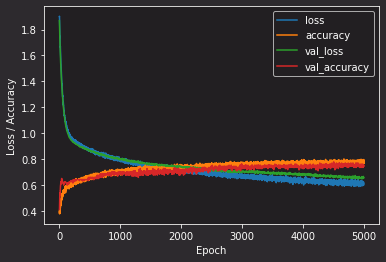

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6446         0.4911         0.6027         0.8921         
accuracy:      0.7537         0.8200         0.7436         0.6000         
weighted f1:   0.7566         0.8176         0.7460         0.6073         


Model in training: ROS ....


100%|██████████| 5000/5000 [02:37<00:00, 31.75epoch/s, loss=0.622, accuracy=0.764, val_loss=0.668, val_accuracy=0.709]



================================ ROS model ================================



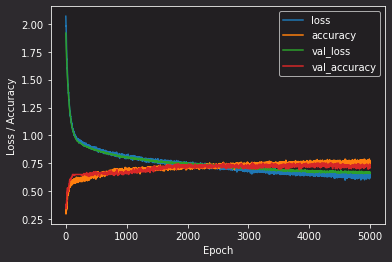

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6718         0.5186         0.6212         0.8883         
accuracy:      0.7109         0.8116         0.7094         0.5641         
weighted f1:   0.7165         0.8093         0.7096         0.5729         


Model in training: RUS ....


100%|██████████| 5000/5000 [02:13<00:00, 37.43epoch/s, loss=0.537, accuracy=0.833, val_loss=1.24, val_accuracy=0.607]



================================ RUS model ================================



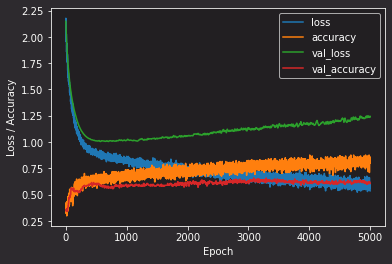

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      1.0722         0.4418         1.1710         1.4107         
accuracy:      0.5889         0.8772         0.6068         0.4667         
weighted f1:   0.6082         0.8774         0.6259         0.4901         


Model in training: SMOTETomek ....


100%|██████████| 5000/5000 [02:27<00:00, 33.86epoch/s, loss=0.591, accuracy=0.796, val_loss=0.655, val_accuracy=0.752]



============================ SMOTETomek model =============================



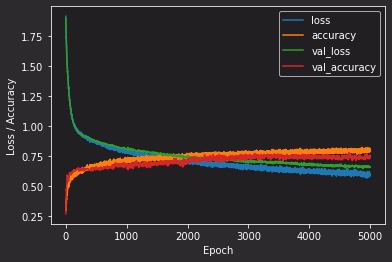

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6638         0.4705         0.6015         0.9096         
accuracy:      0.7495         0.8435         0.7521         0.5692         
weighted f1:   0.7538         0.8413         0.7533         0.5797         


Model in training: SMOTEENN ....


100%|██████████| 5000/5000 [02:17<00:00, 36.49epoch/s, loss=0.344, accuracy=0.905, val_loss=1.23, val_accuracy=0.581]



============================= SMOTEENN model ==============================



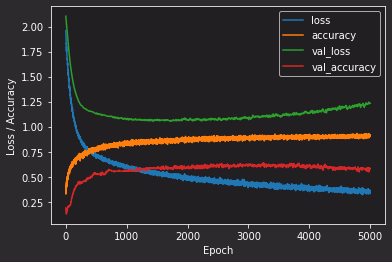

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      1.2747         0.2083         1.1580         1.6262         
accuracy:      0.6467         0.9370         0.5812         0.5179         
weighted f1:   0.6684         0.9370         0.6044         0.5462         


Model in training: off ....


100%|██████████| 5000/5000 [01:57<00:00, 42.39epoch/s, loss=0.667, accuracy=0.73, val_loss=0.62, val_accuracy=0.786]  



================================ off model ================================



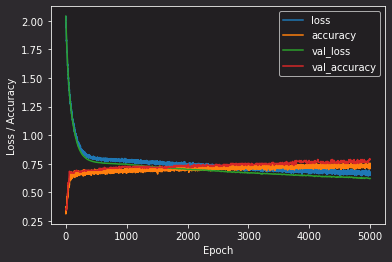

===============================Stat summary================================

               Org train      Samp train     Val            Test           
log_loss:      0.6361         0.6052         0.5886         0.7917         
accuracy:      0.7281         0.7473         0.7863         0.6615         
weighted f1:   0.7072         0.7268         0.7748         0.6385         


Wall time: 53min 5s


In [542]:
%%time
# Pick sample method (SMOTE, ROS, RUS, SMOTETomek, SMOTEENN, off) and validation size
sampling_methods = ["SMOTE", "ROS", "RUS", "SMOTETomek", "SMOTEENN", "off"]
sampling_method = "ROS"
# validation_size = 0.2 # SEE SETUP V2

a = 2
nbr_nodes = int(x_trn_og.shape[0]/(a*(inp_dim-num_classes)))

INPUT = {'inp_dim': inp_dim,         
         'n_nod': [nbr_nodes],                  
         'drop_nod': 0.4,                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.001,            
         'metric': 'accuracy',              
         'lambd' : 0.05,             
         'num_out' : num_classes } 

# INPUT = {'inp_dim': inp_dim,         
        #  'n_nod': [nbr_nodes],                  
        #  'drop_nod': [0],                
        #  'act_fun': 'relu',             
        #  'out_act_fun': 'softmax',      
        #  'opt_method': 'Adam',         
        #  'cost_fun': 'categorical_crossentropy',           
        #  'lr_rate': 0.025,            
        #  'metric': 'accuracy',              
        #  'lambd' : 0.01,             
        #  'num_out' : num_classes }

first = True
for bs in [128, 256, 512]:
  for sampling_method in sampling_methods:

    model_samplers[sampling_method] = mlp(**INPUT)

    if first: 
      model_samplers[sampling_method].summary()
      first=False

    print("Model in training: " + sampling_method + ' ....')
    estimator_samplers[sampling_method] = model_samplers[sampling_method].fit(
                          x_trn_samplers[sampling_method], d_trn_samplers[sampling_method],
                          epochs = 5000,     
                          validation_data=(x_val,d_val),
                          # batch_size=128,   
                          batch_size=bs,   
                          callbacks=[TqdmCallback(verbose=1)],
                          # callbacks=[PlotLearning(update_freq=250, clear_print=False)],
                          verbose = 0)

    sample_model_stats(sampling_method,
                        model_summary=False,
                        plot_learning=True,
                        stat_summary=True,
                        confusion=False)


#### Stats

##### SMOTE


=============================== SMOTE model ===============================



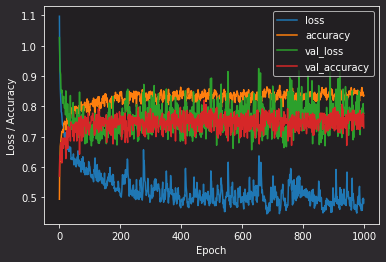

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.5901         0.6213         0.4652         14.1698        
accuracy:      0.7397         0.7238         0.8034         0.5897         




([0.5900575294943433,
  0.6213424659294187,
  0.4651938795666848,
  14.169754419571314],
 [0.7397260273972602,
  0.7237687366167024,
  0.8034188034188035,
  0.5897435897435898])

In [221]:
sample_model_stats("SMOTE",
                    model_summary=False,
                    plot_learning=True,
                    stat_summary=True,
                    confusion=False)

##### ROS

ROS model


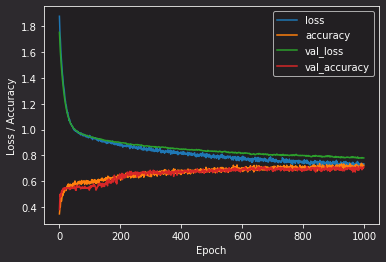

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.7171         0.7230         0.6935         18.7749        
accuracy:      0.6918         0.6809         0.7350         0.4564         




In [193]:
sample_model_stats("ROS",
                    model_summary=False,
                    plot_learning=True,
                    stat_summary=True,
                    confusion=False)

##### RUS

RUS model


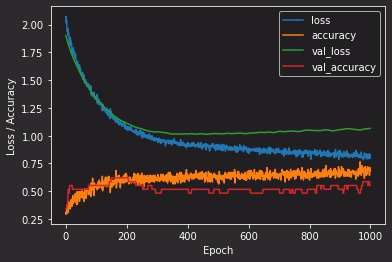

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.9322         0.9276         0.9506         29.9336        
accuracy:      0.6010         0.5953         0.6239         0.1333         




In [194]:
sample_model_stats("RUS",
                    model_summary=False,
                    plot_learning=True,
                    stat_summary=True,
                    confusion=False)

##### SMOTETomek

SMOTETomek model


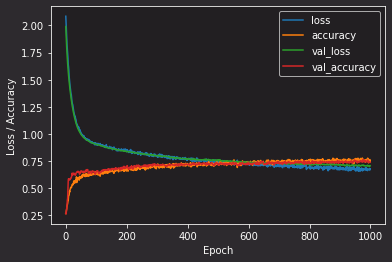

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.7249         0.7301         0.7041         14.1698        
accuracy:      0.6866         0.6702         0.7521         0.5897         




In [195]:
sample_model_stats("SMOTETomek",
                    model_summary=False,
                    plot_learning=True,
                    stat_summary=True,
                    confusion=False)

##### SMOTEENN

SMOTEENN model


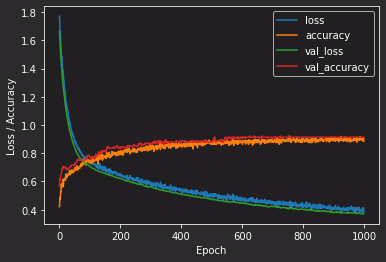

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      1.3666         1.3914         1.2677         29.9336        
accuracy:      0.5925         0.5739         0.6667         0.1333         




In [196]:
sample_model_stats("SMOTEENN",
                    model_summary=False,
                    plot_learning=True,
                    stat_summary=True,
                    confusion=False)

##### No sample

off model


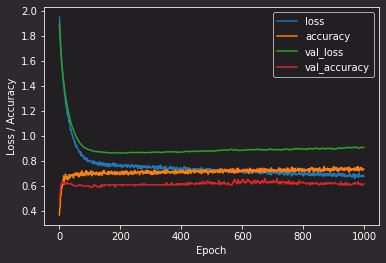

===============================Stat summary================================

               Org train      Samp train     Samp val       Test           
log_loss:      0.6770         0.6274         0.8750         27.0997        
accuracy:      0.7192         0.7452         0.6154         0.2154         




In [197]:
sample_model_stats("off",
                    model_summary=False,
                    plot_learning=True,
                    stat_summary=True,
                    confusion=False)

### Old models Question 9

#### New Old

In [188]:
%%time

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None

# Load Bioconcentration training and test data
x_trn, d_trn, x_tst, d_tst = bcf()
num_classes = d_tst.shape[1]
inp_dim = x_trn.shape[1]

# Split train set into train and validation
x_trn, x_val, d_trn, d_val = train_test_split(x_trn, d_trn, test_size=0.1)

# Normalize in relation to train set
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_val = (x_val - mu)/std
x_tst = (x_tst - mu)/std

a = 2
# YOUR CODE HERE

INPUT = {'inp_dim': inp_dim,         
         'n_nod': [x_trn.shape[0]/(a*(inp_dim-num_classes))],                  
         'drop_nod': [0],                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.025,            
         'metric': 'accuracy',              
         'lambd' : 0.01,             
         'num_out' : num_classes }  


model_bcf = mlp(**INPUT)

model_bcf.summary()

estimator_bcf = model_bcf.fit(x_trn, d_trn,
                      epochs = 1000,     
                      validation_data=(x_val,d_val),
                      batch_size=32,   
                      callbacks=[TqdmCallback(verbose=1)],       
                      verbose = 0)


Model: "model_110"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 9)]               0         
                                                                 
 dense_230 (Dense)           (None, 43)                430       
                                                                 
 dropout_119 (Dropout)       (None, 43)                0         
                                                                 
 dense_231 (Dense)           (None, 3)                 132       
                                                                 
Total params: 562
Trainable params: 562
Non-trainable params: 0
_________________________________________________________________


100%|██████████| 1000/1000 [01:20<00:00, 12.37epoch/s, loss=0.718, accuracy=0.699, val_loss=0.752, val_accuracy=0.797]

Wall time: 1min 20s


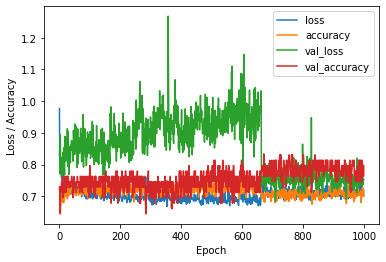


 ########## Result for Training data ########## 

log_loss:    0.6629
accuracy:    0.7238 

              precision    recall  f1-score   support

     class 1       0.72      0.89      0.80       304
     class 2       1.00      0.14      0.25        42
     class 3       0.72      0.57      0.64       179

    accuracy                           0.72       525
   macro avg       0.81      0.54      0.56       525
weighted avg       0.74      0.72      0.70       525



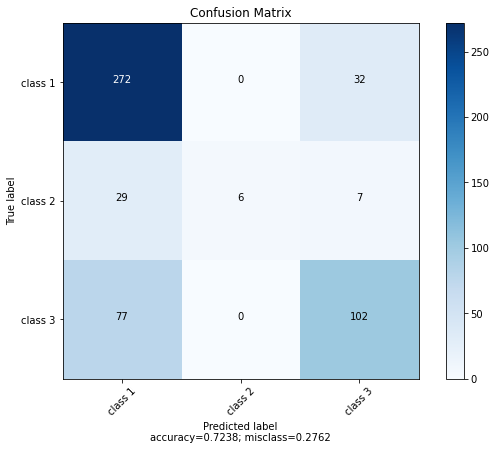


 ########## Result for Validation data ########## 

log_loss:    0.7211
accuracy:    0.7966 

              precision    recall  f1-score   support

     class 1       0.83      0.93      0.87        41
     class 2       0.50      0.17      0.25         6
     class 3       0.73      0.67      0.70        12

    accuracy                           0.80        59
   macro avg       0.68      0.59      0.61        59
weighted avg       0.77      0.80      0.77        59



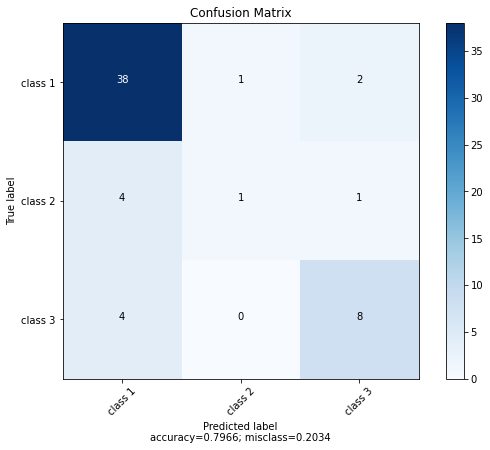


 ########## Result for Test data ########## 

log_loss:    0.8484
accuracy:    0.6154 

              precision    recall  f1-score   support

     class 1       0.65      0.80      0.72       115
     class 2       0.00      0.00      0.00        16
     class 3       0.52      0.44      0.47        64

    accuracy                           0.62       195
   macro avg       0.39      0.41      0.40       195
weighted avg       0.55      0.62      0.58       195



C:\Users\Nils\anaconda3\envs\tf.gpu\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Nils\anaconda3\envs\tf.gpu\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Nils\anaconda3\envs\tf.gpu\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


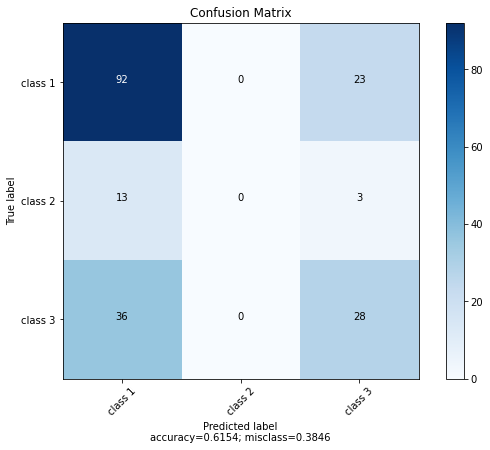

In [191]:

# Plot the learning curves
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('Epoch')
for k in estimator_bcf.history.keys():
    plt.plot(estimator_bcf.history[k], label = k) 
plt.legend()
plt.show()

# plot the confusion matrix
make_cm_plot(model_bcf, x_trn, d_trn, num_classes, 'Training data')
make_cm_plot(model_bcf, x_val, d_val, num_classes, 'Validation data')
make_cm_plot(model_bcf, x_tst, d_tst, num_classes, 'Test data')

#### Old KFold 

In [183]:

# from imblearn.over_sampling import SMOTE

# seed = 0 means random, seed > 0 means fixed
seed = 1
np.random.seed(seed) if seed else None

# Load Bioconcentration training and test data
x_trn, d_trn, x_tst, d_tst = bcf()
num_classes = d_tst.shape[1]
inp_dim = x_trn.shape[1]

mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std
x_tst = (x_tst - mu)/std
# YOUR CODE HERE

d_tst.shape
x_trn.shape[1]

x_trn, x_val, d_trn, d_val = train_test_split(x_trn, d_trn, test_size=0.1) 

INPUT = {'inp_dim': inp_dim,         
         'n_nod': [inp_dim-num_classes],                  
         'drop_nod': [0],                
         'act_fun': 'relu',             
         'out_act_fun': 'softmax',      
         'opt_method': 'Adam',         
         'cost_fun': 'categorical_crossentropy',           
         'lr_rate': 0.025,            
         'metric': 'accuracy',              
         'lambd' : 0.01,             
         'num_out' : num_classes }    

# # Get the model
    # model = mlp(**INPUT)

    # # Print a summary of the model
    # model.summary()

    # callbacks = [
    #     keras.callbacks.ModelCheckpoint(
    #         filepath="q9_model.keras",
    #         save_best_only=True,
    #         monitor="accuracy")
    # ]
        
    # # Train the model
    # history = model.fit(x_trn, d_trn,
    #                       epochs = 50,                     
    #                       validation_data=(x_val,d_val),
    #                       batch_size=50,
    #                       callbacks=[TqdmCallback(verbose=1), callbacks],                    
    #                       verbose = 0)

    # test_model = keras.models.load_model("q9_model.keras")



# Merge inputs and targets
inputs = np.concatenate((x_trn, x_val), axis=0)
targets = np.concatenate((d_trn, d_val), axis=0)

# Score containers for folds
acc_per_fold = []
loss_per_fold = []

# Fold parameters
batch_size = 50
nbr_epochs = 50
verbosity = 0
nbr_folds = 10

# k_callbacks = 

kfold = KFold(n_splits=nbr_folds, shuffle=True)
# K-fold Cross Validation model evaluation
fold_n = 1
for train, test in kfold.split(inputs, targets):

    k_model = mlp(**INPUT)

    # Fit data to model
    history = k_model.fit(inputs[train], targets[train],
                batch_size=batch_size,
                epochs=nbr_epochs,
                callbacks=[TqdmCallback(verbose=1), k_callbacks], 
                verbose=verbosity)

    # Generate generalization metrics
    scores = k_model.evaluate(inputs[test], targets[test], verbose=0)
    print(f'Score for fold {fold_n}: {k_model.metrics_names[0]} of {scores[0]}; {k_model.metrics_names[1]} of {scores[1]*100}%')
    acc_per_fold.append(scores[1] * 100)
    loss_per_fold.append(scores[0])

    # Increase fold number
    fold_n = fold_n + 1


# == Provide average scores ==
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - Accuracy: {acc_per_fold[i]}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)} (+- {np.std(acc_per_fold)})')
print(f'> Loss: {np.mean(loss_per_fold)}')
print('------------------------------------------------------------------------')




# # Get the model
# model = mlp(**INPUT)

# # Print a summary of the model
# model.summary()

# # Train the model
# history = model.fit(x_trn, d_trn,
#                       epochs = 500,     
#                       validation_data=(x_val,d_val),
#                       batch_size=100,   
#                     #   callbacks=[TqdmCallback(verbose=1), callbacks],        
#                       verbose = 0)




# # plot the confusion matrix
# make_cm_plot(test_model, x_trn, d_trn, num_classes, 'Training data')
# make_cm_plot(test_model, x_val, d_val, num_classes, 'Validation data')
# make_cm_plot(test_model, x_tst, d_tst, num_classes, 'Test data')

0epoch [00:00, ?epoch/s]


NameError: name 'k_callbacks' is not defined

### CellName: Ex5 (#12)
### CellType: Exercise
### Cell instruction: Instruction for question 10

For this exercise the task is to train a binary classifier for the spiral problem. The aim is to get *zero* classification error for the training data (there is no test or validation data) with as small as possible model, in terms of the number of trainable weights. Also plot the boundary to see if it resembles a spriral. To pass this question you should at least try! The data is randomly generated and I suggest at least 1000 data points to get "good" spirals.

#### Question 10
**Train a classifier for the spiral problem with the aim of zero classification error with as small as possible model. Report the model you used.**

##### Old

In [11]:
def spiral_mlp(inp_dim,
            n_nod,
            drop_nod,
            act_fun = 'relu',
            out_act_fun = 'sigmoid',
            opt_method = 'Adam',
            cost_fun = 'binary_crossentropy',
            lr_rate = 0.01, 
            metric = 'accuracy',
            lambd = 0.0, 
            num_out = None):
    
    lays = [inp_dim] + n_nod
    
    main_input = Input(shape=(inp_dim,), dtype='float32', name='main_input')
    
    X = main_input
    for i, nod in enumerate(n_nod):
        X = Dense(nod, 
                  activation = act_fun,
                  kernel_regularizer=regularizers.l2(lambd))(X)
        if type(drop_nod) is list: 
            X = Dropout(drop_nod[i])(X)
        else: 
            X = Dropout(drop_nod)(X)
        
    output = Dense(num_out, activation = out_act_fun )(X)
    
    method = getattr(optimizers, opt_method)
    
    model =  Model(inputs=[main_input], outputs=[output])
    model.compile(optimizer = method(lr = lr_rate),
                  loss = cost_fun,
                  metrics=[metric])       
    
    return model

In [12]:
from tensorflow.keras.models import Sequential
mymlp = Sequential()
mymlp.add(Dense(12, input_dim=2, activation='tanh'))
mymlp.add(Dense(12, input_dim=2, activation='tanh'))
mymlp.add(Dense(1, activation='sigmoid'))

mymlp.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

mymlp.summary()

# mymlp.fit(x_trn, d_trn, epochs=2000, batch_size=100,  callbacks = TqdmCallback(verbose=1),verbose=0)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12)                36        
                                                                 
 dense_1 (Dense)             (None, 12)                156       
                                                                 
 dense_2 (Dense)             (None, 1)                 13        
                                                                 
Total params: 205
Trainable params: 205
Non-trainable params: 0
_________________________________________________________________


In [13]:
X_test, y_test = x_trn, d_trn

yy = np.round(mymlp.predict(X_test).T[0])

plt.subplot(1,2,1)
plt.title('Actual')
plt.plot(x_trn[d_trn==0,0], x_trn[d_trn==0,1], '.')
plt.plot(x_trn[d_trn==1,0], x_trn[d_trn==1,1], '.')
plt.subplot(1,2,2)
plt.title('Prediction')
plt.plot(X_test[yy==0,0], X_test[yy==0,1], '.')
plt.plot(X_test[yy==1,0], X_test[yy==1,1], '.')
plt.show()

NameError: name 'x_trn' is not defined

C:\Users\nilsb\anaconda3\envs\tf.gpu\lib\site-packages\keras\optimizer_v2\rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_101 (Dense)           (None, 12)                36        
                                                                 
 dropout_66 (Dropout)        (None, 12)                0         
                                                                 
 dense_102 (Dense)           (None, 12)                156       
                                                                 
 dropout_67 (Dropout)        (None, 12)                0         
                                                                 
 dense_103 (Dense)           (None, 1)                 13        
                                                                 
Total params: 205
Trainable params: 205
Non-trainable para

100%|██████████| 3000/3000 [13:03<00:00,  3.83epoch/s, loss=1.04, accuracy=0.498] 



 ########## STATISTICS for Training Data ########## 

Accuracy        0.5000
Sensitivity     1.0000
Specificity     0.0000
Loss            0.7527

 ##################################################


C:\Users\nilsb\AppData\Local\Temp/ipykernel_18120/5010088.py:26: UserWarning: No contour levels were found within the data range.
  plt.contour(xx, yy, Z, cmap=plt.cm.Paired)


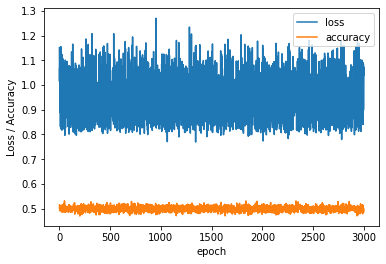

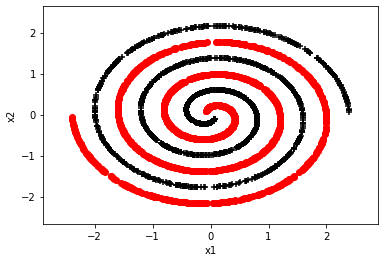

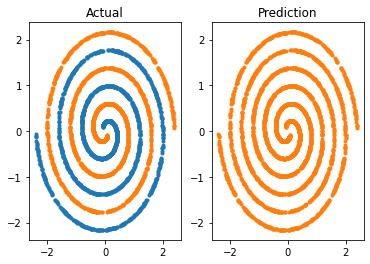

Wall time: 13min 9s


In [214]:
%%time
# seed = 0 means random, seed > 0 means fixed
seed = 1
np.random.seed(seed) if seed else None
    
# Generate training data
x_trn, d_trn = twospirals(1500, 3, 0)

mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std

# asdf = np.append(x_trn,x_trn**2,axis=1)
# asdf = np.append(asdf,np.array([x_trn[:,0]*x_trn[:,1]]).T,axis=1)
# asdf

# mu, std = standard(asdf)
# asdf = (asdf - mu)/std
# asdf

# x_trn = asdf

INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [12, 12],                  
         'drop_nod': 0,                
         'act_fun': 'tanh',             
         'out_act_fun': 'sigmoid',      
         'opt_method': 'RMSprop',         
         'cost_fun': 'binary_crossentropy',           
         'lr_rate': 0.2,            
         'metric': 'accuracy',              
         'lambd' : 0.1,             
         'num_out' : 1 }                 

# Get the model
model_ex6 = mlp(**INPUT)

# Print a summary of the model
model_ex6.summary()

# Train the model
estimator_ex6 = model_ex6.fit(x_trn, d_trn,
                      epochs = 3000,                
                      batch_size=100,
                      callbacks=[TqdmCallback(verbose=1)],                   
                      verbose = 0)

# Call the stats function to print out statistics for the training
stats_class(x_trn, d_trn, 'Training', model_ex6)

# Training history
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('epoch')
for k in estimator_ex6.history.keys():
    plt.plot(estimator_ex6.history[k], label = k) 
plt.legend(loc='best')

# Show the decision boundary
decision_b(x_trn, d_trn, model_ex6)

yy = np.round(model_ex6.predict(x_trn).T[0])

plt.subplot(1,2,1)
plt.title('Actual')
plt.plot(x_trn[d_trn==0,0], x_trn[d_trn==0,1], '.')
plt.plot(x_trn[d_trn==1,0], x_trn[d_trn==1,1], '.')
plt.subplot(1,2,2)
plt.title('Prediction')
plt.plot(x_trn[yy==0,0], x_trn[yy==0,1], '.')
plt.plot(x_trn[yy==1,0], x_trn[yy==1,1], '.')
plt.show()


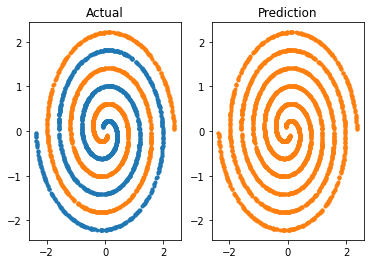

In [192]:
yy = np.round(model_ex6.predict(x_trn).T[0])

plt.subplot(1,2,1)
plt.title('Actual')
plt.plot(x_trn[d_trn==0,0], x_trn[d_trn==0,1], '.')
plt.plot(x_trn[d_trn==1,0], x_trn[d_trn==1,1], '.')
plt.subplot(1,2,2)
plt.title('Prediction')
plt.plot(x_trn[yy==0,0], x_trn[yy==0,1], '.')
plt.plot(x_trn[yy==1,0], x_trn[yy==1,1], '.')
plt.show()

In [210]:
pred_lol = [1 if i[0]>0.5 else 0 for i in model_ex6.predict(x_trn)]

class Model_test():
    def __init__(self, model):
        self.model = model
    def predict(data, data2):
        return  np.round(model_ex6.predict(data, data2).T[0])

model_test = Model_test(model_ex6)
model_test.predict(x_trn)

# np.round(model_ex6.predict(x_trn).T[0])

ValueError: Failed to find data adapter that can handle input: <class '__main__.Model_test'>, <class 'NoneType'>

ValueError: y must be an integer array. Found float64. Try passing the array as y.astype(np.int_)

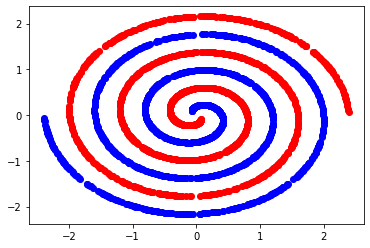

In [196]:
from mlxtend.plotting import plot_decision_regions
plt.figure()
plt.scatter(x_trn[:, 0][d_trn==1], x_trn[:, 1][d_trn==1], marker='o', c='r')
plt.scatter(x_trn[:, 0][d_trn==0], x_trn[:, 1][d_trn==0], marker='o', c='b')
plot_decision_regions(x_trn, d_trn, clf=mymlp, legend=2)

###### Feature engineering test

In [17]:
%%time

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None
    
# Generate training data
x_trn, d_trn = twospirals(1500, 3, 0)

# x_trn[]

Wall time: 0 ns


array([ 1.56610255, 14.16097551])

In [14]:
mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std

INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [10, 10, 10, 10, 4],                  
         'drop_nod': 0.4,                
         'act_fun': 'relu',             
         'out_act_fun': 'sigmoid',      
         'opt_method': 'Adam',         
         'cost_fun': 'binary_crossentropy',           
         'lr_rate': 0.025,            
         'metric': 'accuracy',              
         'lambd' : 0.01,             
         'num_out' : 1 }                 

# Get the model
model_ex6 = mlp(**INPUT)

# Print a summary of the model
model_ex6.summary()

# Train the model
estimator_ex6 = model_ex6.fit(x_trn, d_trn,
                      epochs = 200,                
                      batch_size=100,
                      callbacks=[TqdmCallback(verbose=1)],                   
                      verbose = 0)

# Call the stats function to print out statistics for the training
stats_class(x_trn, d_trn, 'Training', model_ex6)

# Training history
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('epoch')
for k in estimator_ex6.history.keys():
    plt.plot(estimator_ex6.history[k], label = k) 
plt.legend(loc='best')

# Show the decision boundary
decision_b(x_trn, d_trn, model_ex6)

NameError: name 'x_trn' is not defined

##### V2

In [15]:
def mlp_spiral_test(inp_dim,
            n_nod,
            drop_nod,
            act_fun = 'relu',
            out_act_fun = 'sigmoid',
            opt_method = 'Adam',
            cost_fun = 'binary_crossentropy',
            lr_rate = 0.01, 
            metric = 'accuracy',
            lambd = 0.0, 
            num_out = None):
    
    lays = [inp_dim] + n_nod
    
    main_input = Input(shape=(inp_dim,), dtype='float32', name='main_input')
    
    X = main_input
    for i, nod in enumerate(n_nod):
        X = Dense(nod, 
                  # activation = act_fun)(X)
                  activation = act_fun,
                  kernel_regularizer=regularizers.l2(lambd))(X)
        # if type(drop_nod) is list: 
        #     X = Dropout(drop_nod[i])(X)
        # else: 
        #     X = Dropout(drop_nod)(X)
        
    output = Dense(num_out, activation = out_act_fun )(X)
    
    method = getattr(optimizers, opt_method)
    
    model =  Model(inputs=[main_input], outputs=[output])
    model.compile(optimizer = method(lr = lr_rate),
                  loss = cost_fun,
                  metrics=[metric])       
    
    return model

In [184]:
%%time

# seed = 0 means random, seed > 0 means fixed
seed = 0
np.random.seed(seed) if seed else None
    
# Generate training data
x_trn, d_trn = twospirals(1500, 3, 0)

mu, std = standard(x_trn)
x_trn = (x_trn - mu)/std

INPUT = {'inp_dim': x_trn.shape[1],         
         'n_nod': [8, 8],              
         'drop_nod': 0.0,                 
         'act_fun': 'tanh',                 
         'out_act_fun': 'sigmoid',          
        #  'opt_method': 'RMSprop',             
         'opt_method': 'Adam',     
         'cost_fun': 'binary_crossentropy', 
         'lr_rate': 0.0005,                 
         'num_out' : 1 }                                   


# Get the model
model_ex6 = mlp(**INPUT)

# Print a summary of the model
model_ex6.summary()

# Train the model
estimator_ex6 = model_ex6.fit(x_trn, d_trn,
                      epochs =50000,                
                      batch_size=3000,
                      # callbacks=[TqdmCallback(verbose=1)], 
                      verbose = 0)

Model: "model_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 main_input (InputLayer)     [(None, 2)]               0         
                                                                 
 dense_302 (Dense)           (None, 8)                 24        
                                                                 
 dropout_226 (Dropout)       (None, 8)                 0         
                                                                 
 dense_303 (Dense)           (None, 8)                 72        
                                                                 
 dropout_227 (Dropout)       (None, 8)                 0         
                                                                 
 dense_304 (Dense)           (None, 1)                 9         
                                                                 
Total params: 105
Trainable params: 105
Non-trainable para


 ########## STATISTICS for Training Data ########## 

Accuracy        1.0000
Sensitivity     1.0000
Specificity     1.0000
Loss            0.0008

 ##################################################


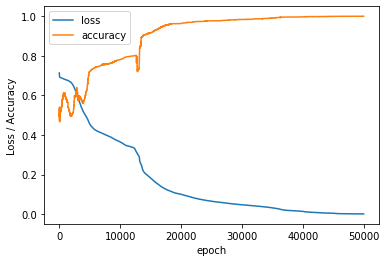

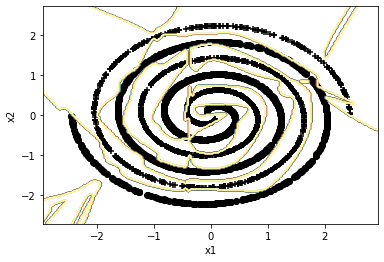

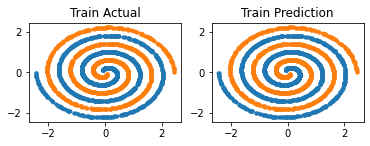

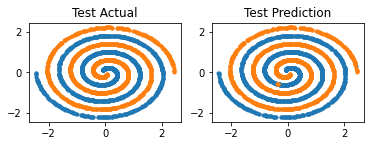

In [185]:
# Call the stats function to print out statistics for the training
stats_class(x_trn, d_trn, 'Training', model_ex6)

# Training history
plt.figure()
plt.ylabel('Loss / Accuracy')
plt.xlabel('epoch')
for k in estimator_ex6.history.keys():
    plt.plot(estimator_ex6.history[k], label = k) 
plt.legend(loc='best')

# Show the decision boundary
decision_b(x_trn, d_trn, model_ex6)

x_tst, d_tst = twospirals(1500, 3, 0)
mu, std = standard(x_tst)
x_tst = (x_tst - mu)/std

pred_trn = np.round(model_ex6.predict(x_trn).T[0])
pred_tst = np.round(model_ex6.predict(x_tst).T[0])

#Plot actual and predicted classification for training and another test set
plt.subplot(2,2,1)
plt.title('Train Actual')
plt.plot(x_trn[d_trn==0,0], x_trn[d_trn==0,1], '.')
plt.plot(x_trn[d_trn==1,0], x_trn[d_trn==1,1], '.')
plt.subplot(2,2,2)
plt.title('Train Prediction')
plt.plot(x_trn[pred_trn==0,0], x_trn[pred_trn==0,1], '.')
plt.plot(x_trn[pred_trn==1,0], x_trn[pred_trn==1,1], '.')
plt.show()
plt.subplot(2,2,3)
plt.title('Test Actual')
plt.plot(x_tst[d_tst==0,0], x_tst[d_tst==0,1], '.')
plt.plot(x_tst[d_tst==1,0], x_tst[d_tst==1,1], '.')
plt.subplot(2,2,4)
plt.title('Test Prediction')
plt.plot(x_tst[pred_tst==0,0], x_tst[pred_tst==0,1], '.')
plt.plot(x_tst[pred_tst==1,0], x_tst[pred_tst==1,1], '.')
plt.show()

In [9]:
x_grid, y_grid = tf.meshgrid(tf.linspace(-2, 2, 100), tf.linspace(-2, 2, 100))
grid_points = tf.stack([x_grid, y_grid], axis=-1)
grid_points = tf.reshape(grid_points, (-1, 2))

pred_grid = model_ex6.predict(grid_points)

plt.contourf(x_grid, y_grid, tf.reshape(pred_grid, (100, 100)), cmap='RdBu', levels=[0, 0.5, 1])

NameError: name 'model_ex6' is not defined

# The report!


### Name

Nils Broman

### Introduction

### Answers to questions

#### Question 1 
| Run        |   1       |   2      |  3       | 4       | 5      | **Avg**    |
|------------|-----------|----------|----------|---------|--------|------------|
|Accuracy    |   0.8730  |   0.8710 |  0.8690  | 0.8780  | 0.8780 | **0.8738** |
|Sensitivity |   0.9040  |   0.9100 |  0.9060  | 0.9020  | 0.9020 | **0.9048** |
|Specificity |   0.8420  |   0.8320 |  0.8320  | 0.8540  | 0.8540 | **0.8428** |
|Loss        |   0.2942  |   0.2973 |  0.2993  | 0.2926  | 0.2914 | **0.2950** |


#### Question 2
Using 9 hidden nodes the accuracy of the training dataset averaged 96% over five models for the training data, with all having an accuracy >95%. This yielded and average accuracy of roughly 82% for the validation data, see tables below.

Training data

| Run        |   1       |   2      |  3       | 4       | 5      | **Avg**    |
|------------|-----------|----------|----------|---------|--------|------------|
|Accuracy    |   0.9600  |   0.9500 |  0.9600  | 0.9600  | 0.9700 | **0.9600** |
|Sensitivity |   0.9600  |   0.9400 |  0.9600  | 0.9400  | 0.9600 | **0.9520** |
|Specificity |   0.9600  |   0.9600 |  0.9600  | 0.9800  | 0.9800 | **0.9680** |
|Loss        |   0.0739  |   0.0895 |  0.0736  | 0.0698  | 0.0634 | **0.0740** |

Validation data

| Run        |   1       |   2      |  3       | 4       | 5      | **Avg**    |
|------------|-----------|----------|----------|---------|--------|------------|
|Accuracy    |   0.8290  |   0.8340 |  0.8260  | 0.8160  | 0.8230 | **0.8256** |
|Sensitivity |   0.8780  |   0.8620 |  0.8740  | 0.8380  | 0.8480 | **0.8600** |
|Specificity |   0.7800  |   0.8060 |  0.7780  | 0.7940  | 0.7980 | **0.7912** |
|Loss        |   0.9453  |   1.0068 |  0.8629  | 1.0893  | 1.0715 | **0.9952** |


#### Question 3

The optimal number of hidden nodes for the validation set appear to be 1. 

We have fairly limited training data, so larger models increases the risk of overfitting. Since the data is very cluttered and overlapps, there doesn't seem to be any true well defined hard decision border to completely seperate the two classes.

Also, since the data is simply two normal distributions, centered around two points, the best possible decision boundary would likely be a straight line right in the middle of these two points.

#### Question 4

The optimal number of hidden nodes was 5, with models of four hidden nodes being a close runner up. Average MSE for the validation data for these models where 0.485 and 0.467 respectively. This supports the statement from last exerscise about the number of optimal hidden nodes being somewhere inbetween the number of input (6) and output nodes (1).

4 Nodes
| Run        | 1             | 2             | 3             | 4             | 5            | **Avg**          |
| ---------- | ------------- | ------------- | ------------- | ------------- | ------------ | ---------------- |
| MSE        |  0.4460845590 |  0.5619271398 |  0.5321691632 |  0.4516883194 | 0.4352715015 | **0.4854281366** |
| CorrCoeff  |  0.7573914236 |  0.6974164751 |  0.6975115823 |  0.7551949763 | 0.7633638194 | **0.7341756553** |

5 Nodes
| Run        | 1             | 2             | 3             | 4             | 5            | **Avg**          |
| ---------- | ------------- | ------------- | ------------- | ------------- | ------------ | ---------------- |
| MSE        |  0.4508243799 |  0.4954376817 |  0.4211194813 |  0.5297730565 | 0.4360170960 | **0.4666343391** |
| CorrCoeff  |  0.7549106086 |  0.7327863253 |  0.7705920436 |  0.7032118186 | 0.7603448890 | **0.7443691370** |
   

#### Question 5

1 Hidden layer with 15 nodes and L2 regularization paramater 0.01 got an average MSE of 0.365.
| Run       | 1            |   2          |  3           | 4            | 5            | **Avg**          |
|-----------|--------------|--------------|--------------|--------------|--------------|------------------|
| MSE       | 0.3583167791 | 0.3607652783 | 0.3683314621 | 0.3524079919 | 0.3871167898 | **0.3653876602** |
| CorrCoeff | 0.8344250477 | 0.8388091459 | 0.8295898273 | 0.8430562209 | 0.8182193817 | **0.8328199247** |

Clear improvement compared to no regularization. 

#### Question 6

I stuggled to find a design that gave consistant models with good performance and ended up writing several loops that tested nodes in the range of 15-50 and dropout 0.05-0.5, generating hundreds of models trying to find one with better performance than in Q5, I realized that I had misread the question. Wanting to keep the network small the design I found performed the best was

30 nodes, 10% dropout, 500 epochs, batch size 50, lr 0.025
Avg MSE: ~0.5

#### Question 7

After (again) having tried litteraly hundreds of models, trying to keep the number of nodes low, I came to the rather sad conclusion that of "bigger is better" even though I've been tought otherwise. The smaller models averaged around 90% accuracy on both validation and test set, whereas the presented model averaged 93.8%. The model structure is shown in table below. 

| Nodes | Dropout | l2   | lr    | Epochs | Batch Size |
| ----- | ------- | ---- | ----- | ------ | ---------- |
| 200   | 50%     | 0.05 | 0.005 | 1000   | 512        |

I found that using only dropout led to high loss, especially when trained longer (I tested up to 5000 epochs), and by also including l2 regulurization it learned to reduce loss during training. Since the accuracy didn't increase dramatically during longer training, I settled for 1000 epochs. I believe even 300 would be more than enough though. For almost all models, a rather low learning rate and large batch size was needed for a stable learning process. Complete performance scores over five runs is shown in table below.

| Run        | 1      | 2      | 3      | 4      | 5      | **Avg**     |
| ---------- | ------ | ------ | ------ | ------ | ------ | ----------  |
| Train Loss | 0.0694 | 0.0705 | 0.0703 | 0.0691 | 0.0634 | **0.06854** |
| Train Acc  | 0.9874 | 0.9803 | 0.9801 | 0.9801 | 0.9843 | **0.98244** |
| Val Loss   | 0.2148 | 0.1766 | 0.2024 | 0.2147 | 0.1947 | **0.20064** |
| Val Acc    | 0.9393 | 0.9420 | 0.9376 | 0.9262 | 0.9367 | **0.93636** |
| Test Loss  | 0.2227 | 0.1798 | 0.1955 | 0.1997 | 0.1862 | **0.19678** |
| Test Acc   | 0.9361 | 0.9414 | 0.9379 | 0.9327 | 0.9417 | **0.93796** |

I also played around with wider models, that performed similarly. However, they all suffered from much higher loss, which is why I picked this single layer model as my final one. 

#### Question 8
Since the targets are hard labled categoricals while the loss function is continious, we can still end up with the same lableing and accuracy even though the loss is different. The categorical crossentropy loss function used for multi-class classification is defined as 

$$L(\hat{y}, y) = -\sum_i^M \log \hat{y_i} \cdot y_i $$

where $M$ is the number of output nodes, $\hat{y_i}$ the model outputs and $y_i$ the targets. In our case there's only one correct answer, so the loss is only the negative logarithm of our predicted likelihood of the target. This metric shows how certain the model is of it's prediction. High loss could therefor cause for some alarm, since this could indicate that the model haven't found very distinct differences between the different classes, which would increase the risk of incorrectly classifying some similar future input. 

I's also worth noting that the loss can be a bit missleading. We could have a situation where the model predicts e.g. 50% for the target, 43% for some other class and 1% for other 7 classes, and another model with 44% for the target and 7% for the other 8 classes. I would argue that the latter is a better prediction in most cases, since the model is much more certain of the target in relation to the other classes, whereas with the first there's more uncertainty around the prediction. With the curent loss function however, the second model would be more punished due to it only taking the target likelihood in consideration.   

In general, I'd say accuracy is the more important metric for picking a model since in the end, this is typically the type of result we're after. It all depends on what we're going to use it for, and sometimes it might be better to prioritize something else, e.g. recall when working with diseases.

#### Question 9

For this task, I experimented with a few ways of combating the issue of imbalanced data, namely adding class weights to the loss function and a few different types of resampling (SMOTE, ROS, RUS, SMOTETomek and SMOTEENN). I found that random under/oversampling worked quite poorly while SMOTE did a decent job at improving the performance, though somewhat inconsistantly. Unfortunately I did a poor job documenting the results during my experimentation, but I ended up favouring the use of a weighted loss function as my method of choice, since it proved more reliable. As for performance measures, it depends on the intent of the model, but for this exercise I'll assume we want a balanced performance across all three classes. Accuraacy is generally a poor measure for imbalanced data, since it gives very little information of the performance on the minority class. The f1 score, i.e. the harmonic mean of precision and recall, is generally a better measurement, especially since you can use a weighted average to combat imbalances in multiclass classification. Even better is simply observing the confusion matrices to get an idea of the model performance across all three classes, though more difficult to use when comparing performance of different models. 

Best model: 

| Nodes         | Parameters | lr     | Dropout | Batch size    | Epochs |
| ------------- | ---------- | ------ | ------- | ------------- | ------ |
| 64, 32        | 2819       | 0.005  | 0.5, 0  | 128           | 500    |

Stats: 

| Metric | Train | Val  | Test |
| ------ | ----- | ---- | ---- |
| wF1    |  0.89 | 0.67 | 0.63 |

#### Question 10
I found that this dataset was much more sensitive to learning rate than the ones in previous exercises, needing it to be low, where 0.001 produced good results for batch size 100. Initially I hade trouble finding a design that was capable of solving the problem, but once I started to scale in both width and depth I started to consistently find well performing models. The first design in the table below generated models with perfect accuracy nearly every time, with a clean decision boundary, which worked just as well on a second generated "test" set. However, it was a pretty large model with a total of 835 parameters. The second design that worked quite consistently had less than half the parameters, but resulted in a more messy desicion boundary, that crossed the spiral at some small gaps, which resulted in worse performance on the second set. This "test" set was not part of the exercise, but shows if the model actually finds the spiral pattern or just fits the generated data set. 

However, since the task was to find a model as small as possible to only fit the training set, I figured I could probably go smaller if I increased the batch size such that the gradient updates always considered the entire set, and increase the number of epochs to intentionally overfit the models. This allowed me to find an even smaller design with only 129 parameters, that aditionally could be trained much quicker due to higher learning rate and fewer updates per epoch. Ignoring the urge of fast training by reducing the elarning rate and training for even more epochs allowed for an even smaller design of 105 parameters. These models resulted in quite messu desicion boundaries however, and performed worse on the "test" set.  


| Nodes         | Parameters | lr     | Batch size    | Epochs (tot/peak) | Training time |
| ------------- | ---------- | ------ | ------------- | ----------------- | ------------- |
| 24, 18, 12, 6 | 835        | 0.001  | 100           | 1000/500          | ~3 min        |
| 12, 12, 12    | 361        | 0.001  | 100           | 1000/700          | ~2 min        |
| 10, 6, 4      | 129        | 0.005  | 3000          | 5000/2000         | ~30 s         |
| 8, 8          | 105        | 0.0005 | 3000          | 50000/30000       | ~5 min        |


### Summary

Through this lab, one thing that I've learnt time and time again, is the danger of getting data bias. I couldn't seem to stop myself from tweaking the parameters to the point that I pretty much had to start from scratch and redesign the entire model, only to do it all over again. One day I also hope to learn to keep record of my actions such that it allows me to take a few steps back to a more stable ground, instead of having to start over. I've also learnt the value of trying large variations of models rather than fixating on small tweaks too early. 




---
Some rule of thumb from [Ari Cooper-Davis at StackExchange](https://stats.stackexchange.com/questions/181/how-to-choose-the-number-of-hidden-layers-and-nodes-in-a-feedforward-neural-netw). 

$$
N_{h}=\frac{N_{s}}{\left(\alpha *\left(N_{i}+N_{o}\right)\right)}
$$

$$
\begin{aligned}
&N_{i}=\text { number of input neurons. } \\
&N_{o}=\text { number of output neurons. } \\
&N_{s}=\text { number of samples in training data set. } \\
&\alpha=\text { an arbitrary scaling factor usually 2-10. }
\end{aligned}
$$

---